# Setup environment

In [1]:
import os
import numpy as np
import pandas as pd
pd.set_option('display.precision', 10)
import matplotlib.pyplot as plt
from datetime import datetime
from pytz import timezone
import copy
import pathlib
import pickle

from sklearn.metrics import mean_squared_error, mean_absolute_error, root_mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split

from src.lightgbm_wrapper.feature_engineer import add_time_features, add_lag_features, add_rolling_features
from src.lightgbm_wrapper.station_embedding import learn_station_embeddings, attach_station_embedding
from src.lightgbm_wrapper.plot import plot_1_data, plot_2_data
from src.lightgbm_wrapper.model import build_supervised_for_horizon, train_test_validation_split, train_lgbm_for_horizon, plot_timeseries_example

try:
    import lightgbm as lgb
except:
    print("lightgbm is not installed")

DATA_DIR = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station"
STATION_IDS = [211, 212, 213, 214, 215, 216]

BASE_FEATURE_COLS = [
    "NO2_quantrac",
    "PM25_quantrac",
    "O3_quantrac",
    "CO_quantrac",
    "Temperature_quantrac",
    "Humid_quantrac",
]

# Define lag and rolling windows for feature engineering
LAG_STEPS = [3, 6, 12, 24, 48, 71]
ROLL_WINDOWS = [3, 6, 12, 24, 48, 71]

# Define horizon (= n_past = n_future)
HORIZONS = [1, 24, 48, 72]

'''
# Directory to save the results and meta data
LIGHTGBM_DIR = f"/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/{datetime.now(timezone('Asia/Saigon')).strftime('%Y_%m_%d-%H_%M_%S')}"
pathlib.Path(LIGHTGBM_DIR).mkdir(parents=True, exist_ok=True)
print(LIGHTGBM_DIR)
with open(os.path.join(LIGHTGBM_DIR, "CONFIGURATIONS.txt"), "w") as f:
    f.write(f"BASE_FEATURE_COLS: {BASE_FEATURE_COLS}\n")
    f.write(f"LAG_STEPS: {LAG_STEPS}\n")
    f.write(f"ROLL_WINDOWS: {ROLL_WINDOWS}\n")
    f.write(f"HORIZONS: {HORIZONS}\n")
'''

# Store the results in one directory only, for testing API purpose
LIGHTGBM_DIR = f"/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/no2_o3_co_testing_model"
if os.path.isdir(LIGHTGBM_DIR):
    import shutil
    shutil.rmtree(LIGHTGBM_DIR)
pathlib.Path(LIGHTGBM_DIR).mkdir(parents=True, exist_ok=True)
print(LIGHTGBM_DIR)
with open(os.path.join(LIGHTGBM_DIR, "CONFIGURATIONS.txt"), "w") as f:
    f.write(f"BASE_FEATURE_COLS: {BASE_FEATURE_COLS}\n")
    f.write(f"LAG_STEPS: {LAG_STEPS}\n")
    f.write(f"ROLL_WINDOWS: {ROLL_WINDOWS}\n")
    f.write(f"HORIZONS: {HORIZONS}\n")

/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/no2_o3_co_testing_model


# Load dataset

In [2]:
def load_station_csv(station_id, data_dir=DATA_DIR):
    csv_path = os.path.join(data_dir, f"{station_id}.csv")
    df = pd.read_csv(csv_path)

    # Convert to datetime
    df["date"] = pd.to_datetime(df["date"])
    df = df.sort_values("date").reset_index(drop=True)

    # Remove unncessary column
    if "Unnamed: 0" in df.columns:
        df = df.drop(columns=["Unnamed: 0"])

    # Add station_id column
    df["station_id"] = station_id
    return df

# Load dataset
dfs = []
for sid in STATION_IDS:
    df_sid = load_station_csv(sid, DATA_DIR)
    dfs.append(df_sid)
df_all = pd.concat(dfs, ignore_index=True)

# Sort data by station then date
df_all = df_all.sort_values(["station_id", "date"]).reset_index(drop=True)

# Remove uncessary features
df_all = df_all.loc[:, ["date"] + BASE_FEATURE_COLS + ["station_id"]]

print(df_all.shape)
print(df_all.columns)
df_all

(92966, 8)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id'],
      dtype='object')


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211
...,...,...,...,...,...,...,...,...
92961,2022-12-31 19:00:00,0.0882333333,41.4500000000,75.9166666667,2.0871666667,27.6900000000,67.2900000000,216
92962,2022-12-31 20:00:00,0.0832166667,50.5300000000,66.1166666667,2.0065000000,27.4016666667,68.0266666667,216
92963,2022-12-31 21:00:00,0.0843000000,55.0550000000,55.1333333333,2.4188333333,27.6033333333,66.9650000000,216
92964,2022-12-31 22:00:00,0.0666500000,26.0783333333,46.7500000000,1.4815000000,27.0366666667,63.3616666667,216


In [3]:
df_all.isnull().sum()

date                        0
NO2_quantrac            43684
PM25_quantrac           43043
O3_quantrac             47797
CO_quantrac             43760
Temperature_quantrac    52890
Humid_quantrac          52890
station_id                  0
dtype: int64

# Data preparation

## Drop missing

Output: df_dropped

In [4]:
df_dropped_na = df_all.dropna().reset_index(drop=True)

df_dropped = df_dropped_na.reset_index(drop=True)
df_dropped

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211
...,...,...,...,...,...,...,...,...
38704,2022-12-31 19:00:00,0.0882333333,41.4500000000,75.9166666667,2.0871666667,27.6900000000,67.2900000000,216
38705,2022-12-31 20:00:00,0.0832166667,50.5300000000,66.1166666667,2.0065000000,27.4016666667,68.0266666667,216
38706,2022-12-31 21:00:00,0.0843000000,55.0550000000,55.1333333333,2.4188333333,27.6033333333,66.9650000000,216
38707,2022-12-31 22:00:00,0.0666500000,26.0783333333,46.7500000000,1.4815000000,27.0366666667,63.3616666667,216


## Visualization

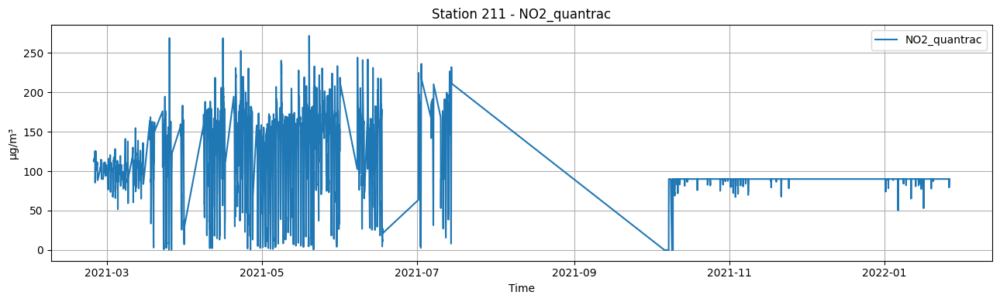

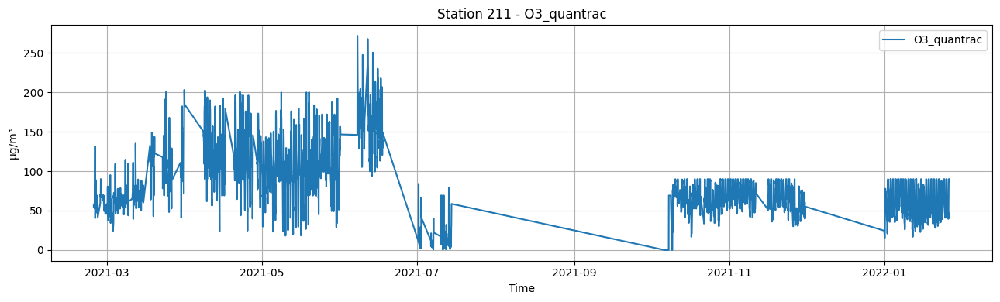

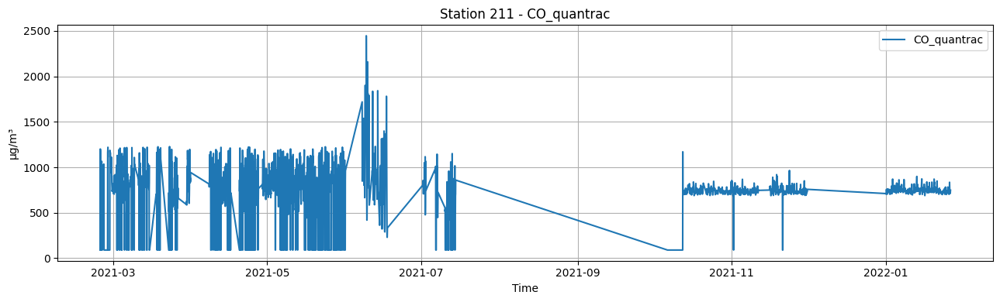

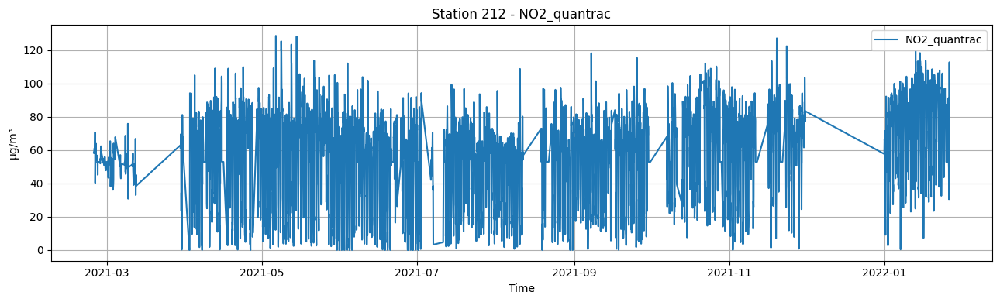

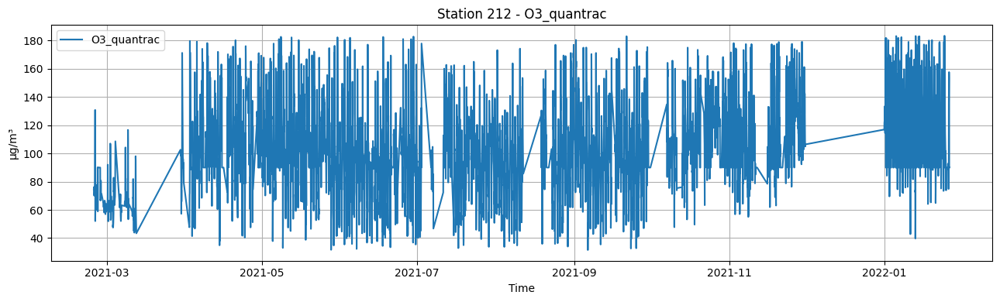

...

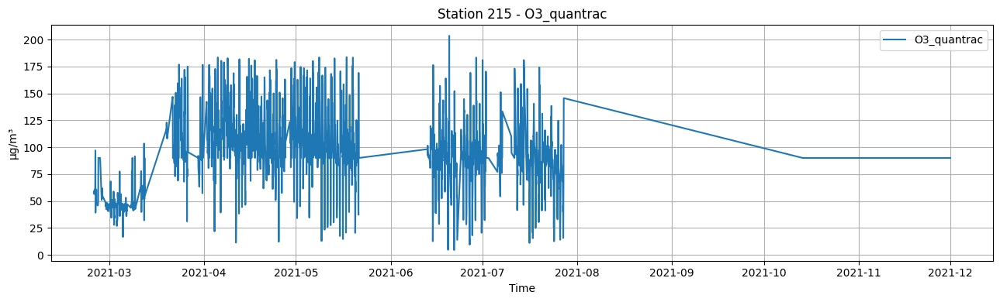

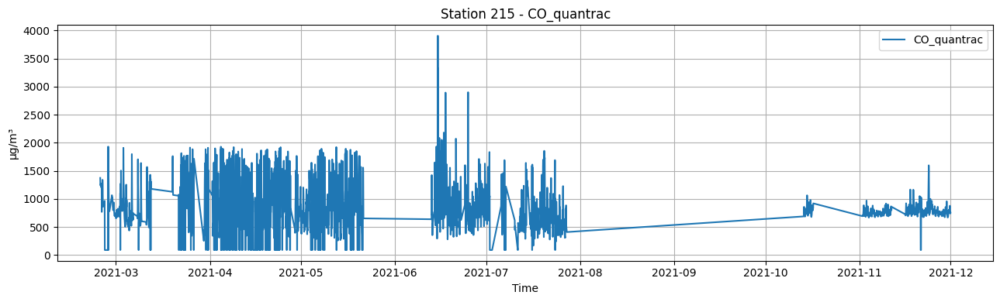

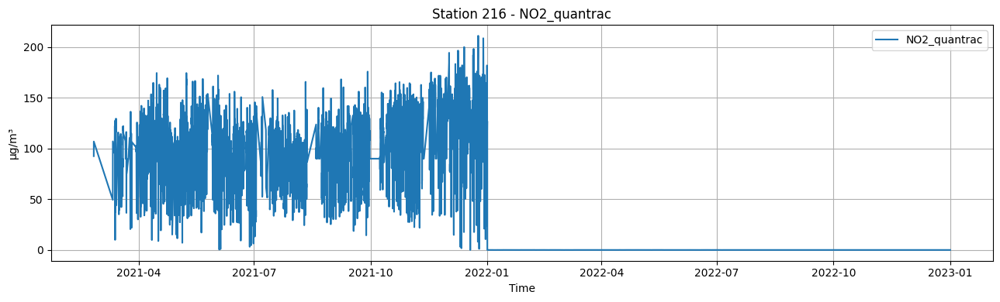

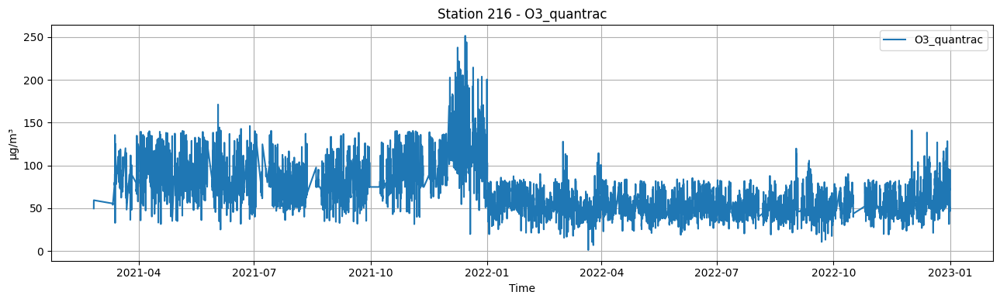

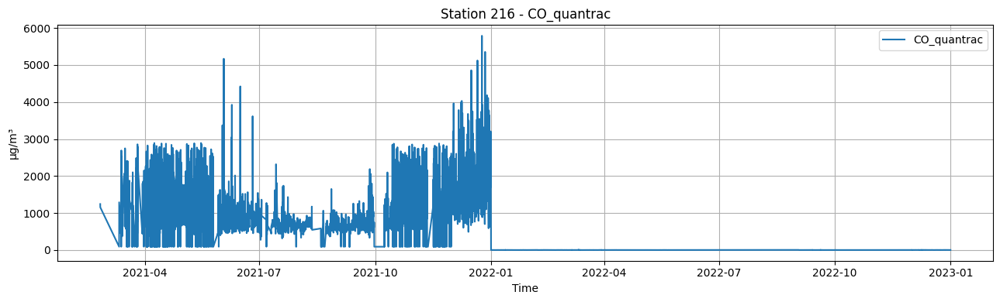

In [5]:
for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, target_col, df_station["date"], f"Station {station} - {target_col}")
            #plot_1_data(df_station, target_col, target_col, df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Convert ppm to ug/m3

Apply only to station 216, year 2022 on NO2, CO columns

Output: df_converted

In [6]:
df_converted = copy.deepcopy(df_dropped)
mask = (df_converted["station_id"] == 216) & (df_converted["date"] >= "2022-01-01")
df_converted.loc[mask, "NO2_quantrac"] = df_converted.loc[mask, "NO2_quantrac"].apply(lambda x: x * 1883.2)
df_converted.loc[mask, "CO_quantrac"] = df_converted.loc[mask, "CO_quantrac"].apply(lambda x: x * 1146.8)
df_converted

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211
...,...,...,...,...,...,...,...,...
38704,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216
38705,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216
38706,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216
38707,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216


## Visualization after converting unit

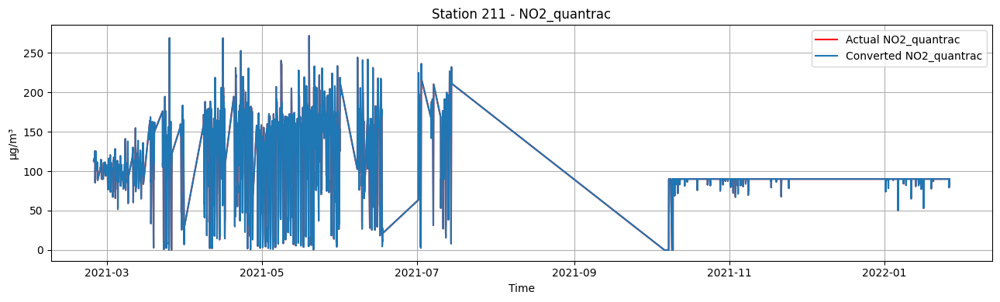

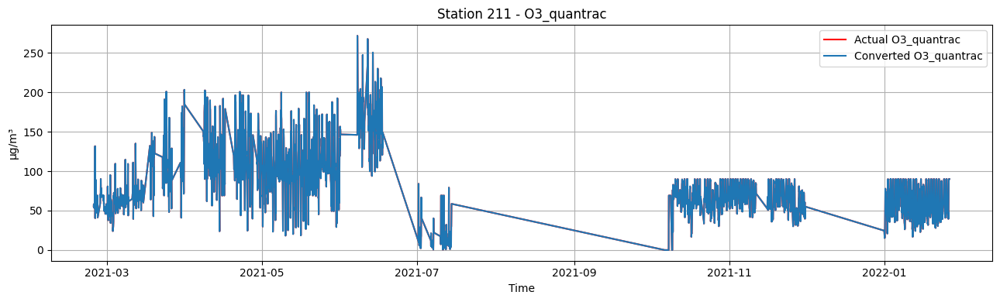

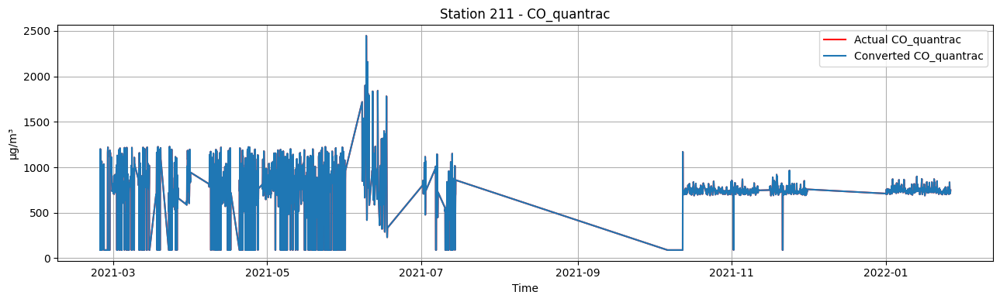

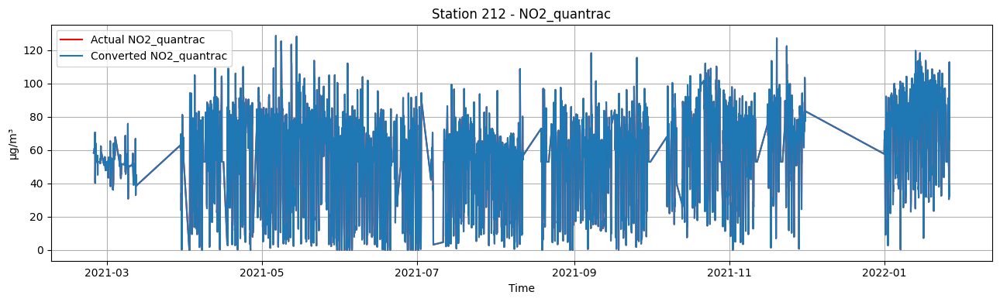

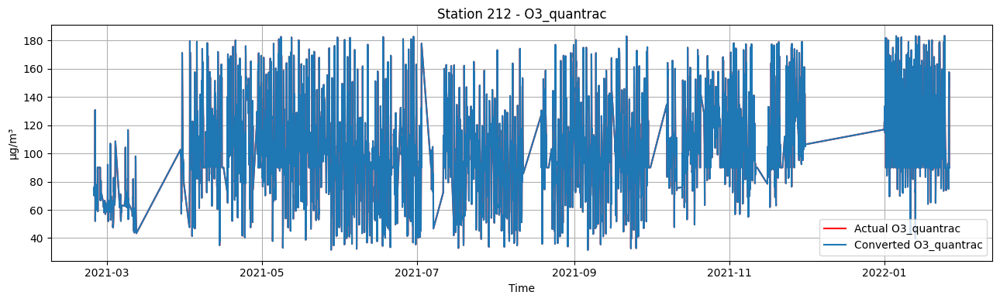

...

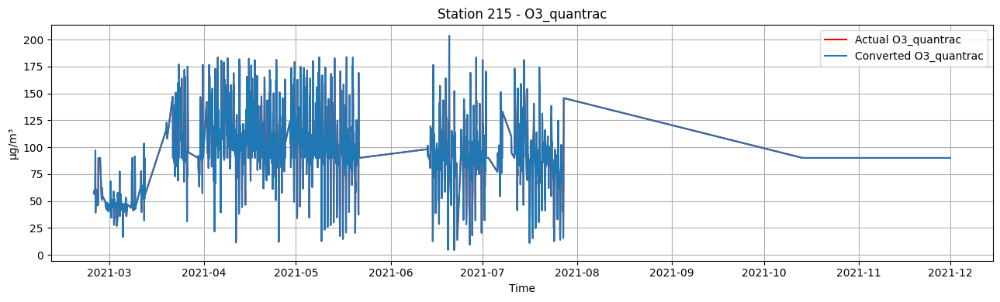

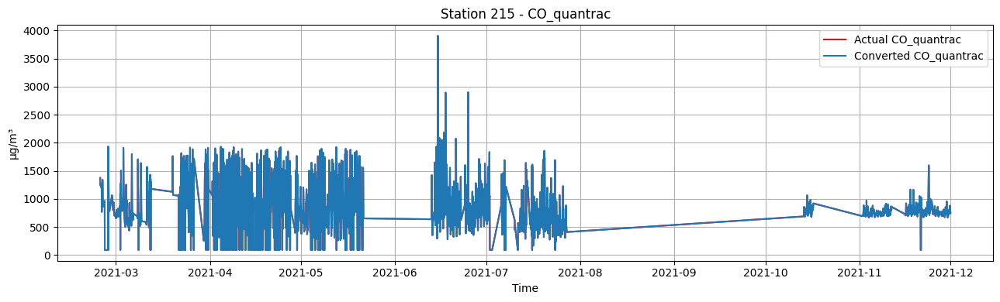

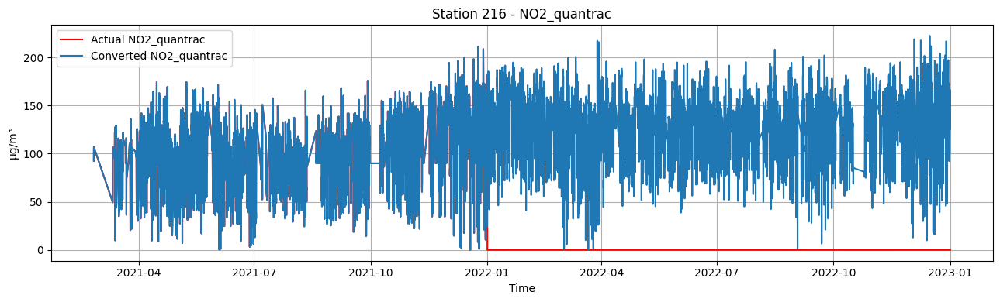

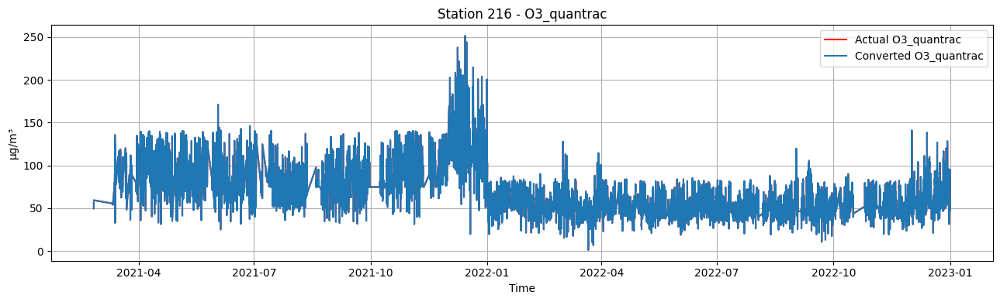

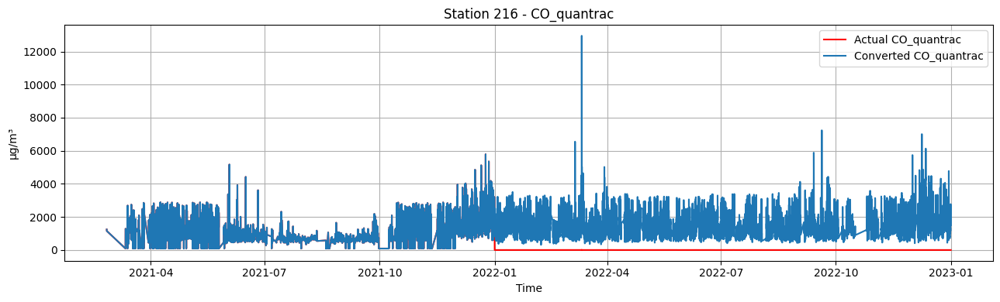

In [7]:
for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    df_station_converted = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_2_data(df_station, target_col, f"Actual {target_col}",
                        df_station_converted, target_col, f"Converted {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Ugly hack to remove outliers

In [8]:
test = copy.deepcopy(df_converted)

lenbefore = len(test)
print(f"Before: {lenbefore} records")

# 212 CO quantrac
test212 = test[test["station_id"] == 212]
test = test.drop(index=test212[test212["CO_quantrac"] > 4000].index)

# 213 CO quantrac
test213 = test[test["station_id"] == 213]
test = test.drop(index=test213[test213["CO_quantrac"] > 4000].index)

# 214 CO quantrac
test214 = test[test["station_id"] == 214]
test = test.drop(index=test214[test214["CO_quantrac"] > 4000].index)

# 215 NO2 quantrac
# 215 CO quantrac
test215 = test[test["station_id"] == 215]
test = test.drop(index=test215[test215["NO2_quantrac"] > 140].index)
test = test.drop(index=test215[test215["CO_quantrac"] > 2500].index)

# 216 CO quantrac
test216 = test[test["station_id"] == 216]
test = test.drop(index=test216[test216["CO_quantrac"] > 10000].index)

lenafter = len(test)
print(f"After: {lenafter} records")
print(f"Removed {lenbefore - lenafter} records")

df_converted = test.reset_index(drop=True)

Before: 38709 records
After: 38692 records
Removed 17 records


## Visualization after removing outliers

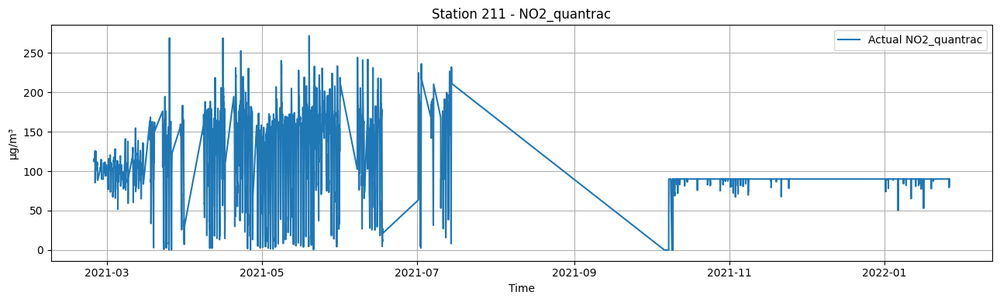

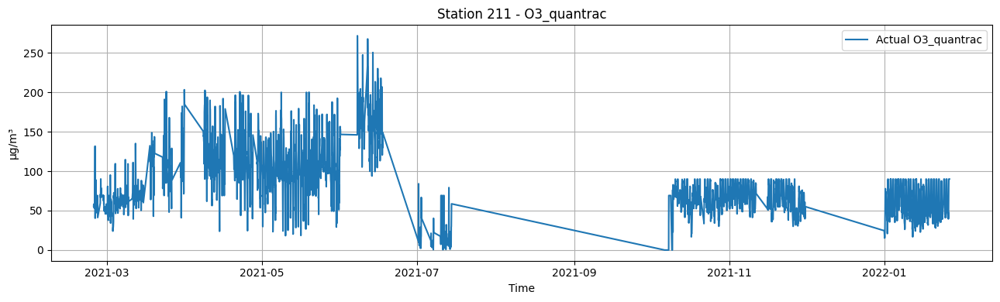

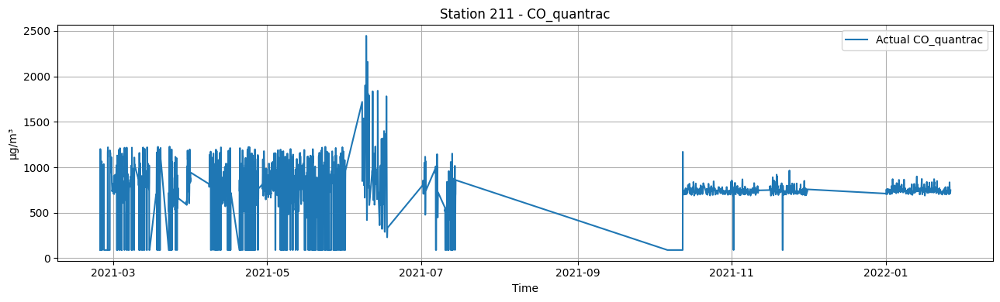

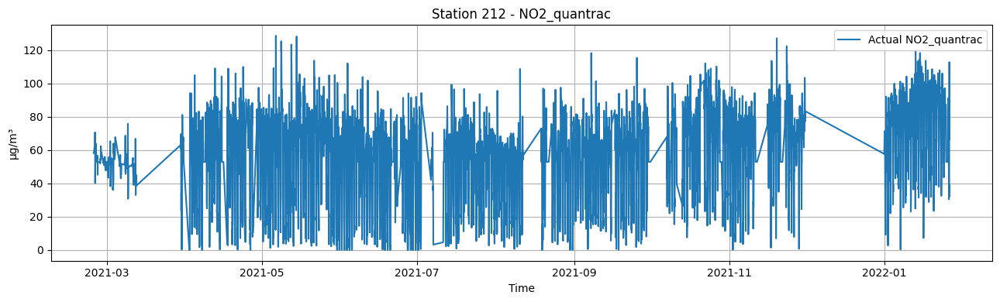

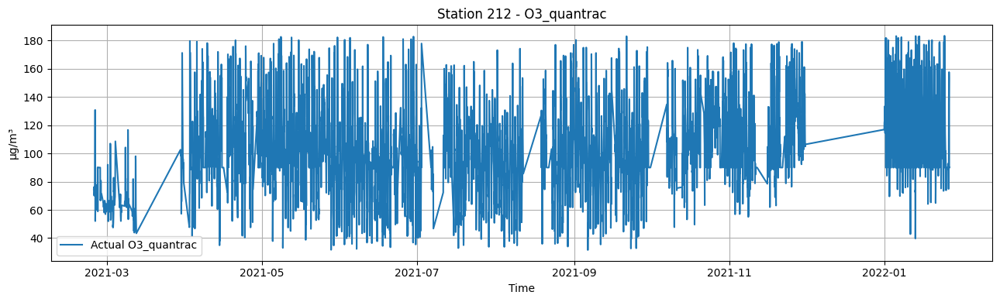

...

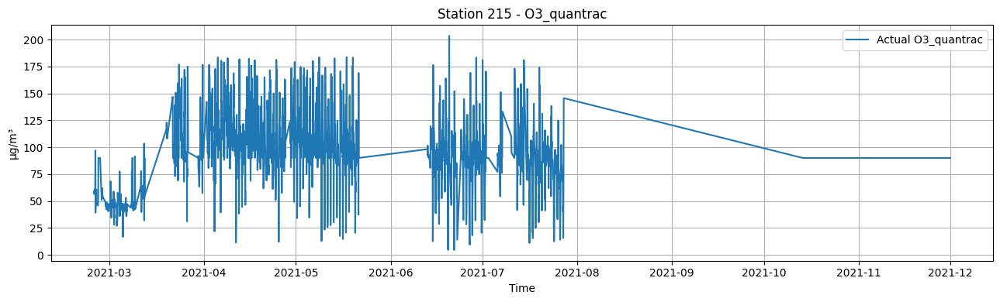

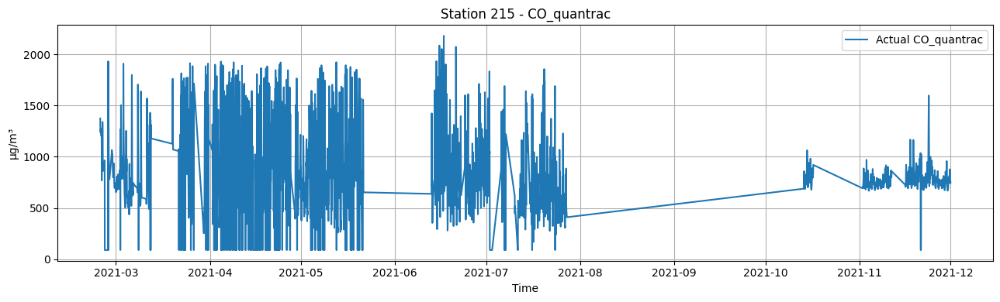

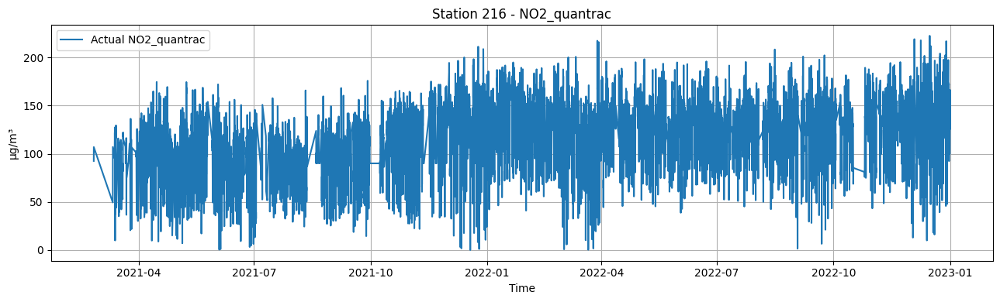

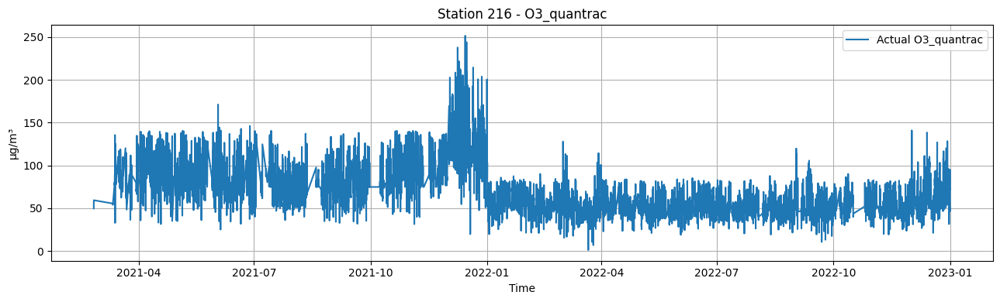

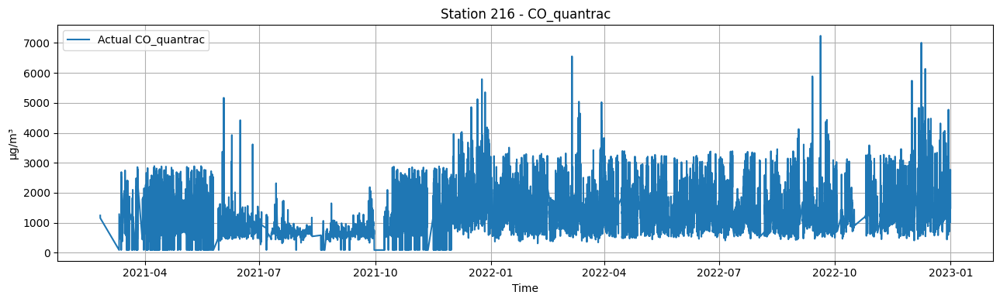

In [9]:
for station in STATION_IDS:
    df_station = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, f"Actual {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Feature engineering

### Time features

In [10]:
# Add time features and lag feature for all gases
dftestno2 = add_time_features(df_converted)
dftestno2 = add_lag_features(dftestno2, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=[3, 6, 12, 24])
dftestno2 = add_rolling_features(dftestno2, group_col="station_id", target_cols=["NO2_quantrac"], windows=[3, 6, 12, 24])
print(dftestno2.shape)
print(dftestno2.columns)
dftestno2

(38692, 43)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id', 'hour',
       'dayofweek', 'month', 'NO2_quantrac_lag3', 'NO2_quantrac_lag6',
       'NO2_quantrac_lag12', 'NO2_quantrac_lag24', 'PM25_quantrac_lag3',
       'PM25_quantrac_lag6', 'PM25_quantrac_lag12', 'PM25_quantrac_lag24',
       'O3_quantrac_lag3', 'O3_quantrac_lag6', 'O3_quantrac_lag12',
       'O3_quantrac_lag24', 'CO_quantrac_lag3', 'CO_quantrac_lag6',
       'CO_quantrac_lag12', 'CO_quantrac_lag24', 'Temperature_quantrac_lag3',
       'Temperature_quantrac_lag6', 'Temperature_quantrac_lag12',
       'Temperature_quantrac_lag24', 'Humid_quantrac_lag3',
       'Humid_quantrac_lag6', 'Humid_quantrac_lag12', 'Humid_quantrac_lag24',
       'NO2_quantrac_roll3_mean', 'NO2_quantrac_roll3_std',
       'NO2_quantrac_roll6_mean', 'NO2_quantrac_roll6_std',
       'NO2_quantrac_roll12_mean', 'NO2_quantrac_roll12_std',
       'NO2_quantrac

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,Humid_quantrac_lag12,Humid_quantrac_lag24,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,NaN,NaN,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,NaN,NaN,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,NaN,NaN,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,NaN,NaN,112.5159235333,0.1697189071,112.5721331250,0.1784406841,112.5721331250,0.1784406841,112.5721331250,0.1784406841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,68.0600000000,71.9266666667,147.2034666667,18.8622115885,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,66.5483333333,72.9183333333,160.5741866667,6.5995644704,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,64.6833333333,78.1200000000,161.7145688889,4.7480395477,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,61.6400000000,82.1033333333,160.5428000000,4.9712952838,153.8731333333,14.3380635114,135.2451466667,23.8597941057,135.8343141013,22.5466882334


### Station embedding

In [11]:
test_station_to_embedding, _ = learn_station_embeddings(dftestno2, target_col="NO2_quantrac", station_col="station_id", embed_dim=4)
print(test_station_to_embedding)

dftestno2, _ = attach_station_embedding(dftestno2, test_station_to_embedding, station_col="station_id")
display(dftestno2)

[Embed] epoch 001 | train MSE=8945.3569 | val MSE=8836.1859
[Embed] epoch 010 | train MSE=6346.3705 | val MSE=5962.2047
[Embed] epoch 020 | train MSE=1944.6327 | val MSE=1794.4738
[Embed] epoch 030 | train MSE=1023.6253 | val MSE=1017.0699
[Embed] epoch 040 | train MSE=974.4662 | val MSE=987.2691
[Embed] epoch 050 | train MSE=974.0785 | val MSE=987.6006
{211: [7.782829, -4.09747, -4.5961213, 3.8078797], 212: [3.5855365, -3.9908829, -2.4162335, 1.0250082], 213: [2.9658248, -3.1664917, -2.539614, 2.5171337], 214: [1.5897979, -2.4742687, -4.4660373, 2.1730874], 215: [2.984351, -3.522223, -1.998513, 2.4715588], 216: [5.107183, -5.4918914, -6.1699085, 6.0908666]}


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,112.5721331250,0.1784406841,112.5721331250,0.1784406841,112.5721331250,0.1784406841,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,153.8731333333,14.3380635114,135.2451466667,23.8597941057,135.8343141013,22.5466882334,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657


## Build supervised from time-series

In [12]:
# Example
Xdummy, ydummy = build_supervised_for_horizon(dftestno2, horizon_h=1, target_col="NO2_quantrac")
print("Horizon 1h:", Xdummy.shape, ydummy.shape)
print(Xdummy.columns)
print(ydummy.columns)
display(Xdummy)
display(ydummy)

Horizon 1h: (38542, 46) (38542, 3)
Index(['date', 'station_id', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'hour', 'dayofweek', 'month',
       'NO2_quantrac_lag3', 'NO2_quantrac_lag6', 'NO2_quantrac_lag12',
       'NO2_quantrac_lag24', 'PM25_quantrac_lag3', 'PM25_quantrac_lag6',
       'PM25_quantrac_lag12', 'PM25_quantrac_lag24', 'O3_quantrac_lag3',
       'O3_quantrac_lag6', 'O3_quantrac_lag12', 'O3_quantrac_lag24',
       'CO_quantrac_lag3', 'CO_quantrac_lag6', 'CO_quantrac_lag12',
       'CO_quantrac_lag24', 'Temperature_quantrac_lag3',
       'Temperature_quantrac_lag6', 'Temperature_quantrac_lag12',
       'Temperature_quantrac_lag24', 'Humid_quantrac_lag3',
       'Humid_quantrac_lag6', 'Humid_quantrac_lag12', 'Humid_quantrac_lag24',
       'NO2_quantrac_roll3_mean', 'NO2_quantrac_roll3_std',
       'NO2_quantrac_roll6_mean', 'NO2_quantrac_roll6_std',
       'NO2_quantrac_roll12_mean', 'NO2_quantrac_roll12_std',
       'NO2_q

,date,station_id,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,hour,dayofweek,month,...,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-24 21:00:00,211,15.7116666700,55.9127833300,896.5540000000,27.8000000000,66.0550000000,21,2,2,...,110.9782539833,8.7910802916,108.7458061667,11.6703996987,111.2911683250,8.5276176290,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
1,2021-02-24 22:00:00,211,15.6533333300,53.4917500000,931.1250000000,27.8000000000,66.2716666700,22,2,2,...,112.9722778000,7.1361384153,108.1629089417,11.2547508374,111.2790324125,8.5256720042,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
2,2021-02-24 23:00:00,211,15.5950000000,50.6454000000,934.5630000000,27.8000000000,66.2166666700,23,2,2,...,114.2321722333,5.4976888124,106.9186978250,9.9132556170,111.2027683583,8.5237078586,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3,2021-02-25 00:00:00,211,15.1866666700,51.4960333300,1004.0870000000,27.7966666700,66.3783333300,0,3,2,...,111.8796722333,1.2625489371,109.0581658833,7.2617421674,111.1348072500,8.5177478315,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
4,2021-02-25 01:00:00,211,15.3450000000,51.6269000000,1024.5240000000,27.7800000000,66.4683333300,1,3,2,...,111.4353111167,1.4959850529,110.0305325500,6.3819593962,111.0197961375,8.5174176826,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38537,2022-12-31 18:00:00,216,36.6416666667,85.6000000000,1687.5162000000,28.1816666667,64.2983333333,18,5,12,...,118.6259066667,19.0129302674,128.6670244444,17.1541920845,136.7144485457,23.9144727000,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38538,2022-12-31 19:00:00,216,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,19,5,12,...,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38539,2022-12-31 20:00:00,216,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,20,5,12,...,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38540,2022-12-31 21:00:00,216,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,21,5,12,...,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657


,date,station_id,NO2_quantrac_t_plus_1h
0,2021-02-24 21:00:00,211,110.5361333000
1,2021-02-24 22:00:00,211,111.0693667000
2,2021-02-24 23:00:00,211,109.7206000000
3,2021-02-25 00:00:00,211,108.5600333000
4,2021-02-25 01:00:00,211,110.3479333000
...,...,...,...
38537,2022-12-31 18:00:00,216,166.1610133333
38538,2022-12-31 19:00:00,216,156.7136266667
38539,2022-12-31 20:00:00,216,158.7537600000
38540,2022-12-31 21:00:00,216,125.5152800000


## Split train/validation/test for each station

In [13]:
# Example
(X_train_dummy, y_train_dummy, meta_train_dummy,
 X_val_dummy, y_val_dummy, meta_val_dummy,
 X_test_dummy, y_test_dummy, meta_test_dummy) = train_test_validation_split(Xdummy, ydummy)
display(X_test_dummy)
display(y_test_dummy)

,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,hour,dayofweek,month,NO2_quantrac_lag3,NO2_quantrac_lag6,...,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
3329,26.1833333300,35.8462000004,741.5384000000,24.0700000000,81.9216666700,4,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,89.4493298596,1.9075773226,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3330,14.0833333300,20.8097354148,725.9719000000,23.6400000000,80.2966666700,5,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3331,15.4000000000,21.1161272138,738.6734000000,23.5500000000,79.6700000000,6,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3332,20.7166666700,30.0598503566,757.8498000000,23.9883333300,80.2866666700,7,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3333,21.9166666700,51.8978718504,749.9997000000,26.6766666700,72.2516666700,8,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38537,36.6416666667,85.6000000000,1687.5162000000,28.1816666667,64.2983333333,18,5,12,112.6153600000,111.9562400000,...,118.6259066667,19.0129302674,128.6670244444,17.1541920845,136.7144485457,23.9144727000,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38538,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,19,5,12,126.0488533333,99.5898933333,...,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38539,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,20,5,12,153.2924800000,108.2526133333,...,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38540,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,21,5,12,162.2690666667,112.6153600000,...,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657


,NO2_quantrac_t_plus_1h
3329,90.0000000000
3330,90.0000000000
3331,90.0000000000
3332,90.0000000000
3333,90.0000000000
...,...
38537,166.1610133333
38538,156.7136266667
38539,158.7537600000
38540,125.5152800000


# LightGBM model

## Add time and lags features

In [14]:
# Add time features and lag feature for all gases
df_time_feats = add_time_features(df_converted)
df_lag_feats = add_lag_features(df_time_feats, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=LAG_STEPS)

## Training for NO2

In [15]:
label = "NO2_quantrac"

# Add rolling features for LABEL
df_no2 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Station embedding
no2_station_to_embedding, _ = learn_station_embeddings(df_no2, target_col=label, station_col="station_id", embed_dim=4)
df_no2, _ = attach_station_embedding(df_no2, no2_station_to_embedding, station_col="station_id")
print(no2_station_to_embedding)
with open(os.path.join(LIGHTGBM_DIR, f"{label}_station_embedding.pkl"), 'wb') as no2_emb_file:
    pickle.dump(no2_station_to_embedding, no2_emb_file)

# Print dataset
display(df_no2)

# Start running model
no2_all_metrics = []
no2_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_no2, horizon_h=h, target_col=label)
    no2_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    no2_all_metrics.append(metrics_by_station)

# Metrics table
no2_df_metrics_all = pd.concat(no2_all_metrics, ignore_index=True)
no2_df_metrics_all = no2_df_metrics_all.sort_values(["station", "horizon_h"]).reset_index(drop=True)
no2_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
no2_df_metrics_all

[Embed] epoch 001 | train MSE=8945.3569 | val MSE=8836.1859
[Embed] epoch 010 | train MSE=6346.3705 | val MSE=5962.2047
[Embed] epoch 020 | train MSE=1944.6327 | val MSE=1794.4738
[Embed] epoch 030 | train MSE=1023.6253 | val MSE=1017.0699
[Embed] epoch 040 | train MSE=974.4662 | val MSE=987.2691
[Embed] epoch 050 | train MSE=974.0785 | val MSE=987.6006
{211: [7.782829, -4.09747, -4.5961213, 3.8078797], 212: [3.5855365, -3.9908829, -2.4162335, 1.0250082], 213: [2.9658248, -3.1664917, -2.539614, 2.5171337], 214: [1.5897979, -2.4742687, -4.4660373, 2.1730874], 215: [2.984351, -3.522223, -1.998513, 2.4715588], 216: [5.107183, -5.4918914, -6.1699085, 6.0908666]}


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,NO2_quantrac_roll48_mean,NO2_quantrac_roll48_std,NO2_quantrac_roll71_mean,NO2_quantrac_roll71_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,112.5721331250,0.1784406841,112.5721331250,0.1784406841,112.5721331250,0.1784406841,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,137.2270974346,24.3389891274,149.0162092153,26.2871324723,149.6282313162,33.5856868466,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,137.0636252124,24.1209076873,148.8579681042,26.1575760067,148.9147372317,32.6633175573,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,136.3835807679,23.2780210582,148.3289719931,25.7240543085,148.1313967622,31.7755792228,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,135.8343141013,22.5466882334,147.7620503264,25.1708505476,147.6048964806,31.2745676823,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657



===== Training LightGBM for horizon = 1h, target_col = NO2_quantrac =====

X.shape = (38260, 62)
y.shape = (38260, 3)

Number of features: 62

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag71
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag71
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag71
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag71
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag71
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
Humid_quantrac_lag48
Humid_quantrac_lag71
NO2_quant

,date,target
0,2022-01-02,88.7008178222
1,2022-01-03,90.0000000000
2,2022-01-04,89.9384786957
3,2022-01-05,90.0000000000
4,2022-01-06,88.2903867585
5,2022-01-07,90.0000000000
6,2022-01-08,89.5619537858
7,2022-01-09,89.3604280386
8,2022-01-10,90.0000000000
9,2022-01-11,87.7334059784


,date,target
0,2022-01-02,87.8492537168
1,2022-01-03,90.7193180236
2,2022-01-04,91.2745569674
3,2022-01-05,91.0187216516
4,2022-01-06,90.8837989011
5,2022-01-07,89.7782957046
6,2022-01-08,90.4071924119
7,2022-01-09,87.9249084265
8,2022-01-10,91.1547035634
9,2022-01-11,88.4755975070


sid = 212, grp =                     date  station_id          y_true         y_pred
8783 2021-11-19 17:00:00         212   96.4211333300  83.5343160081
8784 2021-11-19 18:00:00         212   71.0141333300  94.0525280666
8785 2021-11-19 19:00:00         212   71.1082333300  88.1343184733
8786 2021-11-19 20:00:00         212   71.2023333300  83.2941896043
8787 2021-11-19 21:00:00         212   84.1881333300  79.3732459629
...                  ...         ...             ...            ...
9645 2022-01-26 11:00:00         212   39.4906333300  24.7354297116
9646 2022-01-26 12:00:00         212   32.0881000000  30.5871666983
9647 2022-01-26 13:00:00         212   55.1739666700  29.0665783303
9648 2022-01-26 14:00:00         212  112.7631667000  44.2032895241
9649 2022-01-26 15:00:00         212   66.4261521997  95.0986020596

[867 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(

,date,target
0,2021-11-20,80.6267998571
1,2021-11-21,56.9423845343
2,2021-11-23,76.9806051246
3,2021-11-24,67.7291059379
4,2021-11-25,67.7936699283
5,2021-11-26,54.1290871168
6,2021-11-27,64.9021400388
7,2021-11-28,62.9656089087
8,2021-11-29,69.5948367342
9,2021-11-30,76.3476834750


,date,target
0,2021-11-20,71.2622390794
1,2021-11-21,61.7290944930
2,2021-11-23,69.4332673806
3,2021-11-24,63.4835095279
4,2021-11-25,64.2731337353
5,2021-11-26,63.5765206662
6,2021-11-27,64.9405276965
7,2021-11-28,63.0246923283
8,2021-11-29,66.2290922663
9,2021-11-30,69.1090837782


sid = 213, grp =                      date  station_id         y_true         y_pred
14634 2021-12-20 20:00:00         213   79.451766670  87.1388473384
14635 2021-12-20 21:00:00         213   79.294933330  85.7342247815
14636 2021-12-20 22:00:00         213   89.928233330  73.1911459488
14637 2021-12-20 23:00:00         213  102.976766700  74.6971822680
14638 2021-12-21 00:00:00         213  139.268000000  86.2638723502
...                   ...         ...            ...            ...
15509 2022-01-26 11:00:00         213   12.515300000  23.4558294357
15510 2022-01-26 12:00:00         213    8.249433333  21.2266713870
15511 2022-01-26 13:00:00         213   10.100066670  27.1906722742
15512 2022-01-26 14:00:00         213   52.727366670  40.5912821706
15513 2022-01-26 15:00:00         213   81.060428570  73.8065753754

[880 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), datetime.date(

,date,target
0,2021-12-21,71.0710407932
1,2021-12-22,74.7910255633
2,2021-12-23,52.4447122413
3,2021-12-24,60.1148074675
4,2021-12-25,69.1498324612
5,2021-12-26,63.1175085451
6,2021-12-27,70.2495448313
7,2021-12-28,83.7546399952
8,2021-12-29,69.7778303471
9,2021-12-30,46.9945102408


,date,target
0,2021-12-21,63.7181368867
1,2021-12-22,70.2252984674
2,2021-12-23,58.2405465283
3,2021-12-24,59.2018733504
4,2021-12-25,62.2260072182
5,2021-12-26,64.2183999780
6,2021-12-27,64.5196589319
7,2021-12-28,73.0777537632
8,2021-12-29,74.1344203857
9,2021-12-30,54.2084059087


sid = 214, grp =                      date  station_id          y_true          y_pred
20644 2021-11-23 16:00:00         214  121.1743860000   96.8471235967
20645 2021-11-23 17:00:00         214  125.3412000000  104.4954016979
20646 2021-11-23 18:00:00         214   74.8802630052  106.0585784368
20647 2021-11-23 19:00:00         214  132.6496333000  101.3591903653
20648 2021-11-23 20:00:00         214  123.3337333000   98.8193726056
...                   ...         ...             ...             ...
21545 2021-12-31 18:00:00         214  121.6713000000   86.5415033679
21546 2021-12-31 19:00:00         214  106.3016333000   87.6815413948
21547 2021-12-31 20:00:00         214   53.2187777800   90.2540379443
21548 2021-12-31 21:00:00         214   62.2628333300   65.3396969237
21549 2021-12-31 22:00:00         214   69.4771666700   67.7121171046

[906 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021,

,date,target
0,2021-11-24,72.2917524911
1,2021-11-25,64.5454832237
2,2021-11-26,60.9871078221
3,2021-11-27,68.8999328696
4,2021-11-28,68.1493118003
5,2021-11-29,71.4217673629
6,2021-11-30,74.2305357700
7,2021-12-01,62.9133549792
8,2021-12-02,64.5000287675
9,2021-12-03,61.9790598150


,date,target
0,2021-11-24,74.5050914637
1,2021-11-25,69.5512393005
2,2021-11-26,70.9649997549
3,2021-11-27,66.1028263093
4,2021-11-28,68.8274433220
5,2021-11-29,65.4943253236
6,2021-11-30,67.5094538470
7,2021-12-01,71.3246596826
8,2021-12-02,71.9339952759
9,2021-12-03,71.4288767300


sid = 215, grp =                      date  station_id         y_true         y_pred
24160 2021-11-07 08:00:00         215  64.6299022253  54.1992250439
24161 2021-11-07 09:00:00         215  63.8320549371  55.7171538049
24162 2021-11-07 10:00:00         215  63.4028000782  55.9002134615
24163 2021-11-07 11:00:00         215  62.4885461009  58.9029091687
24164 2021-11-07 12:00:00         215  67.0863711014  60.8719561911
...                   ...         ...            ...            ...
24616 2021-11-30 18:00:00         215  67.9829827990  64.7949228080
24617 2021-11-30 19:00:00         215  67.3664108942  65.7429028527
24618 2021-11-30 20:00:00         215  66.0977312824  64.7321174393
24619 2021-11-30 21:00:00         215  66.7957677654  65.9817488407
24620 2021-11-30 22:00:00         215  67.7804241541  66.7191737452

[461 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(202

,date,target
0,2021-11-07,65.0532398747
1,2021-11-08,65.4881208563
2,2021-11-09,63.8976724264
3,2021-11-10,65.2324574804
4,2021-11-11,63.0959230662
5,2021-11-16,64.9591587684
6,2021-11-17,64.1010187020
7,2021-11-18,63.3239395393
8,2021-11-19,63.5505831102
9,2021-11-20,64.1393349319


,date,target
0,2021-11-07,61.9734151343
1,2021-11-08,62.5526944480
2,2021-11-09,63.6798037693
3,2021-11-10,63.1321100444
4,2021-11-11,62.0812770709
5,2021-11-16,63.1959599457
6,2021-11-17,62.9716062214
7,2021-11-18,63.3529173708
8,2021-11-19,63.8818284985
9,2021-11-20,62.3078335306


sid = 216, grp =                      date  station_id          y_true          y_pred
36214 2022-09-20 19:00:00         216  141.8049600000  146.6128758092
36215 2022-09-20 20:00:00         216  168.6091733333  141.5809218388
36216 2022-09-20 21:00:00         216  154.4851733333  143.6742080867
36217 2022-09-20 22:00:00         216  136.0612000000  147.8989459258
36218 2022-09-20 23:00:00         216  124.6533538462  138.6504840093
...                   ...         ...             ...             ...
38255 2022-12-31 18:00:00         216  166.1610133333  152.7880603867
38256 2022-12-31 19:00:00         216  156.7136266667  152.3772699202
38257 2022-12-31 20:00:00         216  158.7537600000  154.8486065578
38258 2022-12-31 21:00:00         216  125.5152800000  151.6292053945
38259 2022-12-31 22:00:00         216  127.6495733333  144.0962830614

[2046 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22), datetime.date(2022, 9

,date,target
0,2022-09-21,116.7549208176
1,2022-09-22,124.7667622851
2,2022-09-23,124.1672665055
3,2022-09-24,118.7239599361
4,2022-09-25,131.5193690521
...,...,...
82,2022-12-27,161.2478151337
83,2022-12-28,157.7714464888
84,2022-12-29,149.2760703243
85,2022-12-30,157.1997776627


,date,target
0,2022-09-21,121.3204143088
1,2022-09-22,121.5492007980
2,2022-09-23,123.5126179920
3,2022-09-24,122.4538838657
4,2022-09-25,125.8771507604
...,...,...
82,2022-12-27,151.7688279542
83,2022-12-28,148.2017880612
84,2022-12-29,140.9202378967
85,2022-12-30,144.8953980929


Overall test metrics: {'rmse': 15.13, 'mae': 10.88, 'mape': 44.34, 'mnbe': -32.07, 'r': 0.93, 'n_samples': 5741}

===== Training LightGBM for horizon = 24h, target_col = NO2_quantrac =====

X.shape = (38122, 62)
y.shape = (38122, 3)

Number of features: 62

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag71
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag71
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag71
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag71
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag71
Humid_quantrac_lag3

,date,target
0,2022-01-02,90.0000000000
1,2022-01-03,89.9384786957
2,2022-01-04,90.0000000000
3,2022-01-05,88.2903867585
4,2022-01-06,90.0000000000
5,2022-01-07,89.5619537858
6,2022-01-08,89.3604280386
7,2022-01-09,90.0000000000
8,2022-01-10,87.7334059784
9,2022-01-11,90.0000000000


,date,target
0,2022-01-02,89.0790165803
1,2022-01-03,91.9240042889
2,2022-01-04,89.8604909491
3,2022-01-05,90.4823669040
4,2022-01-06,89.0361509034
5,2022-01-07,88.6729028645
6,2022-01-08,87.5196246615
7,2022-01-09,88.2162586816
8,2022-01-10,91.3204307068
9,2022-01-11,89.4831882977


sid = 212, grp =                     date  station_id          y_true         y_pred
8740 2021-11-18 21:00:00         212   71.2023333300  77.9453469992
8741 2021-11-18 22:00:00         212   84.1881333300  74.4534184703
8742 2021-11-18 23:00:00         212   84.2195000000  74.4757959243
8743 2021-11-19 00:00:00         212   85.8192000000  74.4701748869
8744 2021-11-19 01:00:00         212   81.9318965500  72.1629719809
...                  ...         ...             ...            ...
9599 2022-01-25 12:00:00         212   39.4906333300  48.0275045174
9600 2022-01-25 13:00:00         212   32.0881000000  52.6520085622
9601 2022-01-25 14:00:00         212   55.1739666700  52.6463762744
9602 2022-01-25 15:00:00         212  112.7631667000  62.9327729974
9603 2022-01-25 16:00:00         212   66.4261521997  68.2180231303

[864 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(

,date,target
0,2021-11-19,80.3810943017
1,2021-11-20,57.7121748118
2,2021-11-21,74.6385606804
3,2021-11-23,67.5160739937
4,2021-11-24,68.7555810392
5,2021-11-25,54.3983176726
6,2021-11-26,64.1820136496
7,2021-11-27,63.3772964087
8,2021-11-28,69.6497284008
9,2021-11-29,76.7410737529


,date,target
0,2021-11-19,61.6477858795
1,2021-11-20,62.0626046074
2,2021-11-21,64.7930202745
3,2021-11-23,61.2516611991
4,2021-11-24,63.2888376900
5,2021-11-25,62.6187221973
6,2021-11-26,60.7630576222
7,2021-11-27,57.1217914653
8,2021-11-28,58.0054652476
9,2021-11-29,63.1307538934


sid = 213, grp =                      date  station_id         y_true         y_pred
14568 2021-12-20 00:00:00         213  102.976766700  60.7956230580
14569 2021-12-20 01:00:00         213  139.268000000  64.7640322174
14570 2021-12-20 02:00:00         213   57.480745760  69.4129280427
14571 2021-12-20 03:00:00         213   80.267300000  72.6241526916
14572 2021-12-20 04:00:00         213   61.259100000  74.7536972259
...                   ...         ...            ...            ...
15440 2022-01-25 12:00:00         213   12.515300000  37.7627608291
15441 2022-01-25 13:00:00         213    8.249433333  33.4817240109
15442 2022-01-25 14:00:00         213   10.100066670  43.6226565164
15443 2022-01-25 15:00:00         213   52.727366670  51.4932011409
15444 2022-01-25 16:00:00         213   81.060428570  63.6032297776

[877 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), datetime.date(

,date,target
0,2021-12-20,71.8029296836
1,2021-12-21,74.8681352854
2,2021-12-22,53.4589011300
3,2021-12-23,61.3699786911
4,2021-12-24,66.5046312791
5,2021-12-25,64.0624293772
6,2021-12-26,70.7675860188
7,2021-12-27,83.7546399952
8,2021-12-28,70.4127809417
9,2021-12-29,47.8636282967


,date,target
0,2021-12-20,57.3817726324
1,2021-12-21,62.4839390603
2,2021-12-22,67.2178866782
3,2021-12-23,62.6321813151
4,2021-12-24,59.2831773620
5,2021-12-25,61.8441621625
6,2021-12-26,63.8396584206
7,2021-12-27,62.9095497394
8,2021-12-28,68.1048383975
9,2021-12-29,72.2895009515


sid = 214, grp =                      date  station_id        y_true         y_pred
20556 2021-11-22 21:00:00         214  123.33373330  81.4820694133
20557 2021-11-22 22:00:00         214  104.43324530  79.9232292569
20558 2021-11-22 23:00:00         214   88.58842857  77.9531679859
20559 2021-11-23 00:00:00         214   77.38156667  74.2957379979
20560 2021-11-23 01:00:00         214   78.76170000  74.4338196226
...                   ...         ...           ...            ...
21453 2021-12-30 19:00:00         214  121.67130000  76.4273218293
21454 2021-12-30 20:00:00         214  106.30163330  75.9463615596
21455 2021-12-30 21:00:00         214   53.21877778  72.2587056956
21456 2021-12-30 22:00:00         214   62.26283333  68.4141782845
21457 2021-12-30 23:00:00         214   69.47716667  68.1356462684

[902 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26

,date,target
0,2021-11-23,71.5062788803
1,2021-11-24,65.4799485013
2,2021-11-25,61.5869953221
3,2021-11-26,68.1745787029
4,2021-11-27,68.0996479116
5,2021-11-28,71.9641493075
6,2021-11-29,73.3548829921
7,2021-11-30,63.5981938679
8,2021-12-01,64.0012786608
9,2021-12-02,62.3183626996


,date,target
0,2021-11-23,64.3922630701
1,2021-11-24,65.4663635656
2,2021-11-25,64.6519074122
3,2021-11-26,63.9407202135
4,2021-11-27,58.6308962242
5,2021-11-28,58.3784188028
6,2021-11-29,66.2787010760
7,2021-11-30,64.1652081843
8,2021-12-01,61.3820554089
9,2021-12-02,60.7351044533


sid = 215, grp =                      date  station_id         y_true         y_pred
24048 2021-11-06 12:00:00         215  62.4885461009  60.2045436131
24049 2021-11-06 13:00:00         215  67.0863711014  59.3209279674
24050 2021-11-06 14:00:00         215  66.7117714249  58.7737864287
24051 2021-11-06 15:00:00         215  65.9195778251  56.7990590462
24052 2021-11-06 16:00:00         215  64.5835429055  61.8796218033
...                   ...         ...            ...            ...
24501 2021-11-29 19:00:00         215  67.9829827990  71.6969236970
24502 2021-11-29 20:00:00         215  67.3664108942  69.7221381780
24503 2021-11-29 21:00:00         215  66.0977312824  70.7223433047
24504 2021-11-29 22:00:00         215  66.7957677654  70.6361319193
24505 2021-11-29 23:00:00         215  67.7804241541  70.6361319193

[458 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021

,date,target
0,2021-11-06,65.3056135835
1,2021-11-07,65.4730827661
2,2021-11-08,63.9807921809
3,2021-11-09,65.1698627819
4,2021-11-10,63.5588413339
5,2021-11-11,65.3775538865
6,2021-11-16,64.1816792372
7,2021-11-17,63.7908146387
8,2021-11-18,62.9755479676
9,2021-11-19,64.1848282632


,date,target
0,2021-11-06,65.7309946283
1,2021-11-07,63.7072570317
2,2021-11-08,66.9928393473
3,2021-11-09,63.9360203206
4,2021-11-10,65.6887976663
5,2021-11-11,61.2780097909
6,2021-11-16,64.7631448610
7,2021-11-17,63.3555195496
8,2021-11-18,63.3024488410
9,2021-11-19,62.3548068422


sid = 216, grp =                      date  station_id          y_true          y_pred
36079 2022-09-19 23:00:00         216  136.0612000000  141.4984271617
36080 2022-09-20 00:00:00         216  124.6533538462  141.5552163705
36081 2022-09-20 01:00:00         216  125.9967396226  136.6224315143
36082 2022-09-20 02:00:00         216  126.2057866667  136.9779180896
36083 2022-09-20 03:00:00         216  129.0933600000  131.4158710179
...                   ...         ...             ...             ...
38117 2022-12-30 19:00:00         216  166.1610133333  160.7939186063
38118 2022-12-30 20:00:00         216  156.7136266667  161.7821535744
38119 2022-12-30 21:00:00         216  158.7537600000  165.4275776183
38120 2022-12-30 22:00:00         216  125.5152800000  163.1756068897
38121 2022-12-30 23:00:00         216  127.6495733333  164.3764678906

[2043 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9

,date,target
0,2022-09-20,116.7072372279
1,2022-09-21,124.9250033962
2,2022-09-22,123.3289809500
3,2022-09-23,119.5753232695
4,2022-09-24,130.4653001632
...,...,...
82,2022-12-26,162.6379829114
83,2022-12-27,157.5622020444
84,2022-12-28,148.9517414354
85,2022-12-29,158.3650076627


,date,target
0,2022-09-20,129.0011884731
1,2022-09-21,126.6738529650
2,2022-09-22,127.0925110330
3,2022-09-23,125.1547815610
4,2022-09-24,125.7818637593
...,...,...
82,2022-12-26,137.2183240461
83,2022-12-27,142.9417418709
84,2022-12-28,141.2696858373
85,2022-12-29,138.0423272773


Overall test metrics: {'rmse': 19.5, 'mae': 14.23, 'mape': 59.98, 'mnbe': -42.71, 'r': 0.89, 'n_samples': 5722}

===== Training LightGBM for horizon = 48h, target_col = NO2_quantrac =====

X.shape = (37978, 62)
y.shape = (37978, 3)

Number of features: 62

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag71
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag71
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag71
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag71
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag71
Humid_quantrac_lag3


,date,target
0,2022-01-01,90.0000000000
1,2022-01-02,89.9384786957
2,2022-01-03,90.0000000000
3,2022-01-04,88.2903867585
4,2022-01-05,90.0000000000
5,2022-01-06,89.5619537858
6,2022-01-07,89.3604280386
7,2022-01-08,90.0000000000
8,2022-01-09,87.7334059784
9,2022-01-10,90.0000000000


,date,target
0,2022-01-01,89.0694430452
1,2022-01-02,90.8011061498
2,2022-01-03,90.9955936606
3,2022-01-04,92.1212490631
4,2022-01-05,91.6591357896
5,2022-01-06,90.7808951716
6,2022-01-07,90.7926329310
7,2022-01-08,90.6675879196
8,2022-01-09,90.9120683992
9,2022-01-10,91.2631862423


sid = 212, grp =                     date  station_id          y_true         y_pred
8696 2021-11-18 01:00:00         212   81.9318965500  72.1999387136
8697 2021-11-18 02:00:00         212   77.5384000000  73.3293076967
8698 2021-11-18 03:00:00         212   79.7340666700  73.6792279264
8699 2021-11-18 04:00:00         212   80.7378000000  73.2758785362
8700 2021-11-18 05:00:00         212   74.1821666700  72.3794803207
...                  ...         ...             ...            ...
9551 2022-01-24 12:00:00         212   39.4906333300  43.2966545784
9552 2022-01-24 13:00:00         212   32.0881000000  41.1547944111
9553 2022-01-24 14:00:00         212   55.1739666700  49.3139241252
9554 2022-01-24 15:00:00         212  112.7631667000  53.0270728829
9555 2022-01-24 16:00:00         212   66.4261521997  62.2703940585

[860 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(

,date,target
0,2021-11-18,80.1446549235
1,2021-11-19,57.7121748118
2,2021-11-20,74.6385606804
3,2021-11-21,67.5291434379
4,2021-11-23,68.7555810392
5,2021-11-24,54.3983176726
6,2021-11-25,64.1820136496
7,2021-11-26,63.3772964087
8,2021-11-27,69.6497284008
9,2021-11-28,76.7410737529


,date,target
0,2021-11-18,62.6585877571
1,2021-11-19,62.7098459977
2,2021-11-20,64.5941477992
3,2021-11-21,66.5952813613
4,2021-11-23,60.2404394741
5,2021-11-24,63.1028686579
6,2021-11-25,63.3516004236
7,2021-11-26,59.4846995096
8,2021-11-27,59.0812168896
9,2021-11-28,60.4988343348


sid = 213, grp =                      date  station_id         y_true         y_pred
14500 2021-12-19 04:00:00         213   61.259100000  66.2884670667
14501 2021-12-19 05:00:00         213   93.786333330  59.6855764149
14502 2021-12-19 06:00:00         213   80.235933330  66.4373840748
14503 2021-12-19 07:00:00         213   90.837866670  65.3457861109
14504 2021-12-19 08:00:00         213  100.937933300  50.2122802306
...                   ...         ...            ...            ...
15368 2022-01-24 12:00:00         213   12.515300000  34.9064183892
15369 2022-01-24 13:00:00         213    8.249433333  40.1407619687
15370 2022-01-24 14:00:00         213   10.100066670  40.9867699040
15371 2022-01-24 15:00:00         213   52.727366670  53.7984327894
15372 2022-01-24 16:00:00         213   81.060428570  62.7099076673

[873 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(

,date,target
0,2021-12-19,67.1638749973
1,2021-12-20,74.8681352854
2,2021-12-21,53.4589011300
3,2021-12-22,61.3699786911
4,2021-12-23,68.9983155121
5,2021-12-24,61.1200282229
6,2021-12-25,70.7675860188
7,2021-12-26,84.9844833871
8,2021-12-27,67.8868281274
9,2021-12-28,47.5457874978


,date,target
0,2021-12-19,53.5224217183
1,2021-12-20,54.1553012996
2,2021-12-21,62.4403847156
3,2021-12-22,66.1987447951
4,2021-12-23,63.4082450950
5,2021-12-24,59.2607839673
6,2021-12-25,62.3204355932
7,2021-12-26,62.8107235138
8,2021-12-27,61.6002466693
9,2021-12-28,66.9019930758


sid = 214, grp =                      date  station_id        y_true         y_pred
20463 2021-11-22 00:00:00         214   77.38156667  68.8960162732
20464 2021-11-22 01:00:00         214   78.76170000  69.6859191164
20465 2021-11-22 02:00:00         214   90.58693333  70.3015126215
20466 2021-11-22 03:00:00         214   93.71591837  64.3959909463
20467 2021-11-22 04:00:00         214   89.25145763  64.3959909463
...                   ...         ...           ...            ...
21357 2021-12-29 19:00:00         214  121.67130000  74.5506709117
21358 2021-12-29 20:00:00         214  106.30163330  75.4423454510
21359 2021-12-29 21:00:00         214   53.21877778  77.4711816433
21360 2021-12-29 22:00:00         214   62.26283333  76.3999534194
21361 2021-12-29 23:00:00         214   69.47716667  75.3741711235

[899 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26

,date,target
0,2021-11-22,71.5062788803
1,2021-11-23,65.4799485013
2,2021-11-24,61.5869953221
3,2021-11-25,68.1745787029
4,2021-11-26,68.0996479116
5,2021-11-27,71.9641493075
6,2021-11-28,73.3548829921
7,2021-11-29,63.5981938679
8,2021-11-30,64.0012786608
9,2021-12-01,62.3183626996


,date,target
0,2021-11-22,61.7881592850
1,2021-11-23,63.2429662348
2,2021-11-24,64.2520782062
3,2021-11-25,63.7920452831
4,2021-11-26,61.6176400332
5,2021-11-27,59.4852847321
6,2021-11-28,61.2378780118
7,2021-11-29,63.1952391631
8,2021-11-30,64.2251690454
9,2021-12-01,63.0752050550


sid = 215, grp =                      date  station_id         y_true         y_pred
23932 2021-11-05 16:00:00         215  64.5835429055  65.5825870388
23933 2021-11-05 17:00:00         215  65.2590611496  68.9878324787
23934 2021-11-05 18:00:00         215  66.3112102200  69.5982958141
23935 2021-11-05 19:00:00         215  65.4928432862  69.5982958141
23936 2021-11-05 20:00:00         215  65.1717646690  69.5706777479
...                   ...         ...            ...            ...
24381 2021-11-28 19:00:00         215  67.9829827990  70.3842361109
24382 2021-11-28 20:00:00         215  67.3664108942  70.2453467930
24383 2021-11-28 21:00:00         215  66.0977312824  70.7465371770
24384 2021-11-28 22:00:00         215  66.7957677654  70.7465371770
24385 2021-11-28 23:00:00         215  67.7804241541  70.7465371770

[454 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021

,date,target
0,2021-11-06,65.4730827661
1,2021-11-07,63.9807921809
2,2021-11-08,65.1698627819
3,2021-11-09,63.5588413339
4,2021-11-10,64.7295522778
5,2021-11-11,64.5009570216
6,2021-11-16,63.7908146387
7,2021-11-17,62.9755479676
8,2021-11-18,64.1848282632
9,2021-11-19,63.0263038151


,date,target
0,2021-11-06,64.1012990733
1,2021-11-07,64.7524388860
2,2021-11-08,64.4195410018
3,2021-11-09,63.0494993854
4,2021-11-10,63.8668615405
5,2021-11-11,59.4839856801
6,2021-11-16,63.9020056150
7,2021-11-17,62.4938676194
8,2021-11-18,62.2009420765
9,2021-11-19,62.5325670844


sid = 216, grp =                      date  station_id          y_true          y_pred
35939 2022-09-19 03:00:00         216  129.0933600000  131.3167380904
35940 2022-09-19 04:00:00         216  128.4028533333  130.5546616244
35941 2022-09-19 05:00:00         216  129.5013866667  130.4079423727
35942 2022-09-19 06:00:00         216  128.4028533333  132.1125919628
35943 2022-09-19 07:00:00         216  128.0576000000  132.5064231975
...                   ...         ...             ...             ...
37973 2022-12-29 19:00:00         216  166.1610133333  158.2894665058
37974 2022-12-29 20:00:00         216  156.7136266667  159.0872271100
37975 2022-12-29 21:00:00         216  158.7537600000  154.4658989180
37976 2022-12-29 22:00:00         216  125.5152800000  153.8852332279
37977 2022-12-29 23:00:00         216  127.6495733333  153.8506234086

[2039 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9

,date,target
0,2022-09-19,115.4341815873
1,2022-09-20,124.9250033962
2,2022-09-21,123.3289809500
3,2022-09-22,119.5753232695
4,2022-09-23,130.4653001632
...,...,...
82,2022-12-25,162.6379829114
83,2022-12-26,157.5622020444
84,2022-12-27,148.9517414354
85,2022-12-28,158.3650076627


,date,target
0,2022-09-19,123.7338605147
1,2022-09-20,123.2364242246
2,2022-09-21,123.5095103790
3,2022-09-22,123.1123587802
4,2022-09-23,123.2333435960
...,...,...
82,2022-12-25,129.6012913141
83,2022-12-26,130.0852229390
84,2022-12-27,132.3038553234
85,2022-12-28,130.4460072226


Overall test metrics: {'rmse': 21.38, 'mae': 15.71, 'mape': 87.32, 'mnbe': -68.34, 'r': 0.87, 'n_samples': 5699}

===== Training LightGBM for horizon = 72h, target_col = NO2_quantrac =====

X.shape = (37834, 62)
y.shape = (37834, 3)

Number of features: 62

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag71
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag71
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag71
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag71
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag71
Humid_quantrac_lag3

,date,target
0,2021-11-30,90.0000000000
1,2022-01-01,89.9384786957
2,2022-01-02,90.0000000000
3,2022-01-03,88.2903867585
4,2022-01-04,90.0000000000
5,2022-01-05,89.5619537858
6,2022-01-06,89.3604280386
7,2022-01-07,90.0000000000
8,2022-01-08,87.7334059784
9,2022-01-09,90.0000000000


,date,target
0,2021-11-30,89.7577288533
1,2022-01-01,84.5346580216
2,2022-01-02,85.7290917382
3,2022-01-03,88.4952944776
4,2022-01-04,89.7195209363
5,2022-01-05,89.7305967510
6,2022-01-06,88.5486250186
7,2022-01-07,89.0101206603
8,2022-01-08,89.3577660222
9,2022-01-09,88.3321613966


sid = 212, grp =                     date  station_id          y_true         y_pred
8651 2021-11-17 04:00:00         212   80.7378000000  69.6589740611
8652 2021-11-17 05:00:00         212   74.1821666700  70.7858180854
8653 2021-11-17 06:00:00         212   84.2195000000  71.2209816146
8654 2021-11-17 07:00:00         212   83.9685666700  66.2464712208
8655 2021-11-17 08:00:00         212   96.5779666700  44.6990928304
...                  ...         ...             ...            ...
9503 2022-01-23 12:00:00         212   39.4906333300  33.1804239886
9504 2022-01-23 13:00:00         212   32.0881000000  35.4554958140
9505 2022-01-23 14:00:00         212   55.1739666700  40.3057597826
9506 2022-01-23 15:00:00         212  112.7631667000  43.9310116118
9507 2022-01-23 16:00:00         212   66.4261521997  57.0907856160

[857 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 17), datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(

,date,target
0,2021-11-17,80.2061350010
1,2021-11-18,57.7121748118
2,2021-11-19,74.6385606804
3,2021-11-20,67.5291434379
4,2021-11-21,72.3170046504
5,2021-11-23,54.3983176726
6,2021-11-24,64.1820136496
7,2021-11-25,63.3772964087
8,2021-11-26,69.6497284008
9,2021-11-27,76.7410737529


,date,target
0,2021-11-17,60.0187171833
1,2021-11-18,61.9036212503
2,2021-11-19,60.4953049167
3,2021-11-20,61.9562530812
4,2021-11-21,61.3225661334
5,2021-11-23,60.6309543047
6,2021-11-24,62.2626206918
7,2021-11-25,60.2446590861
8,2021-11-26,58.6959124639
9,2021-11-27,57.7017204931


sid = 213, grp =                      date  station_id         y_true         y_pred
14432 2021-12-18 08:00:00         213  100.937933300  53.1751279152
14433 2021-12-18 09:00:00         213   62.231466670  53.5794423227
14434 2021-12-18 10:00:00         213   16.498866670  48.0250717281
14435 2021-12-18 11:00:00         213   18.820000000  46.2249712435
14436 2021-12-18 12:00:00         213   14.209100000  38.8099771632
...                   ...         ...            ...            ...
15296 2022-01-23 12:00:00         213   12.515300000  32.4964445709
15297 2022-01-23 13:00:00         213    8.249433333  34.9725495791
15298 2022-01-23 14:00:00         213   10.100066670  42.5863329540
15299 2022-01-23 15:00:00         213   52.727366670  48.1964744888
15300 2022-01-23 16:00:00         213   81.060428570  67.4413540173

[869 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 18), datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(

,date,target
0,2021-12-18,63.5723916636
1,2021-12-19,74.8681352854
2,2021-12-20,53.4589011300
3,2021-12-21,61.3699786911
4,2021-12-22,68.9983155121
5,2021-12-23,63.3620622172
6,2021-12-24,69.1987814609
7,2021-12-25,84.9844833871
8,2021-12-26,67.2113458821
9,2021-12-27,46.7909996322


,date,target
0,2021-12-18,57.4409597118
1,2021-12-19,51.8450192856
2,2021-12-20,57.0645005381
3,2021-12-21,60.4266611105
4,2021-12-22,64.9833184335
5,2021-12-23,61.9134733501
6,2021-12-24,60.8445595345
7,2021-12-25,60.8671215268
8,2021-12-26,62.5369969819
9,2021-12-27,61.8776680509


sid = 214, grp =                      date  station_id        y_true         y_pred
20371 2021-11-21 04:00:00         214   89.25145763  70.9807213213
20372 2021-11-21 05:00:00         214   78.88716667  69.3971170970
20373 2021-11-21 06:00:00         214   76.00143333  67.2156973603
20374 2021-11-21 07:00:00         214   78.82443333  59.9371969143
20375 2021-11-21 08:00:00         214   63.54886667  47.3737582504
...                   ...         ...           ...            ...
21261 2021-12-28 19:00:00         214  121.67130000  74.3071733394
21262 2021-12-28 20:00:00         214  106.30163330  75.3721072508
21263 2021-12-28 21:00:00         214   53.21877778  74.7186353945
21264 2021-12-28 22:00:00         214   62.26283333  75.3567518608
21265 2021-12-28 23:00:00         214   69.47716667  75.3674986998

[895 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25

,date,target
0,2021-11-21,68.7852287379
1,2021-11-22,65.4799485013
2,2021-11-23,61.5869953221
3,2021-11-24,68.1745787029
4,2021-11-25,68.0996479116
5,2021-11-26,71.9641493075
6,2021-11-27,73.3548829921
7,2021-11-28,63.5981938679
8,2021-11-29,64.0012786608
9,2021-11-30,62.3183626996


,date,target
0,2021-11-21,59.8505069525
1,2021-11-22,60.0274965147
2,2021-11-23,62.6865139425
3,2021-11-24,61.2061706665
4,2021-11-25,59.2181215097
5,2021-11-26,58.9789785709
6,2021-11-27,57.5650749307
7,2021-11-28,58.8364293433
8,2021-11-29,60.3709273324
9,2021-11-30,61.0859714737


sid = 215, grp =                      date  station_id         y_true         y_pred
23816 2021-11-04 20:00:00         215  65.1717646690  63.6585937857
23817 2021-11-04 21:00:00         215  64.6708066355  63.8639635393
23818 2021-11-04 22:00:00         215  64.8336916160  63.9861236396
23819 2021-11-04 23:00:00         215  65.1381760680  65.2141572965
23820 2021-11-05 00:00:00         215  65.3197177519  62.3529404379
...                   ...         ...            ...            ...
24261 2021-11-27 19:00:00         215  67.9829827990  65.4577834796
24262 2021-11-27 20:00:00         215  67.3664108942  65.4577834796
24263 2021-11-27 21:00:00         215  66.0977312824  65.4577834796
24264 2021-11-27 22:00:00         215  66.7957677654  65.4577834796
24265 2021-11-27 23:00:00         215  67.7804241541  65.4577834796

[450 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 4), datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021

,date,target
0,2021-11-05,65.4730827661
1,2021-11-06,63.9807921809
2,2021-11-07,65.1698627819
3,2021-11-08,63.5588413339
4,2021-11-09,64.7295522778
5,2021-11-10,63.5730986659
6,2021-11-11,64.8493025780
7,2021-11-16,62.9755479676
8,2021-11-17,64.1848282632
9,2021-11-18,63.0263038151


,date,target
0,2021-11-05,58.0043069664
1,2021-11-06,60.5094356006
2,2021-11-07,58.9393773018
3,2021-11-08,60.1194109403
4,2021-11-09,59.2956969173
5,2021-11-10,59.7605115349
6,2021-11-11,56.0011007115
7,2021-11-16,59.5368531445
8,2021-11-17,58.9291263473
9,2021-11-18,58.0344929968


sid = 216, grp =                      date  station_id          y_true          y_pred
35798 2022-09-18 06:00:00         216  128.4028533333  130.4442490968
35799 2022-09-18 07:00:00         216  128.0576000000  131.3966364420
35800 2022-09-18 08:00:00         216  125.0130933333  131.3664231884
35801 2022-09-18 09:00:00         216  115.7854133333  123.8118642675
35802 2022-09-18 10:00:00         216  108.1898400000  103.3326538473
...                   ...         ...             ...             ...
37829 2022-12-28 19:00:00         216  166.1610133333  145.2745552314
37830 2022-12-28 20:00:00         216  156.7136266667  145.0616337977
37831 2022-12-28 21:00:00         216  158.7537600000  146.2106983484
37832 2022-12-28 22:00:00         216  125.5152800000  142.5841112958
37833 2022-12-28 23:00:00         216  127.6495733333  148.6470833360

[2036 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 18), datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9

,date,target
0,2022-09-18,113.1733451852
1,2022-09-19,124.9250033962
2,2022-09-20,123.3289809500
3,2022-09-21,119.5753232695
4,2022-09-22,130.4653001632
...,...,...
82,2022-12-24,162.6379829114
83,2022-12-25,157.5622020444
84,2022-12-26,148.9517414354
85,2022-12-27,158.3650076627


,date,target
0,2022-09-18,121.7229652332
1,2022-09-19,123.9431301136
2,2022-09-20,123.3965969479
3,2022-09-21,123.6446127530
4,2022-09-22,122.6566297662
...,...,...
82,2022-12-24,131.2262017631
83,2022-12-25,126.7598854251
84,2022-12-26,127.8485944084
85,2022-12-27,129.3337291205


Overall test metrics: {'rmse': 23.32, 'mae': 17.45, 'mape': 94.71, 'mnbe': -71.47, 'r': 0.85, 'n_samples': 5677}


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,5.51,4.17,4.74,-0.36,0.37,581,-0.25
1,211,24,5.91,4.45,5.11,-0.21,0.19,578,-0.05
2,211,48,4.51,3.31,3.87,-2.12,0.19,574,-1.94
3,211,72,4.44,3.10,3.63,1.00,0.08,570,1.18
4,212,1,12.93,9.81,31.90,-14.56,0.85,867,4.61
5,212,24,16.51,13.36,41.61,-16.46,0.76,864,8.65
6,212,48,18.63,15.39,46.67,-17.73,0.71,860,11.01
7,212,72,23.26,19.57,51.12,-11.71,0.61,857,18.11
8,213,1,18.26,14.33,182.01,-162.42,0.83,880,-2.24
9,213,24,22.77,18.04,266.03,-243.21,0.72,877,-4.63


station_id = 211
hour = 1
X_test_sid.shape: (581, 60)
y_test_sid.shape: (581, 1)
y_pred_sid.shape: (581,)


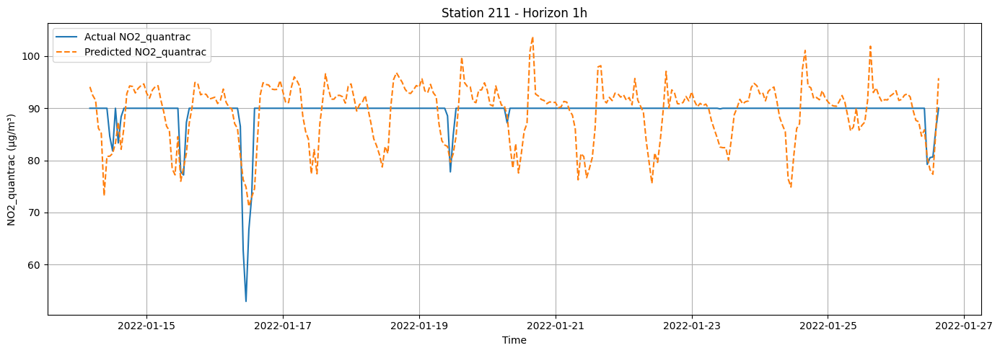

hour = 24
X_test_sid.shape: (578, 60)
y_test_sid.shape: (578, 1)
y_pred_sid.shape: (578,)


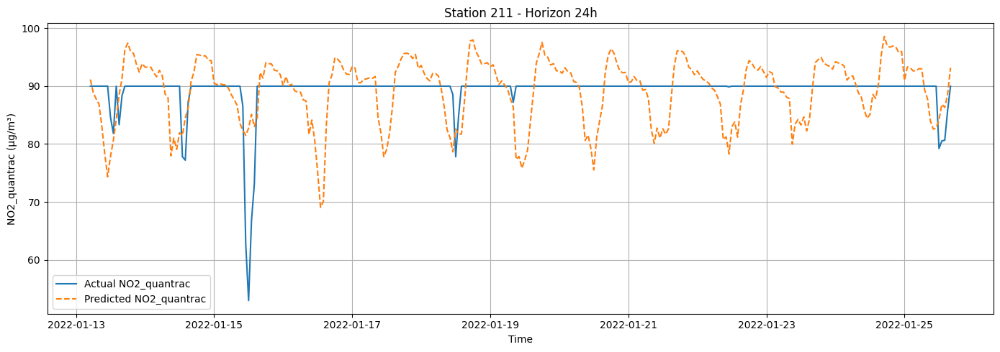

hour = 48
X_test_sid.shape: (574, 60)
y_test_sid.shape: (574, 1)
y_pred_sid.shape: (574,)


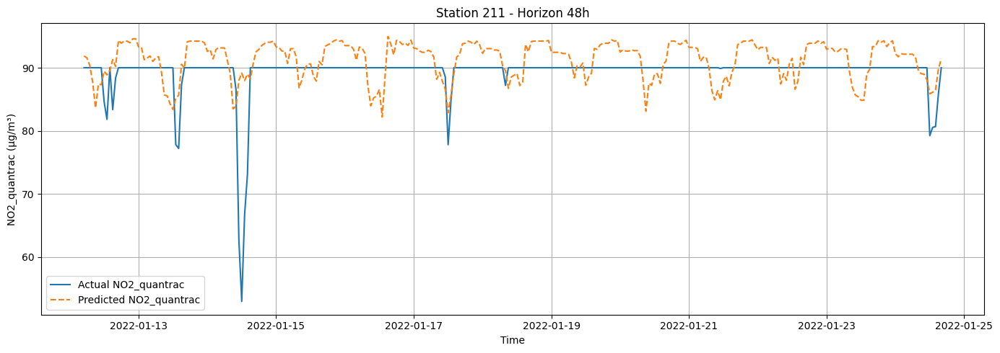

hour = 72
X_test_sid.shape: (570, 60)
y_test_sid.shape: (570, 1)
y_pred_sid.shape: (570,)


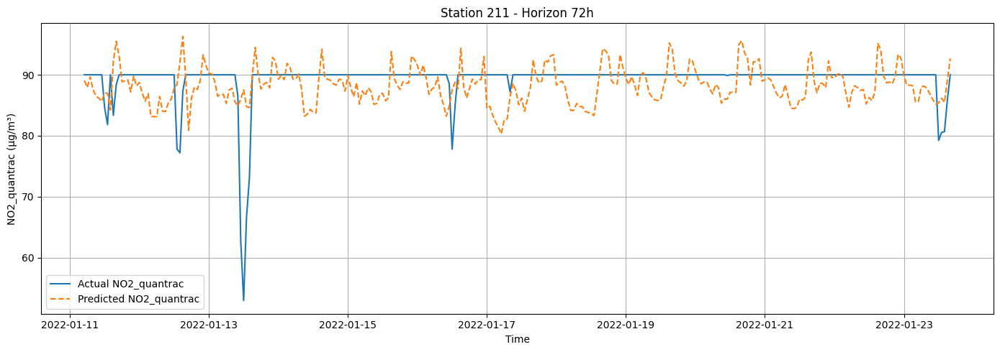

station_id = 212
hour = 1
X_test_sid.shape: (867, 60)
y_test_sid.shape: (867, 1)
y_pred_sid.shape: (867,)


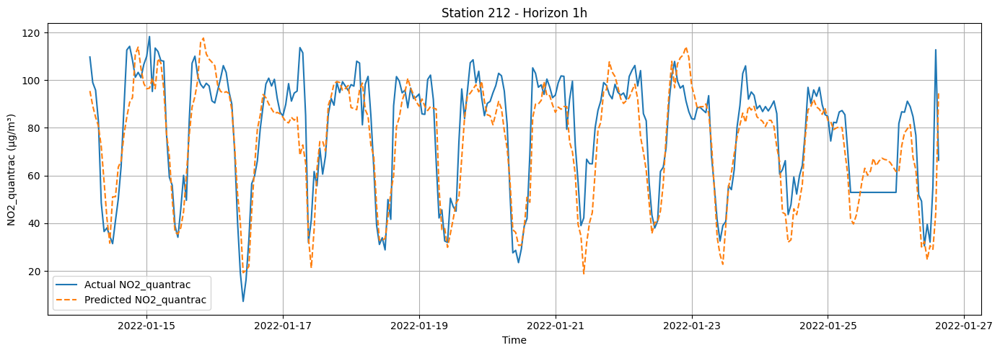

hour = 24
X_test_sid.shape: (864, 60)
y_test_sid.shape: (864, 1)
y_pred_sid.shape: (864,)


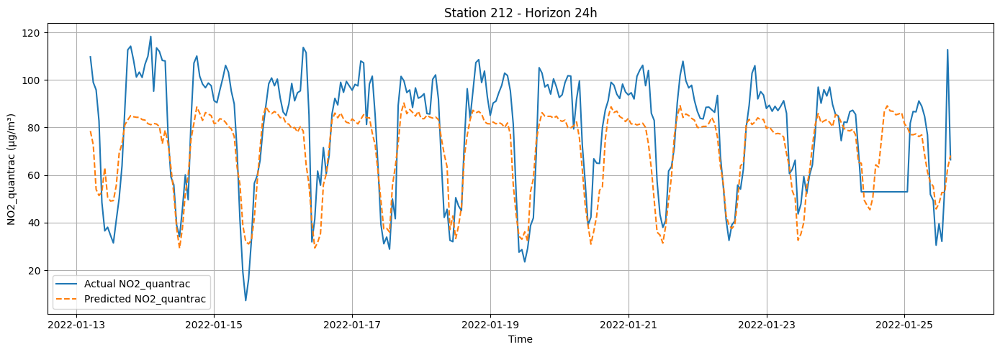

hour = 48
X_test_sid.shape: (860, 60)
y_test_sid.shape: (860, 1)
y_pred_sid.shape: (860,)


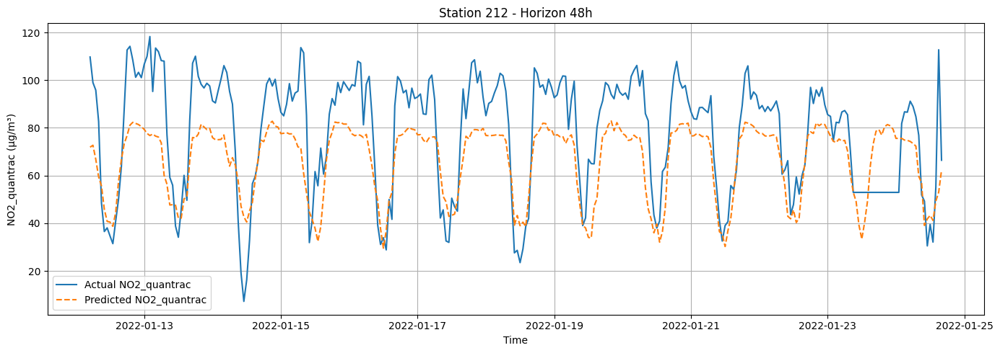

hour = 72
X_test_sid.shape: (857, 60)
y_test_sid.shape: (857, 1)
y_pred_sid.shape: (857,)


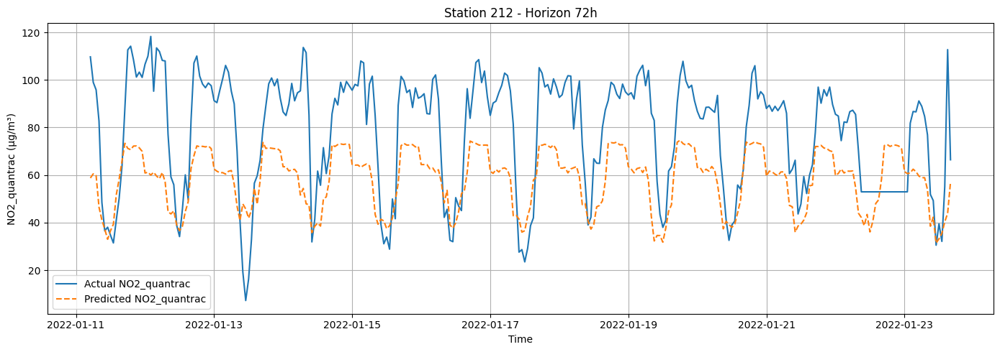

station_id = 213
hour = 1
X_test_sid.shape: (880, 60)
y_test_sid.shape: (880, 1)
y_pred_sid.shape: (880,)


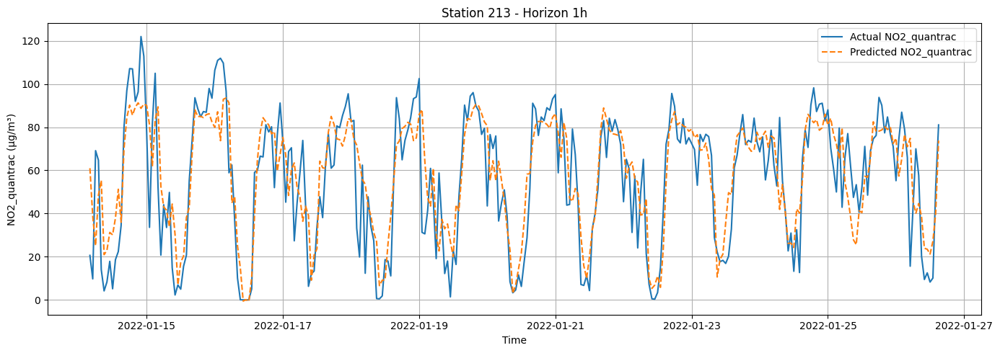

hour = 24
X_test_sid.shape: (877, 60)
y_test_sid.shape: (877, 1)
y_pred_sid.shape: (877,)


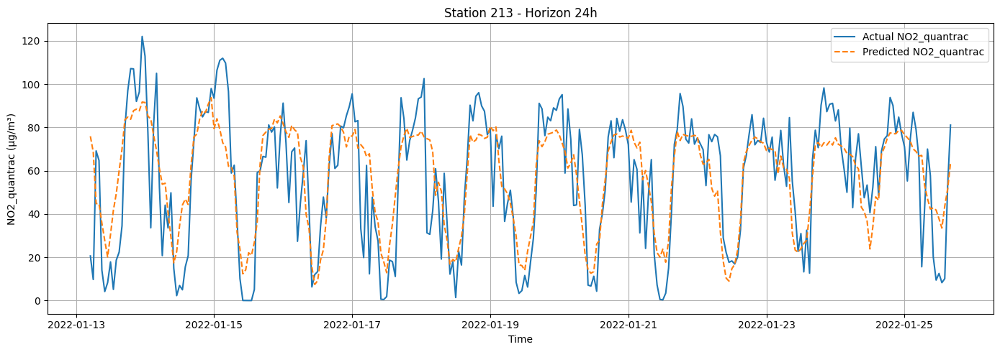

hour = 48
X_test_sid.shape: (873, 60)
y_test_sid.shape: (873, 1)
y_pred_sid.shape: (873,)


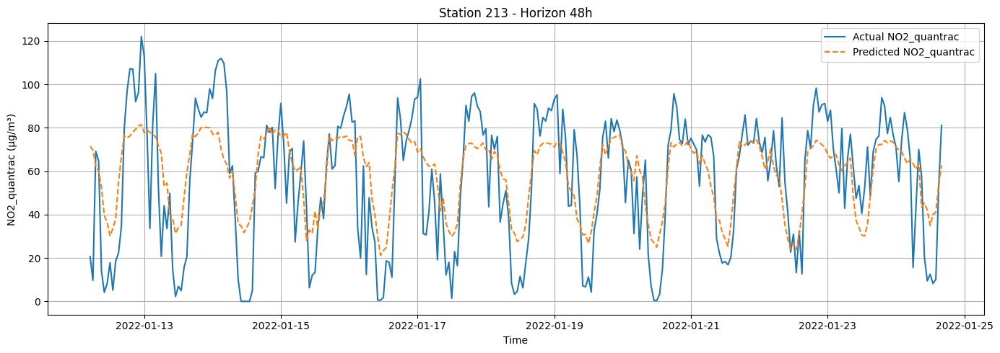

hour = 72
X_test_sid.shape: (869, 60)
y_test_sid.shape: (869, 1)
y_pred_sid.shape: (869,)


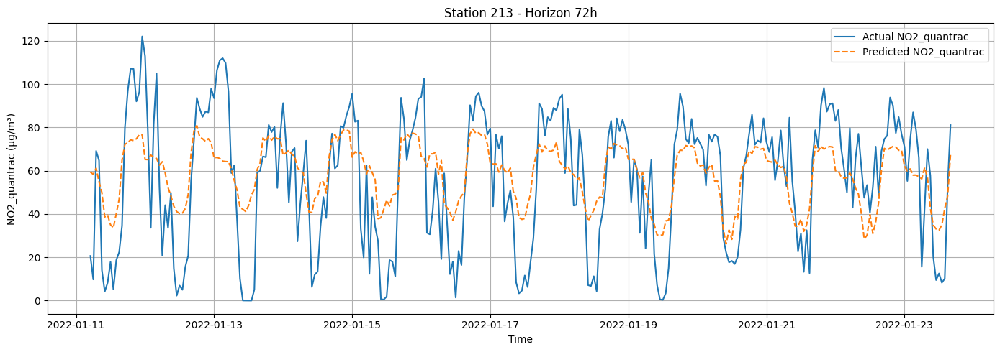

station_id = 214
hour = 1
X_test_sid.shape: (906, 60)
y_test_sid.shape: (906, 1)
y_pred_sid.shape: (906,)


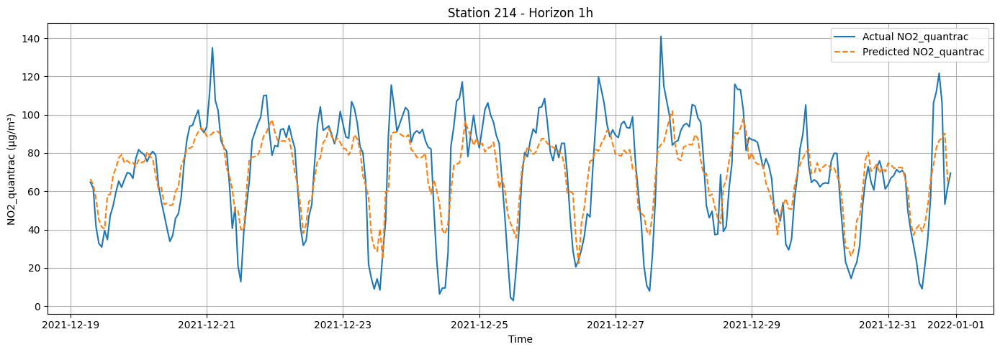

hour = 24
X_test_sid.shape: (902, 60)
y_test_sid.shape: (902, 1)
y_pred_sid.shape: (902,)


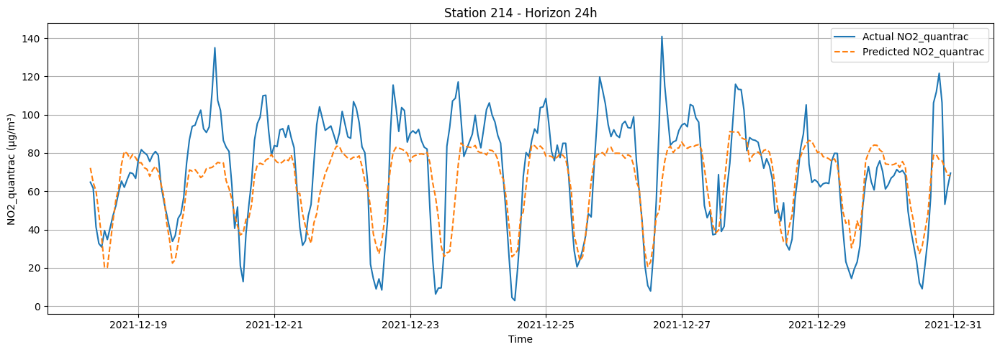

hour = 48
X_test_sid.shape: (899, 60)
y_test_sid.shape: (899, 1)
y_pred_sid.shape: (899,)


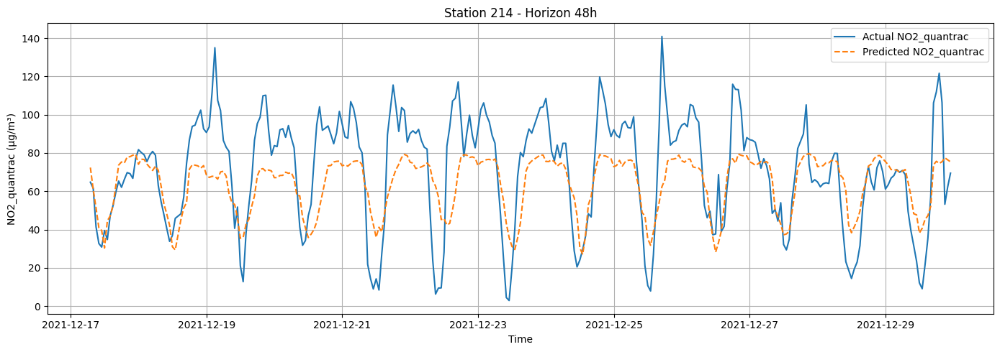

hour = 72
X_test_sid.shape: (895, 60)
y_test_sid.shape: (895, 1)
y_pred_sid.shape: (895,)


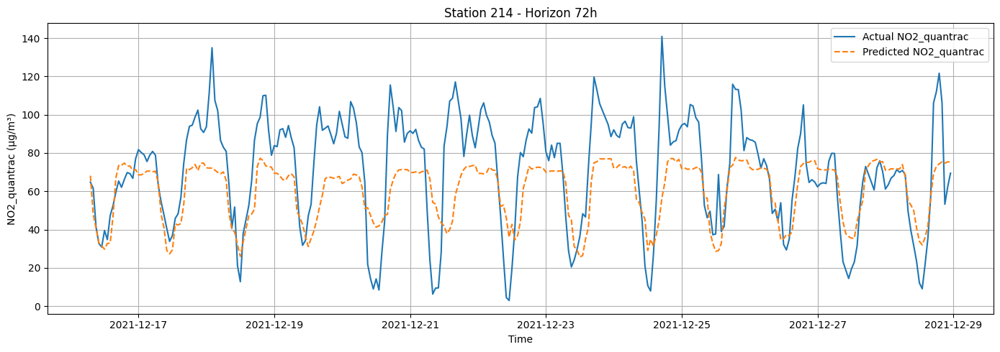

station_id = 215
hour = 1
X_test_sid.shape: (461, 60)
y_test_sid.shape: (461, 1)
y_pred_sid.shape: (461,)


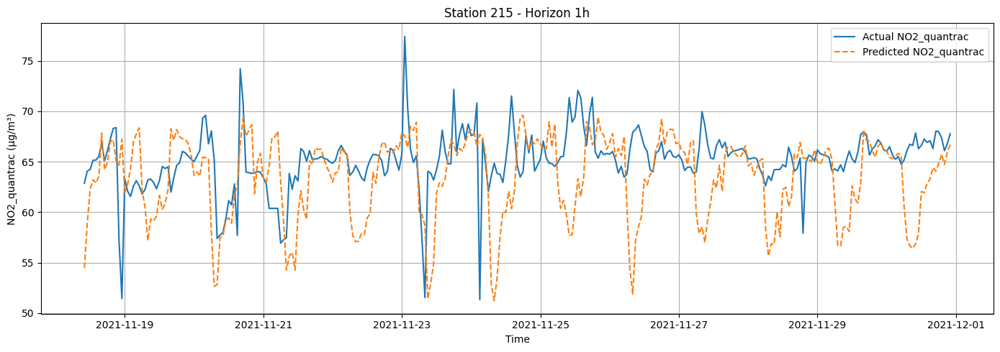

hour = 24
X_test_sid.shape: (458, 60)
y_test_sid.shape: (458, 1)
y_pred_sid.shape: (458,)


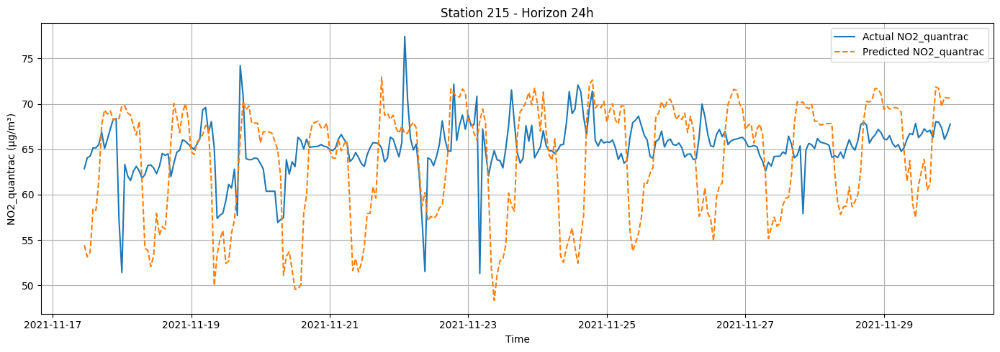

hour = 48
X_test_sid.shape: (454, 60)
y_test_sid.shape: (454, 1)
y_pred_sid.shape: (454,)


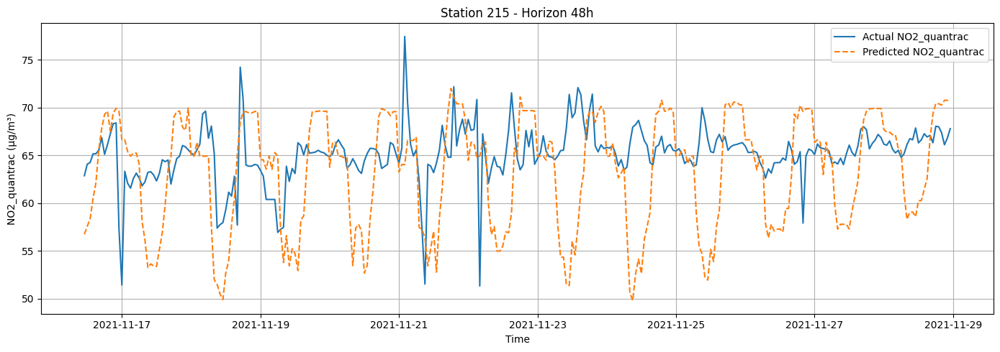

hour = 72
X_test_sid.shape: (450, 60)
y_test_sid.shape: (450, 1)
y_pred_sid.shape: (450,)


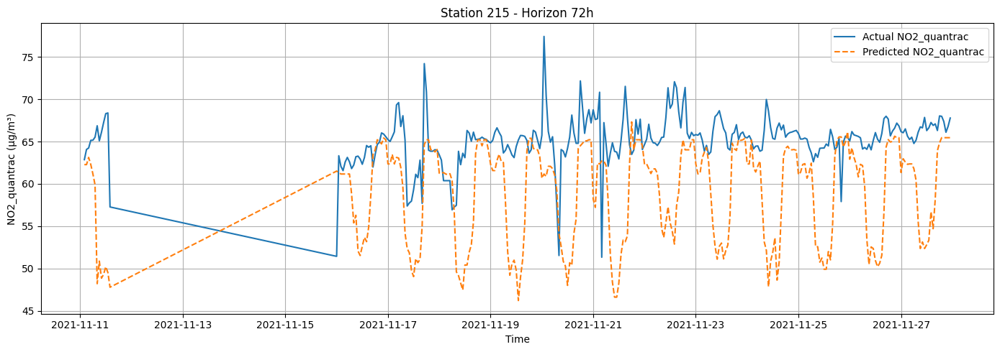

station_id = 216
hour = 1
X_test_sid.shape: (2046, 60)
y_test_sid.shape: (2046, 1)
y_pred_sid.shape: (2046,)


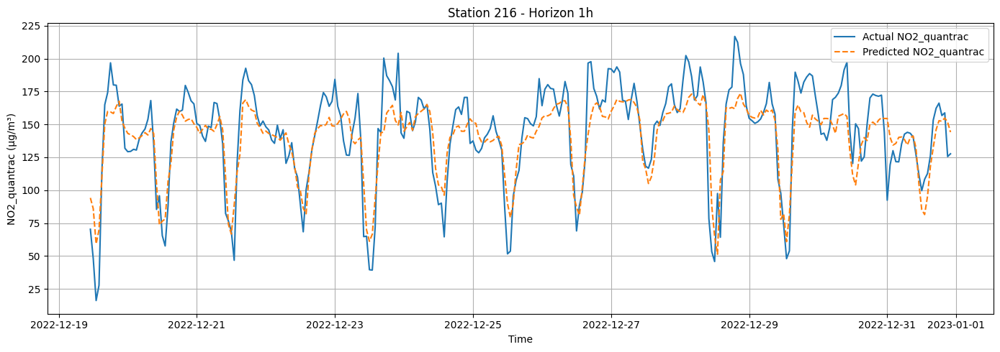

hour = 24
X_test_sid.shape: (2043, 60)
y_test_sid.shape: (2043, 1)
y_pred_sid.shape: (2043,)


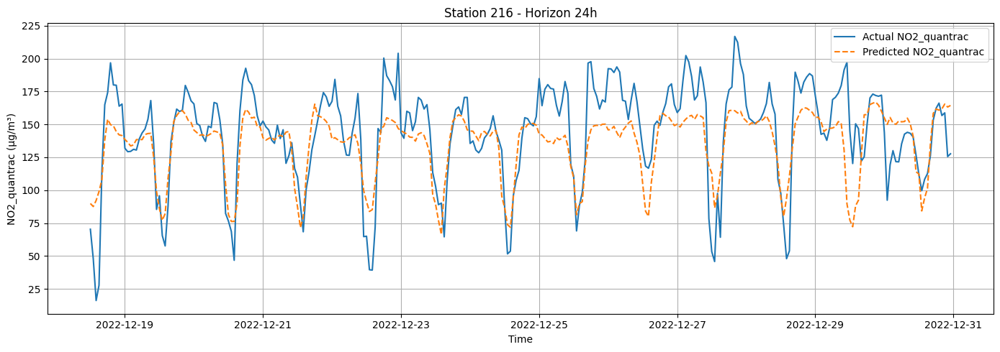

hour = 48
X_test_sid.shape: (2039, 60)
y_test_sid.shape: (2039, 1)
y_pred_sid.shape: (2039,)


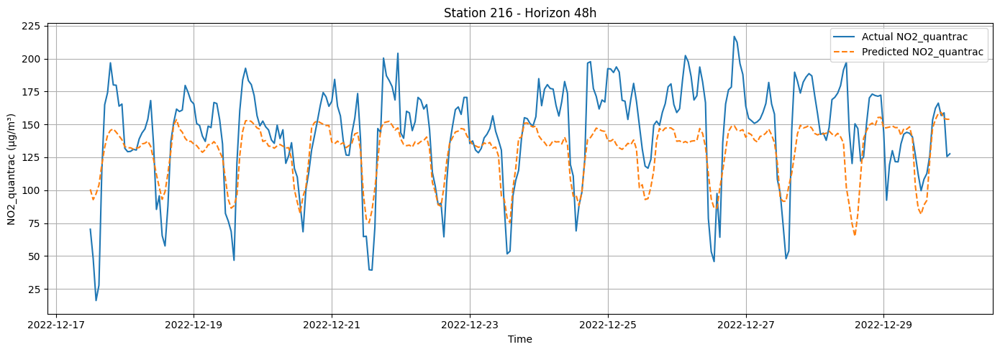

hour = 72
X_test_sid.shape: (2036, 60)
y_test_sid.shape: (2036, 1)
y_pred_sid.shape: (2036,)


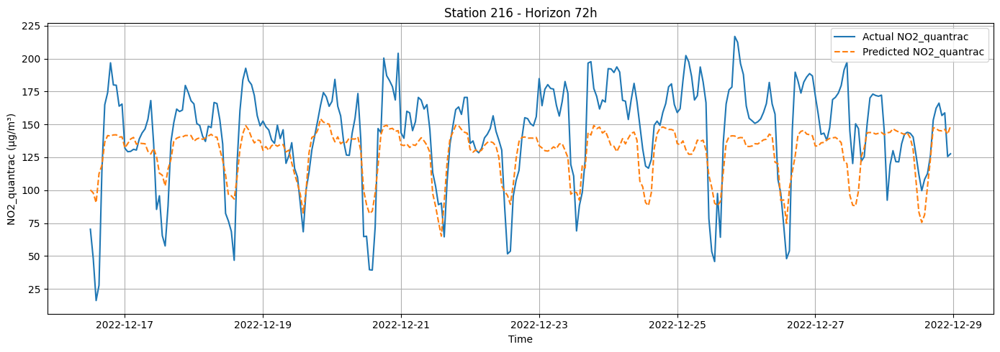

In [16]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in HORIZONS:
        print(f"hour = {hour}")
        plot_timeseries_example(df_no2, no2_models_by_h[hour], horizon_h=hour, station_id=station_id, target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)

## Training for O3

In [17]:
label = "O3_quantrac"

# Add rolling features for LABEL
df_o3 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Station embedding
o3_station_to_embedding, _ = learn_station_embeddings(df_o3, target_col=label, station_col="station_id", embed_dim=4)
df_o3, _ = attach_station_embedding(df_o3, o3_station_to_embedding, station_col="station_id")
print(o3_station_to_embedding)
with open(os.path.join(LIGHTGBM_DIR, f"{label}_station_embedding.pkl"), 'wb') as o3_emb_file:
    pickle.dump(o3_station_to_embedding, o3_emb_file)

# Print dataset
display(df_o3)

# Start running model
o3_all_metrics = []
o3_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_o3, horizon_h=h, target_col=label)
    o3_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    o3_all_metrics.append(metrics_by_station)

o3_df_metrics_all = pd.concat(o3_all_metrics, ignore_index=True)
o3_df_metrics_all = o3_df_metrics_all.sort_values(["station", "horizon_h"])
o3_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
o3_df_metrics_all

[Embed] epoch 001 | train MSE=7205.8838 | val MSE=7192.1496
[Embed] epoch 010 | train MSE=4982.4207 | val MSE=4729.6205
[Embed] epoch 020 | train MSE=1154.7580 | val MSE=1087.1925
[Embed] epoch 030 | train MSE=849.5183 | val MSE=845.7694
[Embed] epoch 040 | train MSE=842.5061 | val MSE=841.4683
[Embed] epoch 050 | train MSE=842.2304 | val MSE=841.3656
{211: [6.3102427, -2.830071, -3.242811, -5.710138], 212: [5.6497054, -6.1378117, -4.827483, -6.0162816], 213: [4.3873553, -4.6534095, -4.2588835, -2.8678885], 214: [3.096077, -4.051208, -6.2767863, -3.596666], 215: [5.033126, -5.672511, -4.3594937, -5.4653296], 216: [3.4363449, -4.0281177, -4.587953, -2.7763786]}


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,O3_quantrac_roll24_mean,O3_quantrac_roll24_std,O3_quantrac_roll48_mean,O3_quantrac_roll48_std,O3_quantrac_roll71_mean,O3_quantrac_roll71_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,55.4313809500,NaN,55.4313809500,NaN,55.4313809500,NaN,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,56.8142787100,1.9557127676,56.8142787100,1.9557127676,56.8142787100,1.9557127676,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,56.2193302500,1.7246150947,56.2193302500,1.7246150947,56.2193302500,1.7246150947,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,55.8564226875,1.5841945626,55.8564226875,1.5841945626,55.8564226875,1.5841945626,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,64.9380388157,15.0927718072,70.0763352689,14.5078761517,75.0341348152,17.3719114305,3.4363448620,-4.0281176567,-4.5879530907,-2.7763786316
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,64.6470665934,14.7958230928,69.8784186022,14.3581777465,74.4562005429,16.6239740870,3.4363448620,-4.0281176567,-4.5879530907,-2.7763786316
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,64.2442888157,14.6098932113,69.6353630467,14.3202126589,73.6949329372,15.7134658399,3.4363448620,-4.0281176567,-4.5879530907,-2.7763786316
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,63.5192888157,14.6124020919,69.2311963800,14.4521933678,72.9925855194,15.4056634487,3.4363448620,-4.0281176567,-4.5879530907,-2.7763786316



===== Training LightGBM for horizon = 1h, target_col = O3_quantrac =====

X.shape = (38260, 62)
y.shape = (38260, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag71
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag71
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag71
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag71
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag71
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
Humid_quantrac_lag48
Humid_quantrac_lag71
O3_quantr

,date,target
0,2022-01-02,65.8253263628
1,2022-01-03,64.1066013632
2,2022-01-04,63.3546871825
3,2022-01-05,63.4765405011
4,2022-01-06,68.2799443737
5,2022-01-07,72.1538949321
6,2022-01-08,63.3488775178
7,2022-01-09,57.5133219784
8,2022-01-10,63.0326053276
9,2022-01-11,57.2614426830


,date,target
0,2022-01-02,66.3912475498
1,2022-01-03,62.5111456150
2,2022-01-04,66.3724609736
3,2022-01-05,64.8905194986
4,2022-01-06,68.1511200025
5,2022-01-07,72.3697047643
6,2022-01-08,67.7209430098
7,2022-01-09,58.4113316255
8,2022-01-10,64.3036345533
9,2022-01-11,60.9688455042


sid = 212, grp =                     date  station_id       y_true          y_pred
8783 2021-11-19 17:00:00         212  177.6187833  134.3220240424
8784 2021-11-19 18:00:00         212  121.8041500  118.6823543875
8785 2021-11-19 19:00:00         212  126.8425167  113.7842469718
8786 2021-11-19 20:00:00         212  125.2394000  114.8270484705
8787 2021-11-19 21:00:00         212  124.4214833  110.3448291300
...                  ...         ...          ...             ...
9645 2022-01-26 11:00:00         212  157.6943333   96.1706153878
9646 2022-01-26 12:00:00         212  153.5393167  116.6268334174
9647 2022-01-26 13:00:00         212   90.0000000  112.6848372608
9648 2022-01-26 14:00:00         212   90.0000000  128.1763847059
9649 2022-01-26 15:00:00         212   90.0000000  129.6249227114

[867 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.

,date,target
0,2021-11-20,123.1921100792
1,2021-11-21,91.9526792167
2,2021-11-23,107.6771365650
3,2021-11-24,108.8908823737
4,2021-11-25,115.8518667772
5,2021-11-26,136.1765371542
6,2021-11-27,137.6372774167
7,2021-11-28,124.0690740708
8,2021-11-29,117.9339469600
9,2021-11-30,119.6860278792


,date,target
0,2021-11-20,111.7400431155
1,2021-11-21,90.2465759226
2,2021-11-23,114.1582154180
3,2021-11-24,114.1929018747
4,2021-11-25,113.9978980745
5,2021-11-26,120.8158350553
6,2021-11-27,130.8216658392
7,2021-11-28,129.1255886334
8,2021-11-29,112.3773689486
9,2021-11-30,109.2277304457


sid = 213, grp =                      date  station_id         y_true          y_pred
14634 2021-12-20 20:00:00         213  156.974566700   94.9939923378
14635 2021-12-20 21:00:00         213  141.761316700   94.6892891610
14636 2021-12-20 22:00:00         213  130.997533300   92.9088538862
14637 2021-12-20 23:00:00         213  129.099966700  102.2105264056
14638 2021-12-21 00:00:00         213  144.629847500   99.2056080557
...                   ...         ...            ...             ...
15509 2022-01-26 11:00:00         213   98.706183330   60.2872308391
15510 2022-01-26 12:00:00         213   91.770250000   71.2702580031
15511 2022-01-26 13:00:00         213   95.074633330   95.1929199726
15512 2022-01-26 14:00:00         213   86.239958374   99.3490817466
15513 2022-01-26 15:00:00         213   90.000000000   98.2465751249

[880 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), da

,date,target
0,2021-12-21,91.4311149525
1,2021-12-22,84.0918608962
2,2021-12-23,63.4550147250
3,2021-12-24,78.1384747489
4,2021-12-25,94.9470475775
5,2021-12-26,83.8008535404
6,2021-12-27,94.9922750987
7,2021-12-28,95.8774333104
8,2021-12-29,77.8941320146
9,2021-12-30,64.1645227771


,date,target
0,2021-12-21,90.1602464234
1,2021-12-22,90.3710033475
2,2021-12-23,73.2771178041
3,2021-12-24,74.1571364026
4,2021-12-25,86.8471670941
5,2021-12-26,90.6808274139
6,2021-12-27,91.0792683451
7,2021-12-28,93.2245108175
8,2021-12-29,87.0104762486
9,2021-12-30,71.5018136671


sid = 214, grp =                      date  station_id        y_true          y_pred
20644 2021-11-23 16:00:00         214   90.00000000  112.2668161221
20645 2021-11-23 17:00:00         214   90.00000000  115.0191664428
20646 2021-11-23 18:00:00         214   90.00000000  111.1022666161
20647 2021-11-23 19:00:00         214   90.00000000   94.4990796805
20648 2021-11-23 20:00:00         214  119.67756670  104.6547964307
...                   ...         ...           ...             ...
21545 2021-12-31 18:00:00         214  132.43706670  106.0540433049
21546 2021-12-31 19:00:00         214  107.80141670  108.6990907736
21547 2021-12-31 20:00:00         214   61.21651852  112.1144017180
21548 2021-12-31 21:00:00         214   73.80880000   98.6117820449
21549 2021-12-31 22:00:00         214   82.64230000   84.2147406847

[906 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26), datetime.date(

,date,target
0,2021-11-24,93.3443932779
1,2021-11-25,91.6623921200
2,2021-11-26,102.2618008508
3,2021-11-27,101.2890797825
4,2021-11-28,91.3355579367
5,2021-11-29,84.2368115154
6,2021-11-30,81.4905561046
7,2021-12-01,95.4026808217
8,2021-12-02,113.8599750875
9,2021-12-03,112.6866467000


,date,target
0,2021-11-24,89.4697901623
1,2021-11-25,91.0054380350
2,2021-11-26,98.3811514764
3,2021-11-27,99.5444887979
4,2021-11-28,89.4152123404
5,2021-11-29,86.7548185807
6,2021-11-30,79.7034489957
7,2021-12-01,88.6908000266
8,2021-12-02,113.9577445954
9,2021-12-03,120.9697741284


sid = 215, grp =                      date  station_id  y_true         y_pred
24160 2021-11-07 08:00:00         215    90.0  89.0409501066
24161 2021-11-07 09:00:00         215    90.0  91.7496703175
24162 2021-11-07 10:00:00         215    90.0  91.4686934336
24163 2021-11-07 11:00:00         215    90.0  89.7033512044
24164 2021-11-07 12:00:00         215    90.0  91.4994656233
...                   ...         ...     ...            ...
24616 2021-11-30 18:00:00         215    90.0  81.9356919222
24617 2021-11-30 19:00:00         215    90.0  81.0191435548
24618 2021-11-30 20:00:00         215    90.0  84.1026289892
24619 2021-11-30 21:00:00         215    90.0  85.4396962186
24620 2021-11-30 22:00:00         215    90.0  85.0699257453

[461 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime.date(2021, 11, 16), datetime.date(2021, 11, 17), datetime.date(

,date,target
0,2021-11-07,90.0
1,2021-11-08,90.0
2,2021-11-09,90.0
3,2021-11-10,90.0
4,2021-11-11,90.0
5,2021-11-16,90.0
6,2021-11-17,90.0
7,2021-11-18,90.0
8,2021-11-19,90.0
9,2021-11-20,90.0


,date,target
0,2021-11-07,87.6454970127
1,2021-11-08,85.1472602759
2,2021-11-09,90.0118849315
3,2021-11-10,85.0072491884
4,2021-11-11,90.6800383547
5,2021-11-16,89.4003740135
6,2021-11-17,88.1589500518
7,2021-11-18,87.3822078644
8,2021-11-19,89.4475746594
9,2021-11-20,89.7269284375


sid = 216, grp =                      date  station_id         y_true         y_pred
36214 2022-09-20 19:00:00         216  60.8833333333  54.6373123473
36215 2022-09-20 20:00:00         216  71.8166666667  53.8490230597
36216 2022-09-20 21:00:00         216  57.4333333333  56.9800693870
36217 2022-09-20 22:00:00         216  45.9000000000  52.9043223688
36218 2022-09-20 23:00:00         216  40.3461538462  50.7216680532
...                   ...         ...            ...            ...
38255 2022-12-31 18:00:00         216  75.9166666667  83.5178153238
38256 2022-12-31 19:00:00         216  66.1166666667  87.4708171583
38257 2022-12-31 20:00:00         216  55.1333333333  81.1938499701
38258 2022-12-31 21:00:00         216  46.7500000000  69.9918570006
38259 2022-12-31 22:00:00         216  50.0166666667  61.7197342356

[2046 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22), datetime.date(2022, 9, 23), datetime.date(202

,date,target
0,2022-09-21,46.4844863732
1,2022-09-22,44.4186975891
2,2022-09-23,46.1901836158
3,2022-09-24,44.8116193061
4,2022-09-25,48.7034016008
...,...,...
82,2022-12-27,75.4105341479
83,2022-12-28,78.1382022913
84,2022-12-29,80.2899782904
85,2022-12-30,72.2750483888


,date,target
0,2022-09-21,47.8562830502
1,2022-09-22,47.5096875373
2,2022-09-23,47.6439339409
3,2022-09-24,47.0944183215
4,2022-09-25,48.2435048824
...,...,...
82,2022-12-27,77.6639027513
83,2022-12-28,79.1352112773
84,2022-12-29,84.2019979138
85,2022-12-30,76.8237256963


Overall test metrics: {'rmse': 18.61, 'mae': 12.66, 'mape': 21.34, 'mnbe': -9.72, 'r': 0.83, 'n_samples': 5741}

===== Training LightGBM for horizon = 24h, target_col = O3_quantrac =====

X.shape = (38122, 62)
y.shape = (38122, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag71
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag71
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag71
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag71
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag71
Humid_quantrac_lag3


,date,target
0,2022-01-02,63.9786230323
1,2022-01-03,63.1137688130
2,2022-01-04,63.4686794529
3,2022-01-05,67.9858535225
4,2022-01-06,72.5380178614
5,2022-01-07,63.8443269909
6,2022-01-08,57.1622116777
7,2022-01-09,63.0906289113
8,2022-01-10,57.4374054710
9,2022-01-11,54.3523164387


,date,target
0,2022-01-02,57.0175942573
1,2022-01-03,62.8582936364
2,2022-01-04,68.6892221010
3,2022-01-05,66.6627371638
4,2022-01-06,68.6110560856
5,2022-01-07,70.8493963310
6,2022-01-08,67.3692811749
7,2022-01-09,63.4260908923
8,2022-01-10,66.2997386512
9,2022-01-11,64.8815848738


sid = 212, grp =                     date  station_id       y_true          y_pred
8740 2021-11-18 21:00:00         212  125.2394000  110.2944725186
8741 2021-11-18 22:00:00         212  124.4214833  107.3051653841
8742 2021-11-18 23:00:00         212  122.7856500  101.0693071830
8743 2021-11-19 00:00:00         212  120.4627667  101.3879655560
8744 2021-11-19 01:00:00         212  115.1062586   98.1201661372
...                  ...         ...          ...             ...
9599 2022-01-25 12:00:00         212  157.6943333  116.2793248325
9600 2022-01-25 13:00:00         212  153.5393167  113.4228386258
9601 2022-01-25 14:00:00         212   90.0000000  117.2049286009
9602 2022-01-25 15:00:00         212   90.0000000  118.3002706586
9603 2022-01-25 16:00:00         212   90.0000000  118.8870236649

[864 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.

,date,target
0,2021-11-19,123.7673781375
1,2021-11-20,91.7454736583
2,2021-11-21,108.1419858721
3,2021-11-23,108.6632289000
4,2021-11-24,115.2207077522
5,2021-11-25,135.8657288208
6,2021-11-26,137.9330906083
7,2021-11-27,124.9660560167
8,2021-11-28,117.9925643212
9,2021-11-29,118.8394841304


,date,target
0,2021-11-19,104.9631867033
1,2021-11-20,106.0652923343
2,2021-11-21,107.5854631637
3,2021-11-23,105.5706063816
4,2021-11-24,102.8778154321
5,2021-11-25,106.6509893211
6,2021-11-26,113.1185326789
7,2021-11-27,119.3604989028
8,2021-11-28,117.8482131088
9,2021-11-29,110.3630962964


sid = 213, grp =                      date  station_id         y_true          y_pred
14568 2021-12-20 00:00:00         213  129.099966700   85.8303808286
14569 2021-12-20 01:00:00         213  144.629847500   85.4313681607
14570 2021-12-20 02:00:00         213   40.324677970   79.3944519388
14571 2021-12-20 03:00:00         213   50.808983330   82.8183984199
14572 2021-12-20 04:00:00         213   38.605666670   84.0057409181
...                   ...         ...            ...             ...
15440 2022-01-25 12:00:00         213   98.706183330   79.3572626611
15441 2022-01-25 13:00:00         213   91.770250000   85.3393175122
15442 2022-01-25 14:00:00         213   95.074633330   83.8565077584
15443 2022-01-25 15:00:00         213   86.239958374  108.0736951564
15444 2022-01-25 16:00:00         213   90.000000000  107.6192389483

[877 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), da

,date,target
0,2021-12-20,93.2359843983
1,2021-12-21,84.8743345075
2,2021-12-22,64.3656286138
3,2021-12-23,76.2128137177
4,2021-12-24,96.3391904745
5,2021-12-25,84.0898507629
6,2021-12-26,94.6767191917
7,2021-12-27,95.8774333104
8,2021-12-28,78.6706123922
9,2021-12-29,64.8106769438


,date,target
0,2021-12-20,86.6104565261
1,2021-12-21,93.4902071328
2,2021-12-22,92.8165736494
3,2021-12-23,79.9164448965
4,2021-12-24,75.6731905717
5,2021-12-25,81.8959623285
6,2021-12-26,97.4573573658
7,2021-12-27,100.9506328410
8,2021-12-28,102.2870028614
9,2021-12-29,107.3422027912


sid = 214, grp =                      date  station_id        y_true         y_pred
20556 2021-11-22 21:00:00         214  119.67756670  87.8435856263
20557 2021-11-22 22:00:00         214   96.03884906  84.2446436500
20558 2021-11-22 23:00:00         214   79.39633929  87.2470875670
20559 2021-11-23 00:00:00         214   71.91123333  84.6939603347
20560 2021-11-23 01:00:00         214   78.09468333  84.4431340154
...                   ...         ...           ...            ...
21453 2021-12-30 19:00:00         214  132.43706670  92.6564717343
21454 2021-12-30 20:00:00         214  107.80141670  86.9580028262
21455 2021-12-30 21:00:00         214   61.21651852  85.6902290514
21456 2021-12-30 22:00:00         214   73.80880000  80.9234172557
21457 2021-12-30 23:00:00         214   82.64230000  80.7982259916

[902 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26

,date,target
0,2021-11-23,92.4992127221
1,2021-11-24,91.8123435092
2,2021-11-25,102.1691036283
3,2021-11-26,101.3504235325
4,2021-11-27,92.0730461312
5,2021-11-28,84.5258087375
6,2021-11-29,80.8866609658
7,2021-11-30,94.8464974883
8,2021-12-01,113.6614730042
9,2021-12-02,112.5797932279


,date,target
0,2021-11-23,87.3923726700
1,2021-11-24,86.2324707016
2,2021-11-25,86.0671376903
3,2021-11-26,88.9922433027
4,2021-11-27,92.8354460637
5,2021-11-28,88.4971723900
6,2021-11-29,92.7199092248
7,2021-11-30,87.7619714427
8,2021-12-01,86.5439128609
9,2021-12-02,97.7222233630


sid = 215, grp =                      date  station_id  y_true         y_pred
24048 2021-11-06 12:00:00         215    90.0  81.8266305474
24049 2021-11-06 13:00:00         215    90.0  80.9583187808
24050 2021-11-06 14:00:00         215    90.0  80.7284324926
24051 2021-11-06 15:00:00         215    90.0  84.9942689401
24052 2021-11-06 16:00:00         215    90.0  85.0019574690
...                   ...         ...     ...            ...
24501 2021-11-29 19:00:00         215    90.0  83.7228370094
24502 2021-11-29 20:00:00         215    90.0  85.8223835643
24503 2021-11-29 21:00:00         215    90.0  85.0594334909
24504 2021-11-29 22:00:00         215    90.0  86.4132834822
24505 2021-11-29 23:00:00         215    90.0  86.0281037672

[458 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime.date(2021, 11, 16), datetime.date(2

,date,target
0,2021-11-06,90.0
1,2021-11-07,90.0
2,2021-11-08,90.0
3,2021-11-09,90.0
4,2021-11-10,90.0
5,2021-11-11,90.0
6,2021-11-16,90.0
7,2021-11-17,90.0
8,2021-11-18,90.0
9,2021-11-19,90.0


,date,target
0,2021-11-06,83.1308231268
1,2021-11-07,84.7360597567
2,2021-11-08,86.1235634960
3,2021-11-09,87.1314187671
4,2021-11-10,86.0562326411
5,2021-11-11,86.9349120091
6,2021-11-16,85.9966331346
7,2021-11-17,86.1812897663
8,2021-11-18,87.0688283252
9,2021-11-19,87.2792971024


sid = 216, grp =                      date  station_id         y_true         y_pred
36079 2022-09-19 23:00:00         216  45.9000000000  51.9080667681
36080 2022-09-20 00:00:00         216  40.3461538462  47.3102292615
36081 2022-09-20 01:00:00         216  39.0943396226  46.6841340894
36082 2022-09-20 02:00:00         216  39.0833333333  47.8865825260
36083 2022-09-20 03:00:00         216  39.6166666667  47.0917430138
...                   ...         ...            ...            ...
38117 2022-12-30 19:00:00         216  75.9166666667  85.1168207233
38118 2022-12-30 20:00:00         216  66.1166666667  86.1686127671
38119 2022-12-30 21:00:00         216  55.1333333333  86.2428971081
38120 2022-12-30 22:00:00         216  46.7500000000  83.8221693164
38121 2022-12-30 23:00:00         216  50.0166666667  80.0358518017

[2043 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22), datetime.date(202

,date,target
0,2022-09-20,46.1065483390
1,2022-09-21,44.8909198113
2,2022-09-22,45.9874058380
3,2022-09-23,44.9275915283
4,2022-09-24,48.4547904896
...,...,...
82,2022-12-26,74.8619230368
83,2022-12-27,77.9263967357
84,2022-12-28,80.4344227349
85,2022-12-29,73.5132428332


,date,target
0,2022-09-20,52.6515360319
1,2022-09-21,52.7816078670
2,2022-09-22,51.2416859559
3,2022-09-23,49.5333819640
4,2022-09-24,50.6684625440
...,...,...
82,2022-12-26,74.4830568631
83,2022-12-27,76.4921389499
84,2022-12-28,78.0864379753
85,2022-12-29,83.3929055781


Overall test metrics: {'rmse': 22.05, 'mae': 16.02, 'mape': 28.12, 'mnbe': -13.66, 'r': 0.75, 'n_samples': 5722}

===== Training LightGBM for horizon = 48h, target_col = O3_quantrac =====

X.shape = (37978, 62)
y.shape = (37978, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag71
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag71
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag71
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag71
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag71
Humid_quantrac_lag3

,date,target
0,2022-01-01,63.9786230323
1,2022-01-02,63.1137688130
2,2022-01-03,63.4686794529
3,2022-01-04,67.9858535225
4,2022-01-05,72.5380178614
5,2022-01-06,63.8443269909
6,2022-01-07,57.1622116777
7,2022-01-08,63.0906289113
8,2022-01-09,57.4374054710
9,2022-01-10,54.3523164387


,date,target
0,2022-01-01,54.5751764204
1,2022-01-02,59.1737635655
2,2022-01-03,62.1116082764
3,2022-01-04,65.4371059507
4,2022-01-05,65.4996744051
5,2022-01-06,67.3342601272
6,2022-01-07,69.4402130275
7,2022-01-08,67.9531968537
8,2022-01-09,67.3001253073
9,2022-01-10,64.6305650418


sid = 212, grp =                     date  station_id        y_true          y_pred
8696 2021-11-18 01:00:00         212  115.10625860   98.5791509698
8697 2021-11-18 02:00:00         212  113.62498330   99.9666213349
8698 2021-11-18 03:00:00         212  104.92235000   94.9919615212
8699 2021-11-18 04:00:00         212   93.60238333   92.1538530215
8700 2021-11-18 05:00:00         212   82.67501667   97.4741494044
...                  ...         ...           ...             ...
9551 2022-01-24 12:00:00         212  157.69433330  115.1004512398
9552 2022-01-24 13:00:00         212  153.53931670  114.4836524639
9553 2022-01-24 14:00:00         212   90.00000000  120.6277662476
9554 2022-01-24 15:00:00         212   90.00000000  127.6461192367
9555 2022-01-24 16:00:00         212   90.00000000  120.9888244226

[860 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22

,date,target
0,2021-11-18,123.9110568957
1,2021-11-19,91.7454736583
2,2021-11-20,108.1419858721
3,2021-11-21,103.9138594583
4,2021-11-23,115.2207077522
5,2021-11-24,135.8657288208
6,2021-11-25,137.9330906083
7,2021-11-26,124.9660560167
8,2021-11-27,117.9925643212
9,2021-11-28,118.8394841304


,date,target
0,2021-11-18,102.0502298141
1,2021-11-19,102.6222744286
2,2021-11-20,106.7774936106
3,2021-11-21,106.6763646530
4,2021-11-23,106.5323261311
5,2021-11-24,102.5405311486
6,2021-11-25,104.4957417756
7,2021-11-26,105.5319159431
8,2021-11-27,109.8196725151
9,2021-11-28,113.6142942275


sid = 213, grp =                      date  station_id         y_true          y_pred
14500 2021-12-19 04:00:00         213   38.605666670   74.9923310456
14501 2021-12-19 05:00:00         213   66.643850000   73.9621743203
14502 2021-12-19 06:00:00         213   51.692333330   72.9218676966
14503 2021-12-19 07:00:00         213   77.309483330   71.9964627619
14504 2021-12-19 08:00:00         213  124.977666700   75.3474522233
...                   ...         ...            ...             ...
15368 2022-01-24 12:00:00         213   98.706183330   89.5655207290
15369 2022-01-24 13:00:00         213   91.770250000   91.6241423555
15370 2022-01-24 14:00:00         213   95.074633330   95.2529227794
15371 2022-01-24 15:00:00         213   86.239958374   97.2295780549
15372 2022-01-24 16:00:00         213   90.000000000  109.8575743937

[873 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), da

,date,target
0,2021-12-19,93.6400075030
1,2021-12-20,84.8743345075
2,2021-12-21,64.3656286138
3,2021-12-22,76.2128137177
4,2021-12-23,95.2783731425
5,2021-12-24,84.1335296968
6,2021-12-25,94.6767191917
7,2021-12-26,95.7281348887
8,2021-12-27,77.2680390070
9,2021-12-28,65.0183114487


,date,target
0,2021-12-19,82.5853471001
1,2021-12-20,81.0061856455
2,2021-12-21,90.9063565187
3,2021-12-22,91.8031700504
4,2021-12-23,80.2742191937
5,2021-12-24,73.7692737358
6,2021-12-25,82.4781095115
7,2021-12-26,96.9876008375
8,2021-12-27,93.1419780427
9,2021-12-28,106.1354707076


sid = 214, grp =                      date  station_id        y_true          y_pred
20463 2021-11-22 00:00:00         214   71.91123333   87.8749342053
20464 2021-11-22 01:00:00         214   78.09468333   87.5584226416
20465 2021-11-22 02:00:00         214   87.51708333   85.5765377698
20466 2021-11-22 03:00:00         214   88.41512245   86.5777931330
20467 2021-11-22 04:00:00         214   81.58094915   84.0474800203
...                   ...         ...           ...             ...
21357 2021-12-29 19:00:00         214  132.43706670  101.4281165906
21358 2021-12-29 20:00:00         214  107.80141670   95.7502363535
21359 2021-12-29 21:00:00         214   61.21651852   93.8376363995
21360 2021-12-29 22:00:00         214   73.80880000   84.4943309118
21361 2021-12-29 23:00:00         214   82.64230000   77.7161452514

[899 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(

,date,target
0,2021-11-22,92.4992127221
1,2021-11-23,91.8123435092
2,2021-11-24,102.1691036283
3,2021-11-25,101.3504235325
4,2021-11-26,92.0730461312
5,2021-11-27,84.5258087375
6,2021-11-28,80.8866609658
7,2021-11-29,94.8464974883
8,2021-11-30,113.6614730042
9,2021-12-01,112.5797932279


,date,target
0,2021-11-22,82.9842217728
1,2021-11-23,83.6073100814
2,2021-11-24,89.2295085532
3,2021-11-25,88.1746515766
4,2021-11-26,89.1969518558
5,2021-11-27,89.2687768387
6,2021-11-28,92.3934075635
7,2021-11-29,93.9491016813
8,2021-11-30,87.4560664598
9,2021-12-01,85.5701245505


sid = 215, grp =                      date  station_id  y_true         y_pred
23932 2021-11-05 16:00:00         215    90.0  90.2361902115
23933 2021-11-05 17:00:00         215    90.0  89.9441670857
23934 2021-11-05 18:00:00         215    90.0  89.9548950004
23935 2021-11-05 19:00:00         215    90.0  89.3634657346
23936 2021-11-05 20:00:00         215    90.0  89.8762153626
...                   ...         ...     ...            ...
24381 2021-11-28 19:00:00         215    90.0  90.8243088633
24382 2021-11-28 20:00:00         215    90.0  93.6288809703
24383 2021-11-28 21:00:00         215    90.0  90.3156968724
24384 2021-11-28 22:00:00         215    90.0  89.5495340038
24385 2021-11-28 23:00:00         215    90.0  89.9666147928

[454 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime.date(20

,date,target
0,2021-11-06,90.0
1,2021-11-07,90.0
2,2021-11-08,90.0
3,2021-11-09,90.0
4,2021-11-10,90.0
5,2021-11-11,90.0
6,2021-11-16,90.0
7,2021-11-17,90.0
8,2021-11-18,90.0
9,2021-11-19,90.0


,date,target
0,2021-11-06,87.8514126732
1,2021-11-07,90.0815421172
2,2021-11-08,91.6391980710
3,2021-11-09,94.9896036748
4,2021-11-10,91.7659973942
5,2021-11-11,88.2839969593
6,2021-11-16,92.0938642668
7,2021-11-17,93.5476104370
8,2021-11-18,89.4883719149
9,2021-11-19,87.7701429475


sid = 216, grp =                      date  station_id         y_true         y_pred
35939 2022-09-19 03:00:00         216  39.6166666667  49.8474086018
35940 2022-09-19 04:00:00         216  39.5000000000  48.9382561855
35941 2022-09-19 05:00:00         216  38.9000000000  49.0676644464
35942 2022-09-19 06:00:00         216  38.8500000000  52.6479392461
35943 2022-09-19 07:00:00         216  39.6666666667  52.6758188356
...                   ...         ...            ...            ...
37973 2022-12-29 19:00:00         216  75.9166666667  95.1850129654
37974 2022-12-29 20:00:00         216  66.1166666667  94.2974988486
37975 2022-12-29 21:00:00         216  55.1333333333  90.3154681278
37976 2022-12-29 22:00:00         216  46.7500000000  81.4766564972
37977 2022-12-29 23:00:00         216  50.0166666667  81.0750956071

[2039 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22), datetime.date(202

,date,target
0,2022-09-19,47.0492063492
1,2022-09-20,44.8909198113
2,2022-09-21,45.9874058380
3,2022-09-22,44.9275915283
4,2022-09-23,48.4547904896
...,...,...
82,2022-12-25,74.8619230368
83,2022-12-26,77.9263967357
84,2022-12-27,80.4344227349
85,2022-12-28,73.5132428332


,date,target
0,2022-09-19,55.9495223807
1,2022-09-20,55.4251815686
2,2022-09-21,56.0240812403
3,2022-09-22,54.0021744504
4,2022-09-23,52.7061855103
...,...,...
82,2022-12-25,67.3243203154
83,2022-12-26,73.9669168915
84,2022-12-27,78.5944086478
85,2022-12-28,81.3422710303


Overall test metrics: {'rmse': 22.65, 'mae': 16.54, 'mape': 30.29, 'mnbe': -16.47, 'r': 0.73, 'n_samples': 5699}

===== Training LightGBM for horizon = 72h, target_col = O3_quantrac =====

X.shape = (37834, 62)
y.shape = (37834, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag71
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag71
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag71
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag71
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag71
Humid_quantrac_lag3

,date,target
0,2021-11-30,63.9786230323
1,2022-01-01,63.1137688130
2,2022-01-02,63.4686794529
3,2022-01-03,67.9858535225
4,2022-01-04,72.5380178614
5,2022-01-05,63.8443269909
6,2022-01-06,57.1622116777
7,2022-01-07,63.0906289113
8,2022-01-08,57.4374054710
9,2022-01-09,54.3523164387


,date,target
0,2021-11-30,63.2526262310
1,2022-01-01,58.5356648903
2,2022-01-02,58.7491100364
3,2022-01-03,61.3996731579
4,2022-01-04,63.5620400034
5,2022-01-05,63.2737046033
6,2022-01-06,64.7480721142
7,2022-01-07,68.8633606191
8,2022-01-08,69.8817340110
9,2022-01-09,63.0729797548


sid = 212, grp =                     date  station_id        y_true          y_pred
8651 2021-11-17 04:00:00         212   93.60238333   97.4720027639
8652 2021-11-17 05:00:00         212   82.67501667   98.4683524933
8653 2021-11-17 06:00:00         212   94.58388333   97.4551116076
8654 2021-11-17 07:00:00         212  101.65068330   96.4253720769
8655 2021-11-17 08:00:00         212  136.91925000   86.7868714442
...                  ...         ...           ...             ...
9503 2022-01-23 12:00:00         212  157.69433330  105.0291865284
9504 2022-01-23 13:00:00         212  153.53931670  112.0983055531
9505 2022-01-23 14:00:00         212   90.00000000  121.8735961622
9506 2022-01-23 15:00:00         212   90.00000000  112.8083398567
9507 2022-01-23 16:00:00         212   90.00000000  123.3000660481

[857 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 17), datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21

,date,target
0,2021-11-17,125.8150358350
1,2021-11-18,91.7454736583
2,2021-11-19,108.1419858721
3,2021-11-20,103.9138594583
4,2021-11-21,118.3478758064
5,2021-11-23,135.8657288208
6,2021-11-24,137.9330906083
7,2021-11-25,124.9660560167
8,2021-11-26,117.9925643212
9,2021-11-27,118.8394841304


,date,target
0,2021-11-17,98.3330205086
1,2021-11-18,101.1611713521
2,2021-11-19,101.9042409365
3,2021-11-20,104.8554360848
4,2021-11-21,100.0647882023
5,2021-11-23,103.6802884742
6,2021-11-24,103.6695069652
7,2021-11-25,101.4587353807
8,2021-11-26,99.4689785581
9,2021-11-27,104.6733247548


sid = 213, grp =                      date  station_id         y_true         y_pred
14432 2021-12-18 08:00:00         213  124.977666700  58.6205417386
14433 2021-12-18 09:00:00         213   95.401800000  54.7200066001
14434 2021-12-18 10:00:00         213   68.181533330  47.1361929209
14435 2021-12-18 11:00:00         213   82.413283330  53.0572221372
14436 2021-12-18 12:00:00         213   77.636650000  55.8143883119
...                   ...         ...            ...            ...
15296 2022-01-23 12:00:00         213   98.706183330  73.7436922544
15297 2022-01-23 13:00:00         213   91.770250000  76.0831537267
15298 2022-01-23 14:00:00         213   95.074633330  79.1640551999
15299 2022-01-23 15:00:00         213   86.239958374  80.0808068347
15300 2022-01-23 16:00:00         213   90.000000000  78.6042941869

[869 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 18), datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(

,date,target
0,2021-12-18,102.4093010456
1,2021-12-19,84.8743345075
2,2021-12-20,64.3656286138
3,2021-12-21,76.2128137177
4,2021-12-22,95.2783731425
5,2021-12-23,84.7948302350
6,2021-12-24,94.9137721950
7,2021-12-25,95.7281348887
8,2021-12-26,76.2832520708
9,2021-12-27,64.6224084396


,date,target
0,2021-12-18,68.1261496641
1,2021-12-19,80.4116031446
2,2021-12-20,81.1519864763
3,2021-12-21,85.5088121728
4,2021-12-22,83.4631804210
5,2021-12-23,73.7474370652
6,2021-12-24,75.7575709090
7,2021-12-25,77.4710682575
8,2021-12-26,87.4209564214
9,2021-12-27,85.7047705520


sid = 214, grp =                      date  station_id        y_true          y_pred
20371 2021-11-21 04:00:00         214   81.58094915   76.9230319994
20372 2021-11-21 05:00:00         214   69.91551667   75.9188410042
20373 2021-11-21 06:00:00         214   72.46741667   75.8708439809
20374 2021-11-21 07:00:00         214   95.82711667   77.7256761411
20375 2021-11-21 08:00:00         214  119.87386670   83.4236880581
...                   ...         ...           ...             ...
21261 2021-12-28 19:00:00         214  132.43706670  109.4205818319
21262 2021-12-28 20:00:00         214  107.80141670  111.8519888999
21263 2021-12-28 21:00:00         214   61.21651852  106.9944931634
21264 2021-12-28 22:00:00         214   73.80880000  103.3450987544
21265 2021-12-28 23:00:00         214   82.64230000   94.5387951907

[895 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(

,date,target
0,2021-11-21,94.7021491445
1,2021-11-22,91.8123435092
2,2021-11-23,102.1691036283
3,2021-11-24,101.3504235325
4,2021-11-25,92.0730461312
5,2021-11-26,84.5258087375
6,2021-11-27,80.8866609658
7,2021-11-28,94.8464974883
8,2021-11-29,113.6614730042
9,2021-11-30,112.5797932279


,date,target
0,2021-11-21,82.9489988322
1,2021-11-22,78.4068540208
2,2021-11-23,80.6740147535
3,2021-11-24,79.2309629962
4,2021-11-25,77.4345139651
5,2021-11-26,78.3531129178
6,2021-11-27,83.9896243073
7,2021-11-28,89.9097899216
8,2021-11-29,85.9815175577
9,2021-11-30,80.3116946736


sid = 215, grp =                      date  station_id  y_true         y_pred
23816 2021-11-04 20:00:00         215    90.0  90.7688210451
23817 2021-11-04 21:00:00         215    90.0  90.5477704055
23818 2021-11-04 22:00:00         215    90.0  91.4300234632
23819 2021-11-04 23:00:00         215    90.0  91.4300234632
23820 2021-11-05 00:00:00         215    90.0  89.8198968071
...                   ...         ...     ...            ...
24261 2021-11-27 19:00:00         215    90.0  92.4942329513
24262 2021-11-27 20:00:00         215    90.0  91.4169932896
24263 2021-11-27 21:00:00         215    90.0  92.2328772095
24264 2021-11-27 22:00:00         215    90.0  91.3548095916
24265 2021-11-27 23:00:00         215    90.0  91.3548095916

[450 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 4), datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(202

,date,target
0,2021-11-05,90.0
1,2021-11-06,90.0
2,2021-11-07,90.0
3,2021-11-08,90.0
4,2021-11-09,90.0
5,2021-11-10,90.0
6,2021-11-11,90.0
7,2021-11-16,90.0
8,2021-11-17,90.0
9,2021-11-18,90.0


,date,target
0,2021-11-05,88.9638698369
1,2021-11-06,90.3683061124
2,2021-11-07,90.4391315362
3,2021-11-08,90.5688198267
4,2021-11-09,90.1413837650
5,2021-11-10,89.4872022682
6,2021-11-11,88.0433818471
7,2021-11-16,90.1913036478
8,2021-11-17,89.1804879187
9,2021-11-18,87.1843986041


sid = 216, grp =                      date  station_id         y_true         y_pred
35798 2022-09-18 06:00:00         216  38.8500000000  55.3029713064
35799 2022-09-18 07:00:00         216  39.6666666667  54.7792048684
35800 2022-09-18 08:00:00         216  44.6666666667  55.1831535137
35801 2022-09-18 09:00:00         216  41.7500000000  55.3689619968
35802 2022-09-18 10:00:00         216  43.1000000000  55.4413782781
...                   ...         ...            ...            ...
37829 2022-12-28 19:00:00         216  75.9166666667  89.0998558225
37830 2022-12-28 20:00:00         216  66.1166666667  87.6960696154
37831 2022-12-28 21:00:00         216  55.1333333333  83.9275940493
37832 2022-12-28 22:00:00         216  46.7500000000  84.3444005187
37833 2022-12-28 23:00:00         216  50.0166666667  83.3486348793

[2036 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 18), datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(202

,date,target
0,2022-09-18,48.3342592593
1,2022-09-19,44.8909198113
2,2022-09-20,45.9874058380
3,2022-09-21,44.9275915283
4,2022-09-22,48.4547904896
...,...,...
82,2022-12-24,74.8619230368
83,2022-12-25,77.9263967357
84,2022-12-26,80.4344227349
85,2022-12-27,73.5132428332


,date,target
0,2022-09-18,58.0074758709
1,2022-09-19,59.4690380501
2,2022-09-20,61.0037474294
3,2022-09-21,59.7066596025
4,2022-09-22,57.5257285471
...,...,...
82,2022-12-24,67.4041941049
83,2022-12-25,65.5036129421
84,2022-12-26,73.2842130045
85,2022-12-27,81.7700235570


Overall test metrics: {'rmse': 23.79, 'mae': 17.77, 'mape': 31.72, 'mnbe': -15.98, 'r': 0.7, 'n_samples': 5677}


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,12.18,9.97,19.14,-8.39,0.82,581,-2.54
6,211,24,13.29,11.53,23.63,-13.16,0.82,578,-5.41
12,211,48,14.51,12.60,25.78,-13.46,0.80,574,-4.37
18,211,72,14.89,13.00,26.20,-12.88,0.78,570,-3.51
1,212,1,27.04,20.43,18.01,-2.36,0.34,867,1.64
7,212,24,29.51,23.98,20.33,2.99,0.21,864,6.95
13,212,48,29.40,23.59,19.96,2.61,0.18,860,6.53
19,212,72,30.74,24.78,20.23,6.72,0.18,857,10.69
2,213,1,26.91,21.20,59.74,-38.57,0.64,880,1.21
8,213,24,31.14,25.55,77.86,-58.88,0.46,877,-6.86


station_id = 211
hour = 1
X_test_sid.shape: (581, 60)
y_test_sid.shape: (581, 1)
y_pred_sid.shape: (581,)


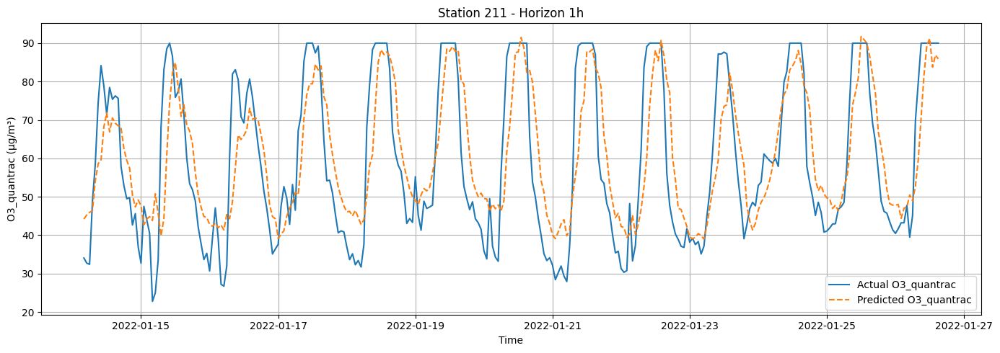

hour = 24
X_test_sid.shape: (578, 60)
y_test_sid.shape: (578, 1)
y_pred_sid.shape: (578,)


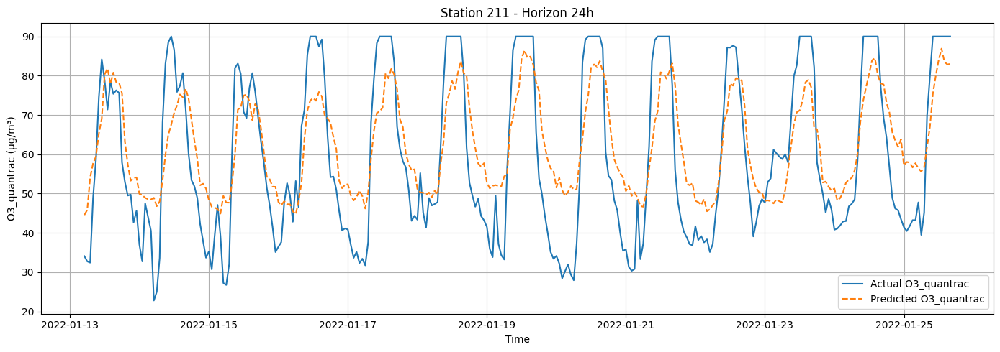

hour = 48
X_test_sid.shape: (574, 60)
y_test_sid.shape: (574, 1)
y_pred_sid.shape: (574,)


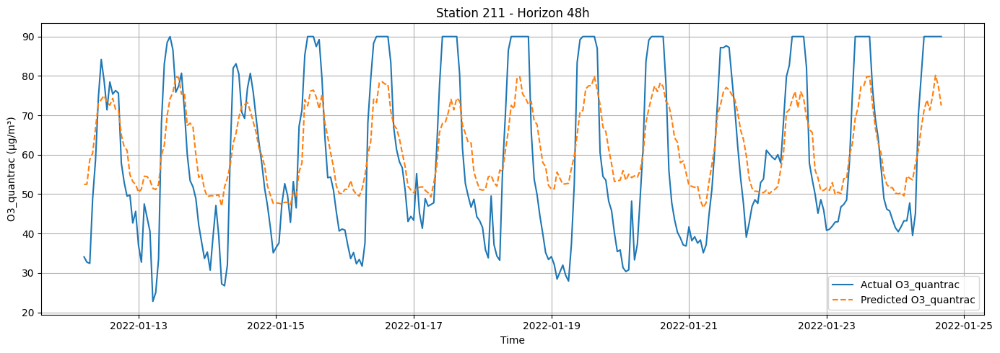

hour = 72
X_test_sid.shape: (570, 60)
y_test_sid.shape: (570, 1)
y_pred_sid.shape: (570,)


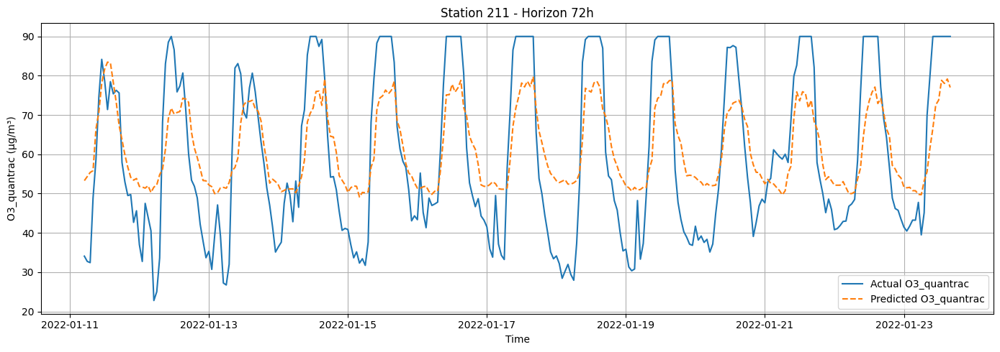

station_id = 212
hour = 1
X_test_sid.shape: (867, 60)
y_test_sid.shape: (867, 1)
y_pred_sid.shape: (867,)


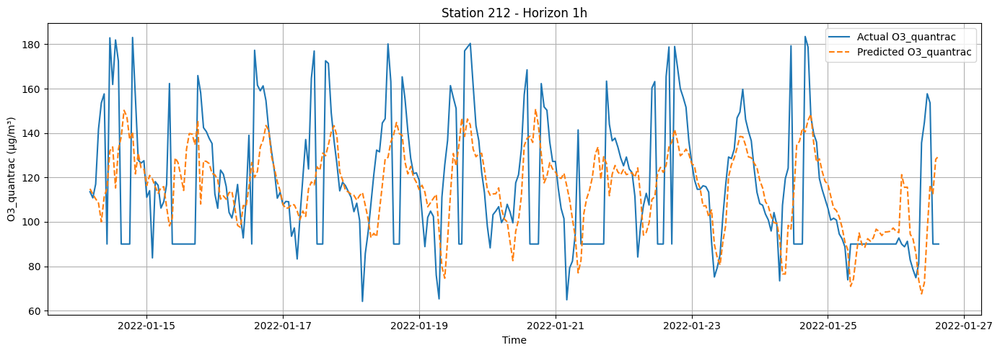

hour = 24
X_test_sid.shape: (864, 60)
y_test_sid.shape: (864, 1)
y_pred_sid.shape: (864,)


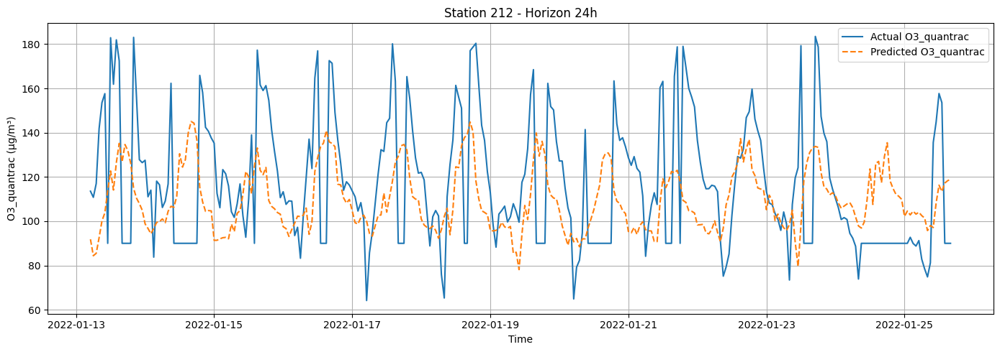

hour = 48
X_test_sid.shape: (860, 60)
y_test_sid.shape: (860, 1)
y_pred_sid.shape: (860,)


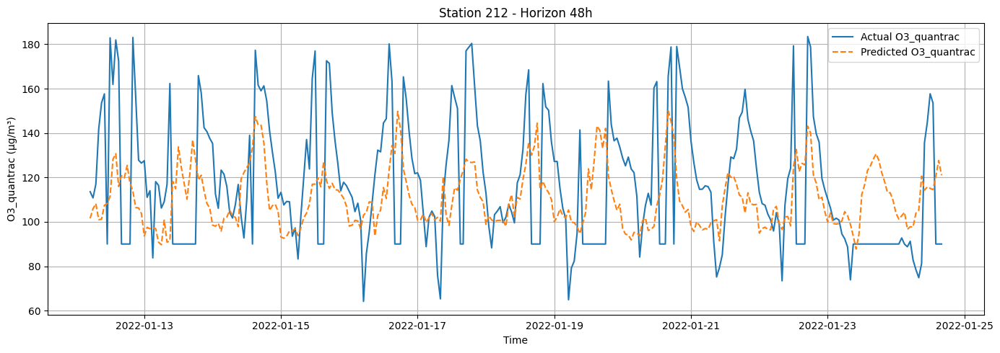

hour = 72
X_test_sid.shape: (857, 60)
y_test_sid.shape: (857, 1)
y_pred_sid.shape: (857,)


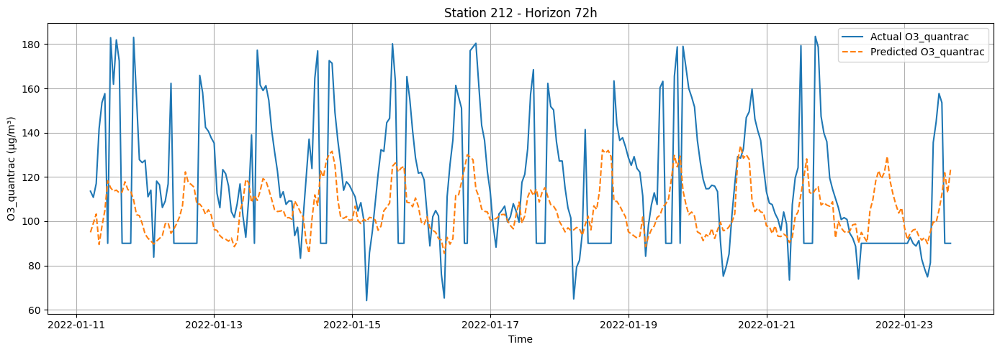

station_id = 213
hour = 1
X_test_sid.shape: (880, 60)
y_test_sid.shape: (880, 1)
y_pred_sid.shape: (880,)


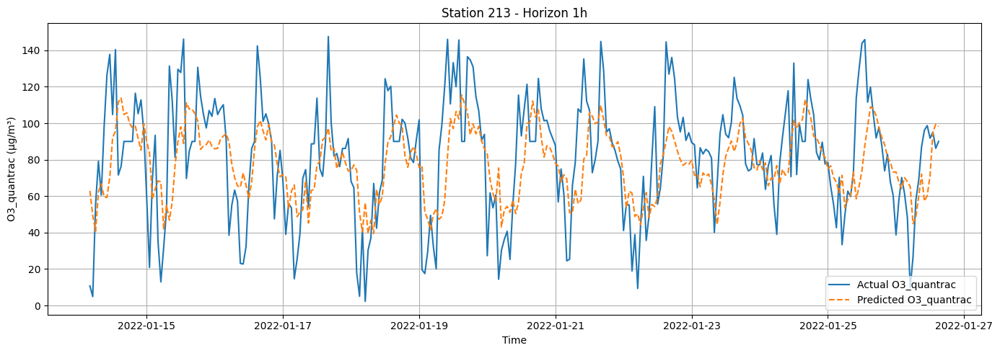

hour = 24
X_test_sid.shape: (877, 60)
y_test_sid.shape: (877, 1)
y_pred_sid.shape: (877,)


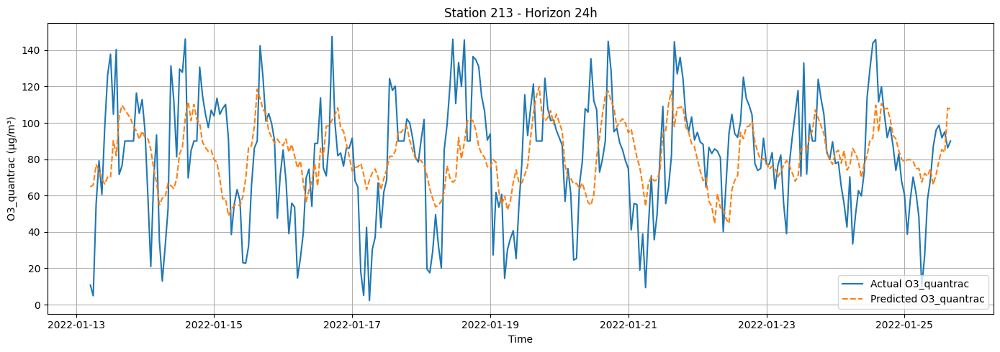

hour = 48
X_test_sid.shape: (873, 60)
y_test_sid.shape: (873, 1)
y_pred_sid.shape: (873,)


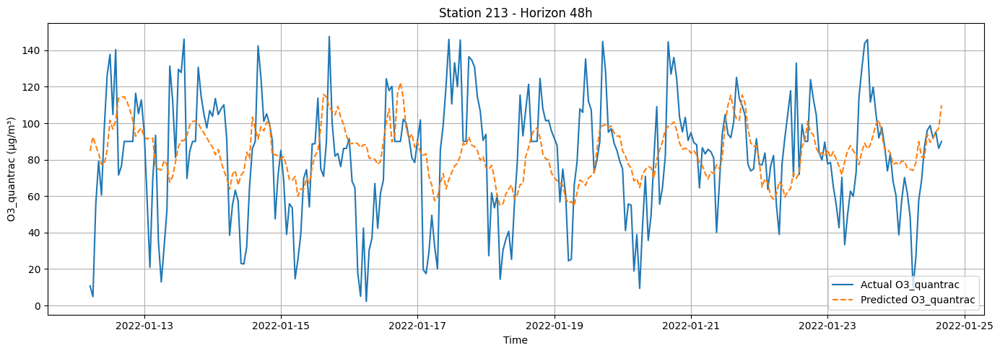

hour = 72
X_test_sid.shape: (869, 60)
y_test_sid.shape: (869, 1)
y_pred_sid.shape: (869,)


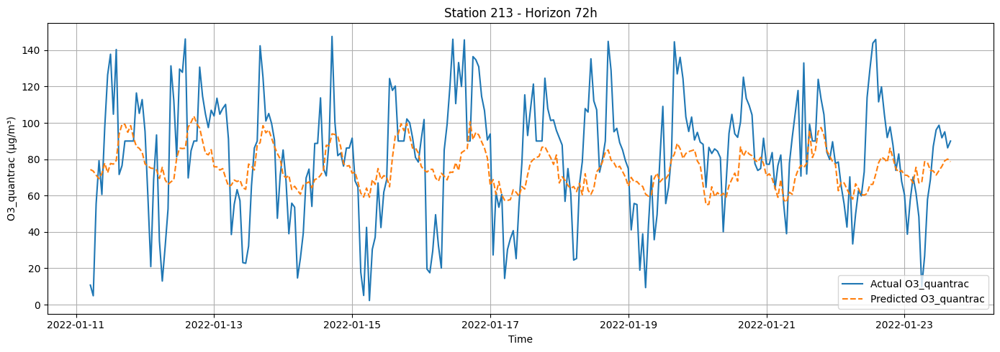

station_id = 214
hour = 1
X_test_sid.shape: (906, 60)
y_test_sid.shape: (906, 1)
y_pred_sid.shape: (906,)


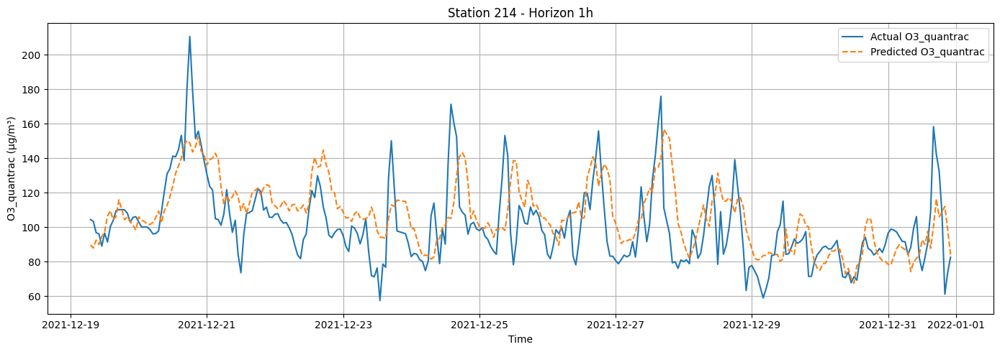

hour = 24
X_test_sid.shape: (902, 60)
y_test_sid.shape: (902, 1)
y_pred_sid.shape: (902,)


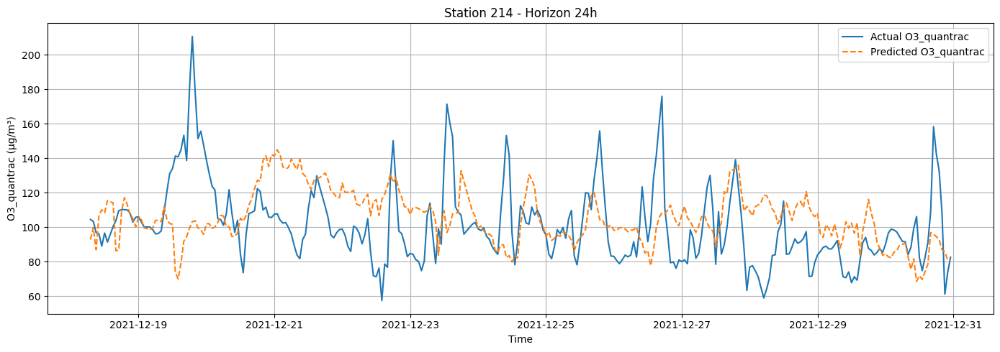

hour = 48
X_test_sid.shape: (899, 60)
y_test_sid.shape: (899, 1)
y_pred_sid.shape: (899,)


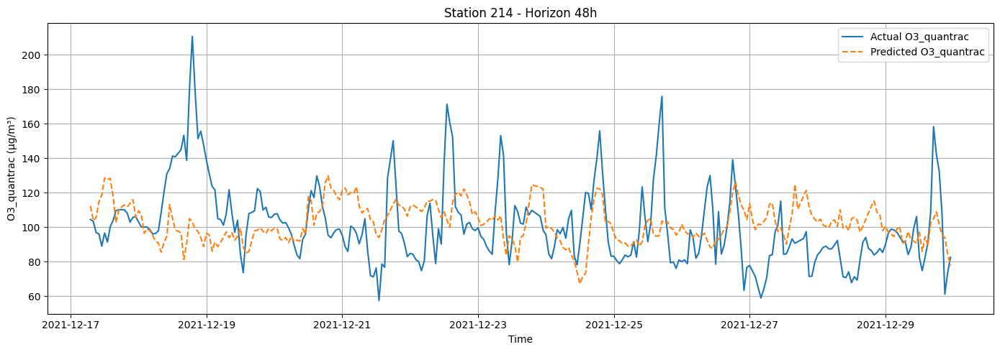

hour = 72
X_test_sid.shape: (895, 60)
y_test_sid.shape: (895, 1)
y_pred_sid.shape: (895,)


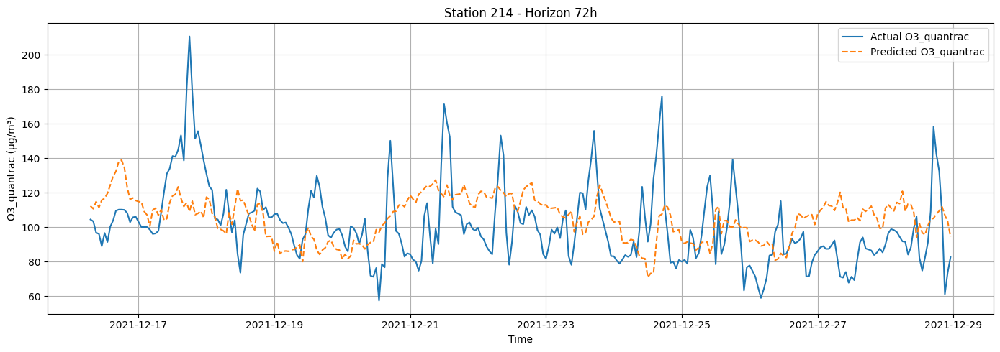

station_id = 215
hour = 1
X_test_sid.shape: (461, 60)
y_test_sid.shape: (461, 1)
y_pred_sid.shape: (461,)


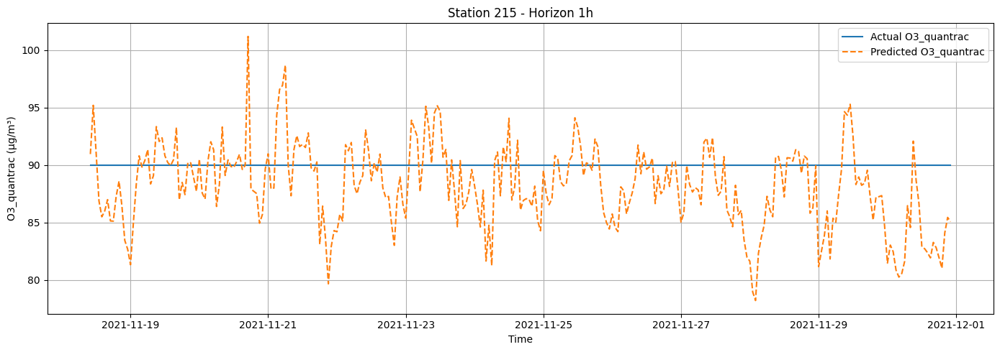

hour = 24
X_test_sid.shape: (458, 60)
y_test_sid.shape: (458, 1)
y_pred_sid.shape: (458,)


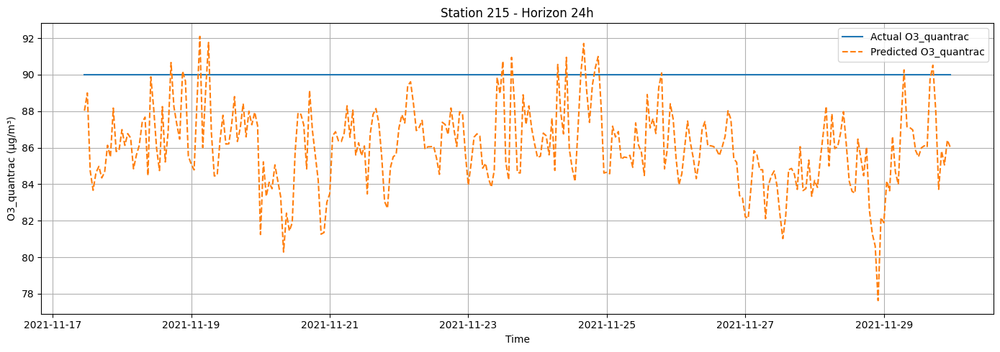

hour = 48
X_test_sid.shape: (454, 60)
y_test_sid.shape: (454, 1)
y_pred_sid.shape: (454,)


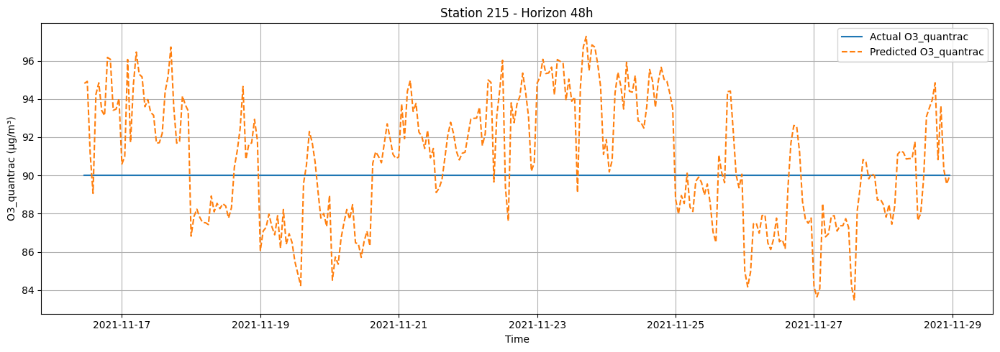

hour = 72
X_test_sid.shape: (450, 60)
y_test_sid.shape: (450, 1)
y_pred_sid.shape: (450,)


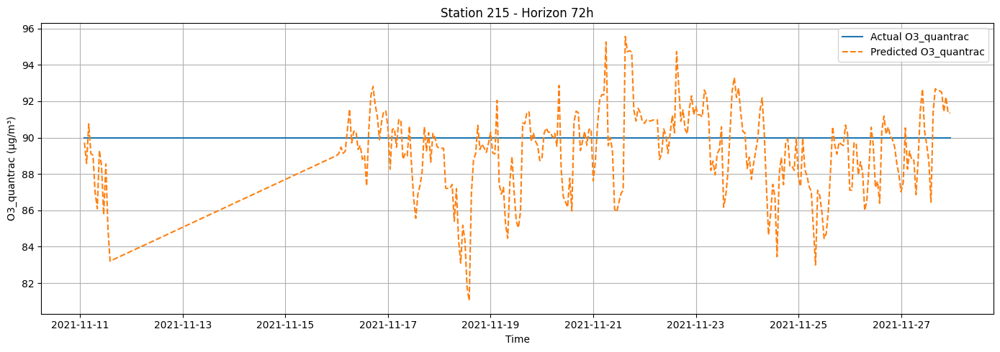

station_id = 216
hour = 1
X_test_sid.shape: (2046, 60)
y_test_sid.shape: (2046, 1)
y_pred_sid.shape: (2046,)


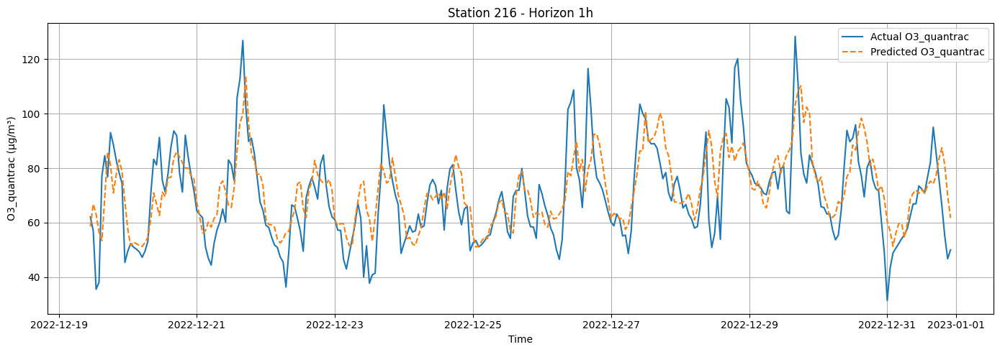

hour = 24
X_test_sid.shape: (2043, 60)
y_test_sid.shape: (2043, 1)
y_pred_sid.shape: (2043,)


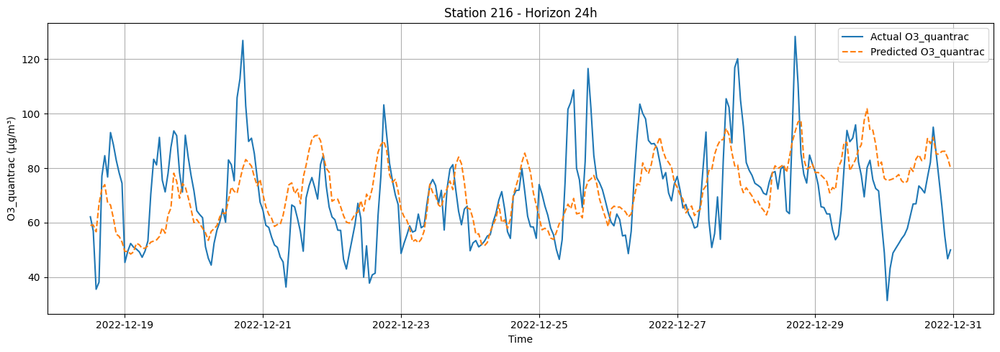

hour = 48
X_test_sid.shape: (2039, 60)
y_test_sid.shape: (2039, 1)
y_pred_sid.shape: (2039,)


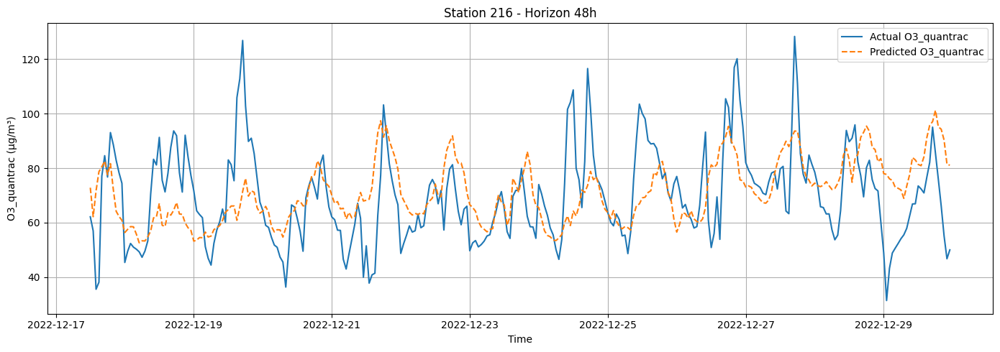

hour = 72
X_test_sid.shape: (2036, 60)
y_test_sid.shape: (2036, 1)
y_pred_sid.shape: (2036,)


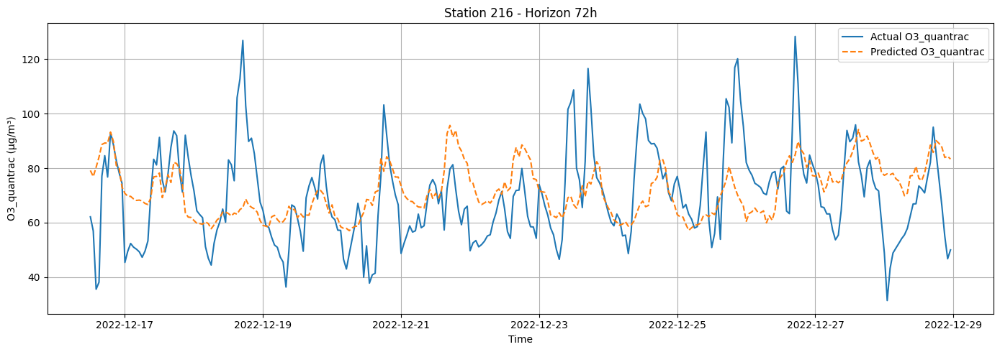

In [18]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_o3, o3_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)

## Training for CO

In [19]:
label = "CO_quantrac"

# Add rolling features for LABEL
df_co = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Station embedding
co_station_to_embedding, _ = learn_station_embeddings(df_co, target_col=label, station_col="station_id", embed_dim=4)
df_co, _ = attach_station_embedding(df_co, co_station_to_embedding, station_col="station_id")
print(co_station_to_embedding)
with open(os.path.join(LIGHTGBM_DIR, f"{label}_station_embedding.pkl"), 'wb') as co_emb_file:
    pickle.dump(co_station_to_embedding, co_emb_file)

# Print dataset
display(df_co)

# Start running model
co_all_metrics = []
co_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_co, horizon_h=h, target_col=label)
    co_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    co_all_metrics.append(metrics_by_station)

co_df_metrics_all = pd.concat(co_all_metrics, ignore_index=True)
co_df_metrics_all = co_df_metrics_all.sort_values(["station", "horizon_h"])
co_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
co_df_metrics_all

[Embed] epoch 001 | train MSE=1166936.2412 | val MSE=1140335.4564
[Embed] epoch 010 | train MSE=1133271.6681 | val MSE=1102984.0626
[Embed] epoch 020 | train MSE=1012663.1579 | val MSE=979906.9911
[Embed] epoch 030 | train MSE=839978.6087 | val MSE=808127.9540
[Embed] epoch 040 | train MSE=657308.5678 | val MSE=629350.8762
[Embed] epoch 050 | train MSE=502019.6377 | val MSE=479894.8422
{211: [-9.1424675, -9.570723, -10.159096, 8.830111], 212: [-1.9979348, -4.0776124, -2.5172603, 1.1684203], 213: [-10.647095, -11.673682, -11.487389, 11.10486], 214: [-12.096144, -10.875263, -13.295887, 10.625471], 215: [-11.388142, -11.457361, -10.267969, 10.315793], 216: [-12.22883, -11.686434, -12.453338, 11.830644]}


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,CO_quantrac_roll24_mean,CO_quantrac_roll24_std,CO_quantrac_roll48_mean,CO_quantrac_roll48_std,CO_quantrac_roll71_mean,CO_quantrac_roll71_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,90.0000000000,NaN,90.0000000000,NaN,90.0000000000,NaN,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,645.3017645000,785.3152865656,645.3017645000,785.3152865656,645.3017645000,785.3152865656,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,822.8335096667,634.7539769726,822.8335096667,634.7539769726,822.8335096667,634.7539769726,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,639.6251322500,634.7201318253,639.6251322500,634.7201318253,639.6251322500,634.7201318253,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,1472.2937525476,516.9231499153,1674.4435738753,871.0825423549,1626.5486109051,845.8444802008,-12.2288303375,-11.6864337921,-12.4533376694,11.8306436539
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,1485.6014108809,536.8199439348,1683.6060280420,876.3799781822,1624.6157414215,843.9032032550,-12.2288303375,-11.6864337921,-12.4533376694,11.8306436539
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,1491.7654608809,545.5955779660,1679.6041738753,873.0368958297,1628.9956559755,846.6296692707,-12.2288303375,-11.6864337921,-12.4533376694,11.8306436539
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,1526.4720886587,599.2656943825,1683.4985155420,877.5756900124,1644.6228249896,857.4628823123,-12.2288303375,-11.6864337921,-12.4533376694,11.8306436539



===== Training LightGBM for horizon = 1h, target_col = CO_quantrac =====

X.shape = (38260, 62)
y.shape = (38260, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag71
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag71
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag71
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag71
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag71
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
Humid_quantrac_lag48
Humid_quantrac_lag71
CO_quantr

,date,target
0,2022-01-02,727.0914538462
1,2022-01-03,756.2255041667
2,2022-01-04,753.0859416667
3,2022-01-05,749.9758250000
4,2022-01-06,767.3655791667
5,2022-01-07,756.1483083333
6,2022-01-08,759.4446500000
7,2022-01-09,727.0470708333
8,2022-01-10,735.6006875000
9,2022-01-11,731.8793708333


,date,target
0,2022-01-02,713.8012907638
1,2022-01-03,757.8989302242
2,2022-01-04,749.5482225883
3,2022-01-05,749.3942407978
4,2022-01-06,746.9149080617
5,2022-01-07,750.5586592993
6,2022-01-08,743.2805777102
7,2022-01-09,724.7626476376
8,2022-01-10,736.7166879889
9,2022-01-11,723.3500429230


sid = 212, grp =                     date  station_id  y_true          y_pred
8783 2021-11-19 17:00:00         212    90.0   48.6628819840
8784 2021-11-19 18:00:00         212    90.0   71.0187939852
8785 2021-11-19 19:00:00         212    90.0   81.8891645317
8786 2021-11-19 20:00:00         212    90.0   82.1333271015
8787 2021-11-19 21:00:00         212    90.0   90.3926260591
...                  ...         ...     ...             ...
9645 2022-01-26 11:00:00         212     0.0   33.4235945871
9646 2022-01-26 12:00:00         212     0.0   54.5542773624
9647 2022-01-26 13:00:00         212    90.0   58.2138957041
9648 2022-01-26 14:00:00         212    90.0  102.2781347143
9649 2022-01-26 15:00:00         212    90.0   73.6055980789

[867 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.da

,date,target
0,2021-11-20,82.5000000000
1,2021-11-21,90.0000000000
2,2021-11-23,82.5000000000
3,2021-11-24,75.0000000000
4,2021-11-25,82.5000000000
5,2021-11-26,73.4045672647
6,2021-11-27,90.0000000000
7,2021-11-28,78.7500000000
8,2021-11-29,86.2500000000
9,2021-11-30,90.0000000000


,date,target
0,2021-11-20,84.7378558531
1,2021-11-21,74.5991945819
2,2021-11-23,84.7822424705
3,2021-11-24,71.0208748979
4,2021-11-25,82.2509432794
5,2021-11-26,78.7582082717
6,2021-11-27,86.5420069841
7,2021-11-28,75.9644683890
8,2021-11-29,80.5469053889
9,2021-11-30,84.9815547082


sid = 213, grp =                      date  station_id        y_true           y_pred
14634 2021-12-20 20:00:00         213  1601.1530000  1231.3555813491
14635 2021-12-20 21:00:00         213  1306.4400000  1279.8976105164
14636 2021-12-20 22:00:00         213   992.8180000  1158.3697514901
14637 2021-12-20 23:00:00         213   957.6740000  1023.0795564868
14638 2021-12-21 00:00:00         213   938.9430508   925.6058246153
...                   ...         ...           ...              ...
15509 2022-01-26 11:00:00         213   829.5130000  1088.2818429784
15510 2022-01-26 12:00:00         213   732.4850000  1024.4875520469
15511 2022-01-26 13:00:00         213   747.0010000   901.6672936682
15512 2022-01-26 14:00:00         213  1143.5170000   910.9118853816
15513 2022-01-26 15:00:00         213  1573.2942860  1015.7275580942

[880 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), da

,date,target
0,2021-12-21,1255.2726377000
1,2021-12-22,1226.0980621458
2,2021-12-23,1124.3997344708
3,2021-12-24,1388.4261791773
4,2021-12-25,1471.1421595833
5,2021-12-26,793.1582542333
6,2021-12-27,1182.8786234348
7,2021-12-28,1278.5494959478
8,2021-12-29,1033.0129788333
9,2021-12-30,788.3413043792


,date,target
0,2021-12-21,1122.3398920856
1,2021-12-22,1033.5277506901
2,2021-12-23,1149.4778075006
3,2021-12-24,1137.1296054318
4,2021-12-25,1375.5327337246
5,2021-12-26,981.5078945257
6,2021-12-27,998.5056159062
7,2021-12-28,1128.7753264803
8,2021-12-29,1137.0268680156
9,2021-12-30,902.1832725423


sid = 214, grp =                      date  station_id       y_true           y_pred
20644 2021-11-23 16:00:00         214    90.000000   785.8572205088
20645 2021-11-23 17:00:00         214    90.000000   548.4339031397
20646 2021-11-23 18:00:00         214    90.000000   637.5889302803
20647 2021-11-23 19:00:00         214    90.000000   899.8606033037
20648 2021-11-23 20:00:00         214    90.000000   881.3429863527
...                   ...         ...          ...              ...
21545 2021-12-31 18:00:00         214  2896.897000  1027.3241992165
21546 2021-12-31 19:00:00         214  2935.670000  1142.8032797322
21547 2021-12-31 20:00:00         214  1193.962222  1227.1361314714
21548 2021-12-31 21:00:00         214  1136.068000  1059.8174916699
21549 2021-12-31 22:00:00         214   957.101000   981.9618307707

[906 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26), datetime.date(

,date,target
0,2021-11-24,1165.0799075542
1,2021-11-25,924.4349433917
2,2021-11-26,839.7307195375
3,2021-11-27,934.1588303542
4,2021-11-28,968.3780071917
5,2021-11-29,890.8086436167
6,2021-11-30,941.4998904292
7,2021-12-01,959.7216568125
8,2021-12-02,1142.7490615042
9,2021-12-03,937.3608743167


,date,target
0,2021-11-24,906.5584134928
1,2021-11-25,965.3983340796
2,2021-11-26,872.9394749655
3,2021-11-27,860.6527747005
4,2021-11-28,898.2419531014
5,2021-11-29,878.8149329963
6,2021-11-30,905.2729935227
7,2021-12-01,973.9389085607
8,2021-12-02,949.2670309977
9,2021-12-03,934.1782084901


sid = 215, grp =                      date  station_id    y_true          y_pred
24160 2021-11-07 08:00:00         215  720.7385  775.5791471609
24161 2021-11-07 09:00:00         215  726.4876  763.9196886706
24162 2021-11-07 10:00:00         215  752.3108  762.0396823505
24163 2021-11-07 11:00:00         215  765.1460  776.1376156243
24164 2021-11-07 12:00:00         215  754.2972  772.7508783039
...                   ...         ...       ...             ...
24616 2021-11-30 18:00:00         215  816.5250  808.5895017896
24617 2021-11-30 19:00:00         215  787.7604  779.8943656590
24618 2021-11-30 20:00:00         215  783.7112  719.8326436583
24619 2021-11-30 21:00:00         215  739.8194  688.7692493095
24620 2021-11-30 22:00:00         215  754.7174  633.6229397659

[461 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime.date(2021, 11, 16), datetim

,date,target
0,2021-11-07,738.6053562500
1,2021-11-08,723.7769916667
2,2021-11-09,798.0499281250
3,2021-11-10,744.9222833333
4,2021-11-11,787.2166866667
5,2021-11-16,770.7351375000
6,2021-11-17,827.5321708333
7,2021-11-18,839.7792500000
8,2021-11-19,791.3257333333
9,2021-11-20,840.2953652174


,date,target
0,2021-11-07,744.5097998833
1,2021-11-08,738.1887084201
2,2021-11-09,789.4737940763
3,2021-11-10,774.2189083941
4,2021-11-11,789.1908585638
5,2021-11-16,785.6305272673
6,2021-11-17,803.8559271153
7,2021-11-18,828.8150469492
8,2021-11-19,842.1456756615
9,2021-11-20,821.2076049555


sid = 216, grp =                      date  station_id           y_true           y_pred
36214 2022-09-20 19:00:00         216  1619.0904666667  1880.7130996407
36215 2022-09-20 20:00:00         216  1787.0966666667  1496.4494803132
36216 2022-09-20 21:00:00         216  2523.3422666667  1574.2005945631
36217 2022-09-20 22:00:00         216  1585.6421333333  1253.2580571166
36218 2022-09-20 23:00:00         216   789.5276923077  1207.1540251398
...                   ...         ...              ...              ...
38255 2022-12-31 18:00:00         216  2393.5627333333  2031.1572700645
38256 2022-12-31 19:00:00         216  2301.0542000000  1715.3548966183
38257 2022-12-31 20:00:00         216  2773.9180666667  1711.7430467451
38258 2022-12-31 21:00:00         216  1698.9842000000  1785.6875001762
38259 2022-12-31 22:00:00         216  1492.1779333333  1391.2395329029

[2046 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22

,date,target
0,2022-09-21,1000.3263524109
1,2022-09-22,1112.2177892034
2,2022-09-23,1497.8803327422
3,2022-09-24,1459.5626654960
4,2022-09-25,1405.2064474786
...,...,...
82,2022-12-27,2316.5350419382
83,2022-12-28,2149.8431217671
84,2022-12-29,1551.6000178437
85,2022-12-30,1930.1186924252


,date,target
0,2022-09-21,1141.4934480308
1,2022-09-22,1171.3654395847
2,2022-09-23,1289.5698394909
3,2022-09-24,1248.5210340009
4,2022-09-25,1416.9993864989
...,...,...
82,2022-12-27,2148.6785793071
83,2022-12-28,2132.0389131214
84,2022-12-29,1941.3695613975
85,2022-12-30,1946.3194130333


Overall test metrics: {'rmse': 390.77, 'mae': 233.05, 'mape': 29.86, 'mnbe': -11.18, 'r': 0.85, 'n_samples': 5741}

===== Training LightGBM for horizon = 24h, target_col = CO_quantrac =====

X.shape = (38122, 62)
y.shape = (38122, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag71
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag71
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag71
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag71
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag71
Humid_quantrac_la

,date,target
0,2022-01-02,755.2617500000
1,2022-01-03,753.2976333333
2,2022-01-04,750.2822208333
3,2022-01-05,767.1594583333
4,2022-01-06,756.0671333333
5,2022-01-07,760.1601041667
6,2022-01-08,727.2762708333
7,2022-01-09,735.5497541667
8,2022-01-10,730.7214333333
9,2022-01-11,744.8777166667


,date,target
0,2022-01-02,731.5120004118
1,2022-01-03,790.8872491532
2,2022-01-04,788.6939328470
3,2022-01-05,725.9902977435
4,2022-01-06,732.8759469658
5,2022-01-07,724.9351141180
6,2022-01-08,734.3467140237
7,2022-01-09,731.1443303423
8,2022-01-10,795.0368731742
9,2022-01-11,804.3775654214


sid = 212, grp =                     date  station_id  y_true          y_pred
8740 2021-11-18 21:00:00         212    90.0  112.3963945861
8741 2021-11-18 22:00:00         212    90.0  112.3963945861
8742 2021-11-18 23:00:00         212    90.0  112.3963945861
8743 2021-11-19 00:00:00         212    90.0  112.3963945861
8744 2021-11-19 01:00:00         212    90.0  112.3963945861
...                  ...         ...     ...             ...
9599 2022-01-25 12:00:00         212     0.0  122.8494030337
9600 2022-01-25 13:00:00         212     0.0  122.8494030337
9601 2022-01-25 14:00:00         212    90.0  125.9158210934
9602 2022-01-25 15:00:00         212    90.0  124.4723254662
9603 2022-01-25 16:00:00         212    90.0  126.4443561716

[864 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.da

,date,target
0,2021-11-19,82.5000000000
1,2021-11-20,90.0000000000
2,2021-11-21,82.5000000000
3,2021-11-23,75.0000000000
4,2021-11-24,82.5000000000
5,2021-11-25,73.4045672647
6,2021-11-26,90.0000000000
7,2021-11-27,78.7500000000
8,2021-11-28,86.2500000000
9,2021-11-29,90.0000000000


,date,target
0,2021-11-19,104.8328086111
1,2021-11-20,110.8284616047
2,2021-11-21,114.7589615274
3,2021-11-23,113.2158103133
4,2021-11-24,102.3803691292
5,2021-11-25,111.4181552976
6,2021-11-26,104.5137020339
7,2021-11-27,114.6543484718
8,2021-11-28,110.4762162182
9,2021-11-29,112.3173296471


sid = 213, grp =                      date  station_id        y_true           y_pred
14568 2021-12-20 00:00:00         213   957.6740000   767.7274914820
14569 2021-12-20 01:00:00         213   938.9430508   771.0737116687
14570 2021-12-20 02:00:00         213  1497.3752540   770.0409871323
14571 2021-12-20 03:00:00         213  1953.3570000   773.7822471990
14572 2021-12-20 04:00:00         213  1948.7730000   752.7997022720
...                   ...         ...           ...              ...
15440 2022-01-25 12:00:00         213   829.5130000  1029.2222505631
15441 2022-01-25 13:00:00         213   732.4850000   926.0052300400
15442 2022-01-25 14:00:00         213   747.0010000   931.8035504629
15443 2022-01-25 15:00:00         213  1143.5170000   892.2848033397
15444 2022-01-25 16:00:00         213  1573.2942860   925.4723939795

[877 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), da

,date,target
0,2021-12-20,1271.2052210333
1,2021-12-21,1195.2436038125
2,2021-12-22,1144.2716928042
3,2021-12-23,1405.1436501208
4,2021-12-24,1443.5384167727
5,2021-12-25,818.6249209000
6,2021-12-26,1158.5573057917
7,2021-12-27,1278.5494959478
8,2021-12-28,1058.9677605217
9,2021-12-29,785.7946377125


,date,target
0,2021-12-20,910.3345967131
1,2021-12-21,1111.0548086859
2,2021-12-22,1051.9420315992
3,2021-12-23,1045.6299935192
4,2021-12-24,1069.6346082380
5,2021-12-25,1062.5257176841
6,2021-12-26,924.2136145511
7,2021-12-27,1060.9237664928
8,2021-12-28,1216.2096889683
9,2021-12-29,1070.2576219249


sid = 214, grp =                      date  station_id        y_true           y_pred
20556 2021-11-22 21:00:00         214    90.0000000   804.4285830910
20557 2021-11-22 22:00:00         214  1624.7252830   908.0438289330
20558 2021-11-22 23:00:00         214   954.2496429   794.0774120031
20559 2021-11-23 00:00:00         214   650.3550000   720.9649100612
20560 2021-11-23 01:00:00         214   625.9070000   700.0390477333
...                   ...         ...           ...              ...
21453 2021-12-30 19:00:00         214  2896.8970000  1403.3428771308
21454 2021-12-30 20:00:00         214  2935.6700000  1139.6872405686
21455 2021-12-30 21:00:00         214  1193.9622220   989.6427890104
21456 2021-12-30 22:00:00         214  1136.0680000   828.7377267940
21457 2021-12-30 23:00:00         214   957.1010000   857.2122569658

[902 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), da

,date,target
0,2021-11-23,1145.2795742208
1,2021-11-24,949.0102767250
2,2021-11-25,834.8522612042
3,2021-11-26,926.0970386875
4,2021-11-27,972.0149655250
5,2021-11-28,900.5416852833
6,2021-11-29,927.0953070958
7,2021-11-30,959.1088651458
8,2021-12-01,1143.2871672750
9,2021-12-02,946.0703518792


,date,target
0,2021-11-23,854.5195967914
1,2021-11-24,823.2295116147
2,2021-11-25,880.2303868621
3,2021-11-26,811.1048888212
4,2021-11-27,794.8044708183
5,2021-11-28,798.1230352687
6,2021-11-29,887.1018925527
7,2021-11-30,871.2820509713
8,2021-12-01,833.3184445850
9,2021-12-02,864.8810752747


sid = 215, grp =                      date  station_id    y_true          y_pred
24048 2021-11-06 12:00:00         215  765.1460  754.6249262325
24049 2021-11-06 13:00:00         215  754.2972  754.6249262325
24050 2021-11-06 14:00:00         215  739.5329  752.9537405170
24051 2021-11-06 15:00:00         215  733.9939  750.3655028322
24052 2021-11-06 16:00:00         215  734.9489  772.9336993315
...                   ...         ...       ...             ...
24501 2021-11-29 19:00:00         215  816.5250  832.8200209681
24502 2021-11-29 20:00:00         215  787.7604  809.7077745087
24503 2021-11-29 21:00:00         215  783.7112  808.6865422929
24504 2021-11-29 22:00:00         215  739.8194  777.2893009883
24505 2021-11-29 23:00:00         215  754.7174  762.1358222985

[458 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime

,date,target
0,2021-11-06,744.1773833333
1,2021-11-07,723.1013291667
2,2021-11-08,797.6798656250
3,2021-11-09,744.9732166667
4,2021-11-10,776.1213375000
5,2021-11-11,776.8784933333
6,2021-11-16,827.4358750000
7,2021-11-17,835.3440708333
8,2021-11-18,796.6140458333
9,2021-11-19,835.2636916667


,date,target
0,2021-11-06,756.6154055696
1,2021-11-07,742.5877793344
2,2021-11-08,763.1243900600
3,2021-11-09,799.2627180539
4,2021-11-10,728.7122761450
5,2021-11-11,737.7586030051
6,2021-11-16,790.2645567012
7,2021-11-17,733.2924253290
8,2021-11-18,769.6687512015
9,2021-11-19,767.9406486627


sid = 216, grp =                      date  station_id           y_true           y_pred
36079 2022-09-19 23:00:00         216  1585.6421333333  1567.8293887053
36080 2022-09-20 00:00:00         216   789.5276923077  1103.7254109637
36081 2022-09-20 01:00:00         216   623.8159245283  1026.7075037618
36082 2022-09-20 02:00:00         216   529.0570666667   935.1071790131
36083 2022-09-20 03:00:00         216   574.7379333333   839.4935843229
...                   ...         ...              ...              ...
38117 2022-12-30 19:00:00         216  2393.5627333333  1768.6432908820
38118 2022-12-30 20:00:00         216  2301.0542000000  1866.1735394935
38119 2022-12-30 21:00:00         216  2773.9180666667  1843.8117005306
38120 2022-12-30 22:00:00         216  1698.9842000000  1669.4077013090
38121 2022-12-30 23:00:00         216  1492.1779333333  1556.1430273200

[2043 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21

,date,target
0,2022-09-20,1004.9674618126
1,2022-09-21,1110.1471780922
2,2022-09-22,1428.8971271866
3,2022-09-23,1517.5716321626
4,2022-09-24,1382.7482808119
...,...,...
82,2022-12-26,2373.7316919382
83,2022-12-27,2158.1972412116
84,2022-12-28,1552.5238289548
85,2022-12-29,1900.4054229807


,date,target
0,2022-09-20,1397.9513938972
1,2022-09-21,1335.1386876445
2,2022-09-22,1303.6392609895
3,2022-09-23,1293.1058587904
4,2022-09-24,1312.7910021168
...,...,...
82,2022-12-26,1905.5648516262
83,2022-12-27,1987.8397141689
84,2022-12-28,2017.3234224724
85,2022-12-29,1789.9073871039


Overall test metrics: {'rmse': 472.04, 'mae': 284.35, 'mape': 35.24, 'mnbe': -18.12, 'r': 0.77, 'n_samples': 5722}

===== Training LightGBM for horizon = 48h, target_col = CO_quantrac =====

X.shape = (37978, 62)
y.shape = (37978, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag71
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag71
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag71
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag71
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag71
Humid_quantrac_la

,date,target
0,2022-01-01,755.2617500000
1,2022-01-02,753.2976333333
2,2022-01-03,750.2822208333
3,2022-01-04,767.1594583333
4,2022-01-05,756.0671333333
5,2022-01-06,760.1601041667
6,2022-01-07,727.2762708333
7,2022-01-08,735.5497541667
8,2022-01-09,730.7214333333
9,2022-01-10,744.8777166667


,date,target
0,2022-01-01,746.7821263071
1,2022-01-02,775.9472140117
2,2022-01-03,749.2202434635
3,2022-01-04,728.6847034145
4,2022-01-05,734.0621843403
5,2022-01-06,728.0009276136
6,2022-01-07,727.0028251930
7,2022-01-08,739.6849722613
8,2022-01-09,794.8229374712
9,2022-01-10,771.3309064584


sid = 212, grp =                     date  station_id  y_true          y_pred
8696 2021-11-18 01:00:00         212    90.0  124.8842745051
8697 2021-11-18 02:00:00         212    90.0  124.8842745051
8698 2021-11-18 03:00:00         212    90.0  124.8842745051
8699 2021-11-18 04:00:00         212    90.0  124.8842745051
8700 2021-11-18 05:00:00         212    90.0  124.8842745051
...                  ...         ...     ...             ...
9551 2022-01-24 12:00:00         212     0.0  201.5236436294
9552 2022-01-24 13:00:00         212     0.0  198.2281498551
9553 2022-01-24 14:00:00         212    90.0  203.9830332264
9554 2022-01-24 15:00:00         212    90.0  198.2281498551
9555 2022-01-24 16:00:00         212    90.0  198.2281498551

[860 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.da

,date,target
0,2021-11-18,82.1739130435
1,2021-11-19,90.0000000000
2,2021-11-20,82.5000000000
3,2021-11-21,75.0000000000
4,2021-11-23,82.5000000000
5,2021-11-24,73.4045672647
6,2021-11-25,90.0000000000
7,2021-11-26,78.7500000000
8,2021-11-27,86.2500000000
9,2021-11-28,90.0000000000


,date,target
0,2021-11-18,124.2299332822
1,2021-11-19,124.3826129009
2,2021-11-20,124.2571974998
3,2021-11-21,128.9358341538
4,2021-11-23,149.2178514017
5,2021-11-24,135.3388879215
6,2021-11-25,124.3826129009
7,2021-11-26,124.6334437030
8,2021-11-27,126.8843135993
9,2021-11-28,127.3385326273


sid = 213, grp =                      date  station_id       y_true          y_pred
14500 2021-12-19 04:00:00         213  1948.773000  784.7933065299
14501 2021-12-19 05:00:00         213  2270.035000  813.3536614514
14502 2021-12-19 06:00:00         213  2631.598000  895.6797644531
14503 2021-12-19 07:00:00         213  3180.341000  853.6307352767
14504 2021-12-19 08:00:00         213  2380.433000  830.6910878983
...                   ...         ...          ...             ...
15368 2022-01-24 12:00:00         213   829.513000  933.3153147277
15369 2022-01-24 13:00:00         213   732.485000  974.6223624717
15370 2022-01-24 14:00:00         213   747.001000  889.9791319547
15371 2022-01-24 15:00:00         213  1143.517000  913.9732787450
15372 2022-01-24 16:00:00         213  1573.294286  915.2027714489

[873 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23

,date,target
0,2021-12-19,1258.0788000000
1,2021-12-20,1195.2436038125
2,2021-12-21,1144.2716928042
3,2021-12-22,1405.1436501208
4,2021-12-23,1423.3112273750
5,2021-12-24,783.8806278909
6,2021-12-25,1158.5573057917
7,2021-12-26,1272.0877867417
8,2021-12-27,1029.0801311739
9,2021-12-28,801.0007958739


,date,target
0,2021-12-19,865.7032760335
1,2021-12-20,822.3704794920
2,2021-12-21,949.8897033621
3,2021-12-22,1004.9484571802
4,2021-12-23,985.6859169123
5,2021-12-24,955.9630565176
6,2021-12-25,1036.3507079594
7,2021-12-26,1006.9655561375
8,2021-12-27,935.2219917472
9,2021-12-28,1023.7229535920


sid = 214, grp =                      date  station_id       y_true           y_pred
20463 2021-11-22 00:00:00         214   650.355000   724.1925965598
20464 2021-11-22 01:00:00         214   625.907000   711.0795014444
20465 2021-11-22 02:00:00         214   774.887000   698.0207792708
20466 2021-11-22 03:00:00         214  1242.123673   769.2209409380
20467 2021-11-22 04:00:00         214  1351.114576   734.6473248963
...                   ...         ...          ...              ...
21357 2021-12-29 19:00:00         214  2896.897000  1302.7592077669
21358 2021-12-29 20:00:00         214  2935.670000  1292.6978569304
21359 2021-12-29 21:00:00         214  1193.962222  1248.2532723192
21360 2021-12-29 22:00:00         214  1136.068000  1070.4131708353
21361 2021-12-29 23:00:00         214   957.101000   960.6589565972

[899 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(

,date,target
0,2021-11-22,1145.2795742208
1,2021-11-23,949.0102767250
2,2021-11-24,834.8522612042
3,2021-11-25,926.0970386875
4,2021-11-26,972.0149655250
5,2021-11-27,900.5416852833
6,2021-11-28,927.0953070958
7,2021-11-29,959.1088651458
8,2021-11-30,1143.2871672750
9,2021-12-01,946.0703518792


,date,target
0,2021-11-22,806.5985121397
1,2021-11-23,782.1169983399
2,2021-11-24,825.5282530097
3,2021-11-25,838.4666625338
4,2021-11-26,848.2069047700
5,2021-11-27,816.2570036253
6,2021-11-28,834.2641966191
7,2021-11-29,850.6552176183
8,2021-11-30,821.7289700810
9,2021-12-01,802.4759024436


sid = 215, grp =                      date  station_id    y_true          y_pred
23932 2021-11-05 16:00:00         215  734.9489  744.9368200719
23933 2021-11-05 17:00:00         215  768.0301  747.5693367895
23934 2021-11-05 18:00:00         215  770.3030  769.4247702587
23935 2021-11-05 19:00:00         215  780.8080  737.5599186927
23936 2021-11-05 20:00:00         215  757.5824  740.5876435699
...                   ...         ...       ...             ...
24381 2021-11-28 19:00:00         215  816.5250  808.5932019931
24382 2021-11-28 20:00:00         215  787.7604  774.2106591656
24383 2021-11-28 21:00:00         215  783.7112  765.1960488758
24384 2021-11-28 22:00:00         215  739.8194  762.5635321582
24385 2021-11-28 23:00:00         215  754.7174  768.4201088600

[454 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.

,date,target
0,2021-11-06,723.1013291667
1,2021-11-07,797.6798656250
2,2021-11-08,744.9732166667
3,2021-11-09,776.1213375000
4,2021-11-10,788.1575208333
5,2021-11-11,839.7238600000
6,2021-11-16,835.3440708333
7,2021-11-17,796.6140458333
8,2021-11-18,835.2636916667
9,2021-11-19,677.3822844583


,date,target
0,2021-11-06,718.5919569856
1,2021-11-07,765.1404157023
2,2021-11-08,743.8887655483
3,2021-11-09,721.6419142046
4,2021-11-10,728.3446932163
5,2021-11-11,739.8622420143
6,2021-11-16,736.7493156358
7,2021-11-17,740.5100035520
8,2021-11-18,748.3838009029
9,2021-11-19,759.3119703496


sid = 216, grp =                      date  station_id           y_true           y_pred
35939 2022-09-19 03:00:00         216   574.7379333333   906.6493031626
35940 2022-09-19 04:00:00         216   592.5133333333   886.8037042954
35941 2022-09-19 05:00:00         216   684.2573333333  1014.5003454047
35942 2022-09-19 06:00:00         216   847.8674666667  1334.7843321752
35943 2022-09-19 07:00:00         216  1299.8978000000  1739.4536786372
...                   ...         ...              ...              ...
37973 2022-12-29 19:00:00         216  2393.5627333333  1780.0194059161
37974 2022-12-29 20:00:00         216  2301.0542000000  1834.1550537908
37975 2022-12-29 21:00:00         216  2773.9180666667  1898.5880005047
37976 2022-12-29 22:00:00         216  1698.9842000000  1799.0092241965
37977 2022-12-29 23:00:00         216  1492.1779333333  1606.4837258634

[2039 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21

,date,target
0,2022-09-19,1056.0389714286
1,2022-09-20,1110.1471780922
2,2022-09-21,1428.8971271866
3,2022-09-22,1517.5716321626
4,2022-09-23,1382.7482808119
...,...,...
82,2022-12-25,2373.7316919382
83,2022-12-26,2158.1972412116
84,2022-12-27,1552.5238289548
85,2022-12-28,1900.4054229807


,date,target
0,2022-09-19,1429.5789549198
1,2022-09-20,1362.3761073419
2,2022-09-21,1350.2035028666
3,2022-09-22,1291.9932348384
4,2022-09-23,1368.8873832665
...,...,...
82,2022-12-25,1646.2400219971
83,2022-12-26,1833.8751982308
84,2022-12-27,1872.6288197229
85,2022-12-28,1811.5567488039


Overall test metrics: {'rmse': 485.7, 'mae': 294.44, 'mape': 38.48, 'mnbe': -18.74, 'r': 0.77, 'n_samples': 5699}

===== Training LightGBM for horizon = 72h, target_col = CO_quantrac =====

X.shape = (37834, 62)
y.shape = (37834, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag71
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag71
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag71
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag71
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag71
Humid_quantrac_lag

,date,target
0,2021-11-30,755.2617500000
1,2022-01-01,753.2976333333
2,2022-01-02,750.2822208333
3,2022-01-03,767.1594583333
4,2022-01-04,756.0671333333
5,2022-01-05,760.1601041667
6,2022-01-06,727.2762708333
7,2022-01-07,735.5497541667
8,2022-01-08,730.7214333333
9,2022-01-09,744.8777166667


,date,target
0,2021-11-30,721.6771102168
1,2022-01-01,766.3430716922
2,2022-01-02,776.0777544519
3,2022-01-03,729.2526409952
4,2022-01-04,717.9965639691
5,2022-01-05,709.6656881492
6,2022-01-06,709.0247132568
7,2022-01-07,725.4680239777
8,2022-01-08,752.7440352525
9,2022-01-09,765.6684723143


sid = 212, grp =                     date  station_id  y_true          y_pred
8651 2021-11-17 04:00:00         212    90.0  213.3049382256
8652 2021-11-17 05:00:00         212    90.0  213.3049382256
8653 2021-11-17 06:00:00         212    90.0  213.3049382256
8654 2021-11-17 07:00:00         212    90.0  220.8966804069
8655 2021-11-17 08:00:00         212    90.0  220.8966804069
...                  ...         ...     ...             ...
9503 2022-01-23 12:00:00         212     0.0  266.1497514962
9504 2022-01-23 13:00:00         212     0.0  266.1497514962
9505 2022-01-23 14:00:00         212    90.0  266.1497514962
9506 2022-01-23 15:00:00         212    90.0  271.8526979176
9507 2022-01-23 16:00:00         212    90.0  275.5681458721

[857 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 17), datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.da

,date,target
0,2021-11-17,81.0000000000
1,2021-11-18,90.0000000000
2,2021-11-19,82.5000000000
3,2021-11-20,75.0000000000
4,2021-11-21,82.5000000000
5,2021-11-23,73.4045672647
6,2021-11-24,90.0000000000
7,2021-11-25,78.7500000000
8,2021-11-26,86.2500000000
9,2021-11-27,90.0000000000


,date,target
0,2021-11-17,137.9933498075
1,2021-11-18,112.3830688792
2,2021-11-19,112.3830688792
3,2021-11-20,112.7443647140
4,2021-11-21,119.8232913252
5,2021-11-23,178.6702227318
6,2021-11-24,140.8589708376
7,2021-11-25,112.7443647140
8,2021-11-26,112.3830688792
9,2021-11-27,118.6235671954


sid = 213, grp =                      date  station_id       y_true           y_pred
14432 2021-12-18 08:00:00         213  2380.433000  1058.9913902258
14433 2021-12-18 09:00:00         213  1467.071000  1120.6415185309
14434 2021-12-18 10:00:00         213   838.872000  1046.9684317330
14435 2021-12-18 11:00:00         213   810.795000  1005.2287352246
14436 2021-12-18 12:00:00         213   546.451000  1071.5121044066
...                   ...         ...          ...              ...
15296 2022-01-23 12:00:00         213   829.513000   932.3180464180
15297 2022-01-23 13:00:00         213   732.485000   960.6649757814
15298 2022-01-23 14:00:00         213   747.001000   998.3217739309
15299 2022-01-23 15:00:00         213  1143.517000   930.8518686791
15300 2022-01-23 16:00:00         213  1573.294286   928.2591704235

[869 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 18), datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(

,date,target
0,2021-12-18,945.6768125000
1,2021-12-19,1195.2436038125
2,2021-12-20,1144.2716928042
3,2021-12-21,1405.1436501208
4,2021-12-22,1423.3112273750
5,2021-12-23,766.1835508500
6,2021-12-24,1211.9247241909
7,2021-12-25,1272.0877867417
8,2021-12-26,1005.2127669500
9,2021-12-27,802.7794745783


,date,target
0,2021-12-18,1012.5692255335
1,2021-12-19,855.7225077559
2,2021-12-20,820.4133328720
3,2021-12-21,1002.1456070123
4,2021-12-22,954.6345544480
5,2021-12-23,1031.9411457198
6,2021-12-24,1076.7233913077
7,2021-12-25,1111.6462130534
8,2021-12-26,1006.6379689879
9,2021-12-27,1046.9142945221


sid = 214, grp =                      date  station_id       y_true           y_pred
20371 2021-11-21 04:00:00         214  1351.114576   845.3559712463
20372 2021-11-21 05:00:00         214  1330.888000  1019.8871498158
20373 2021-11-21 06:00:00         214  1201.008000  1015.4845996208
20374 2021-11-21 07:00:00         214  1462.105000  1003.6439497236
20375 2021-11-21 08:00:00         214  1564.099000   895.6694709738
...                   ...         ...          ...              ...
21261 2021-12-28 19:00:00         214  2896.897000  1509.3448273668
21262 2021-12-28 20:00:00         214  2935.670000  1359.2026260844
21263 2021-12-28 21:00:00         214  1193.962222  1249.8158749992
21264 2021-12-28 22:00:00         214  1136.068000  1224.0924843048
21265 2021-12-28 23:00:00         214   957.101000  1121.5226871039

[895 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(

,date,target
0,2021-11-21,1209.6718554150
1,2021-11-22,949.0102767250
2,2021-11-23,834.8522612042
3,2021-11-24,926.0970386875
4,2021-11-25,972.0149655250
5,2021-11-26,900.5416852833
6,2021-11-27,927.0953070958
7,2021-11-28,959.1088651458
8,2021-11-29,1143.2871672750
9,2021-11-30,946.0703518792


,date,target
0,2021-11-21,890.9947480846
1,2021-11-22,781.1356120685
2,2021-11-23,814.4377153575
3,2021-11-24,824.1874847112
4,2021-11-25,867.7850612888
5,2021-11-26,866.0991930024
6,2021-11-27,866.6725794505
7,2021-11-28,843.5858950473
8,2021-11-29,816.6581724677
9,2021-11-30,815.0710382704


sid = 215, grp =                      date  station_id    y_true          y_pred
23816 2021-11-04 20:00:00         215  757.5824  752.1452201244
23817 2021-11-04 21:00:00         215  721.3115  747.4715412758
23818 2021-11-04 22:00:00         215  712.3918  738.5495151536
23819 2021-11-04 23:00:00         215  691.7829  728.3913445492
23820 2021-11-05 00:00:00         215  688.0202  706.6056514220
...                   ...         ...       ...             ...
24261 2021-11-27 19:00:00         215  816.5250  800.8928618047
24262 2021-11-27 20:00:00         215  787.7604  768.1200234350
24263 2021-11-27 21:00:00         215  783.7112  763.8733826044
24264 2021-11-27 22:00:00         215  739.8194  752.5313727499
24265 2021-11-27 23:00:00         215  754.7174  752.5313727499

[450 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 4), datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.d

,date,target
0,2021-11-05,723.1013291667
1,2021-11-06,797.6798656250
2,2021-11-07,744.9732166667
3,2021-11-08,776.1213375000
4,2021-11-09,788.1575208333
5,2021-11-10,808.5388125000
6,2021-11-11,882.6122733333
7,2021-11-16,796.6140458333
8,2021-11-17,835.2636916667
9,2021-11-18,677.3822844583


,date,target
0,2021-11-05,749.6646865870
1,2021-11-06,770.8568229549
2,2021-11-07,757.9309596871
3,2021-11-08,735.1134200647
4,2021-11-09,724.7982685201
5,2021-11-10,758.4767244429
6,2021-11-11,744.2239327812
7,2021-11-16,748.8652481571
8,2021-11-17,746.2509332634
9,2021-11-18,767.7389486150


sid = 216, grp =                      date  station_id           y_true           y_pred
35798 2022-09-18 06:00:00         216   847.8674666667  1292.5079122364
35799 2022-09-18 07:00:00         216  1299.8978000000  1781.4688658282
35800 2022-09-18 08:00:00         216  1441.7187333333  1811.7364804434
35801 2022-09-18 09:00:00         216  1350.5481333333  1428.4570594943
35802 2022-09-18 10:00:00         216  1094.8117333333  1310.4040776576
...                   ...         ...              ...              ...
37829 2022-12-28 19:00:00         216  2393.5627333333  1766.2148082473
37830 2022-12-28 20:00:00         216  2301.0542000000  1885.2036186022
37831 2022-12-28 21:00:00         216  2773.9180666667  1862.7737513139
37832 2022-12-28 22:00:00         216  1698.9842000000  1572.4366610996
37833 2022-12-28 23:00:00         216  1492.1779333333  1206.1513807117

[2036 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 18), datetime.date(2022, 9, 19), datetime.date(2022, 9, 20

,date,target
0,2022-09-18,1129.1838777778
1,2022-09-19,1110.1471780922
2,2022-09-20,1428.8971271866
3,2022-09-21,1517.5716321626
4,2022-09-22,1382.7482808119
...,...,...
82,2022-12-24,2373.7316919382
83,2022-12-25,2158.1972412116
84,2022-12-26,1552.5238289548
85,2022-12-27,1900.4054229807


,date,target
0,2022-09-18,1394.7539738970
1,2022-09-19,1347.9652255835
2,2022-09-20,1321.2947779573
3,2022-09-21,1389.4751597498
4,2022-09-22,1375.1724410521
...,...,...
82,2022-12-24,1672.7184837895
83,2022-12-25,1727.2715316992
84,2022-12-26,1824.8773489071
85,2022-12-27,1834.8850922505


Overall test metrics: {'rmse': 495.99, 'mae': 308.12, 'mape': 42.65, 'mnbe': -23.29, 'r': 0.75, 'n_samples': 5677}


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,44.06,35.69,4.77,0.99,0.52,581,1.01
6,211,24,46.19,35.76,4.74,-0.54,0.10,578,-0.48
12,211,48,39.29,29.58,3.92,-0.27,0.23,574,-0.22
18,211,72,50.13,38.44,5.06,2.26,0.13,570,2.31
1,212,1,27.69,21.06,22.20,12.63,0.38,867,8.87
7,212,24,43.51,36.20,36.94,-36.47,0.26,864,-44.54
13,212,48,71.75,61.41,64.25,-64.25,-0.01,860,-76.10
19,212,72,107.05,77.43,82.35,-82.35,0.01,857,-96.75
2,213,1,395.92,287.22,70.44,-48.15,0.50,880,3.22
8,213,24,461.27,338.35,72.69,-42.93,0.21,877,8.01


station_id = 211
hour = 1
X_test_sid.shape: (581, 60)
y_test_sid.shape: (581, 1)
y_pred_sid.shape: (581,)


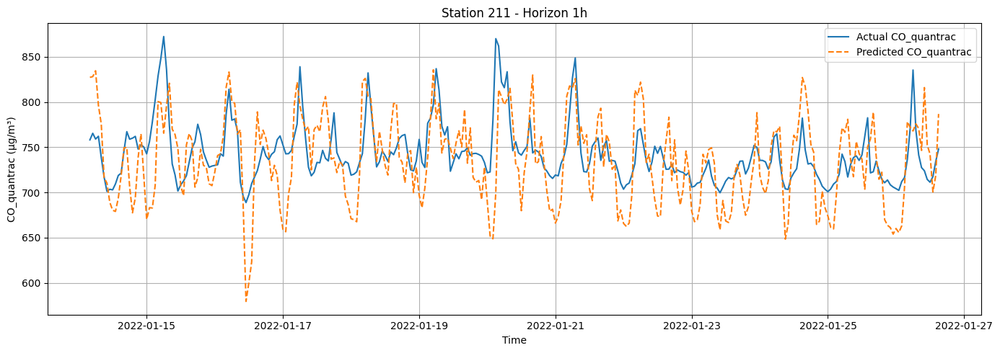

hour = 24
X_test_sid.shape: (578, 60)
y_test_sid.shape: (578, 1)
y_pred_sid.shape: (578,)


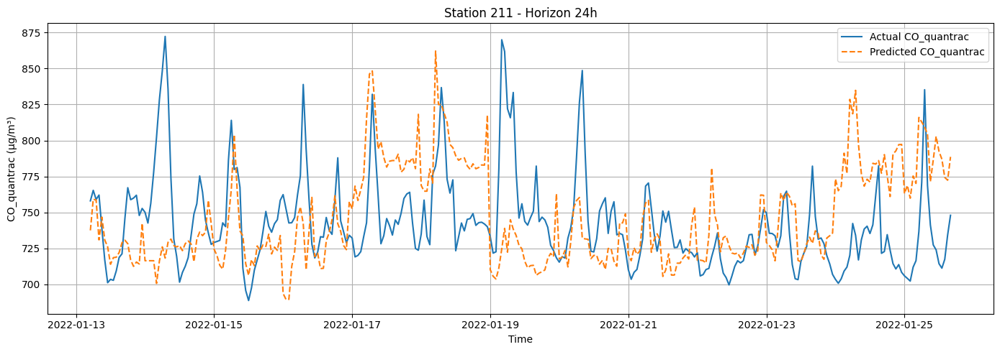

hour = 48
X_test_sid.shape: (574, 60)
y_test_sid.shape: (574, 1)
y_pred_sid.shape: (574,)


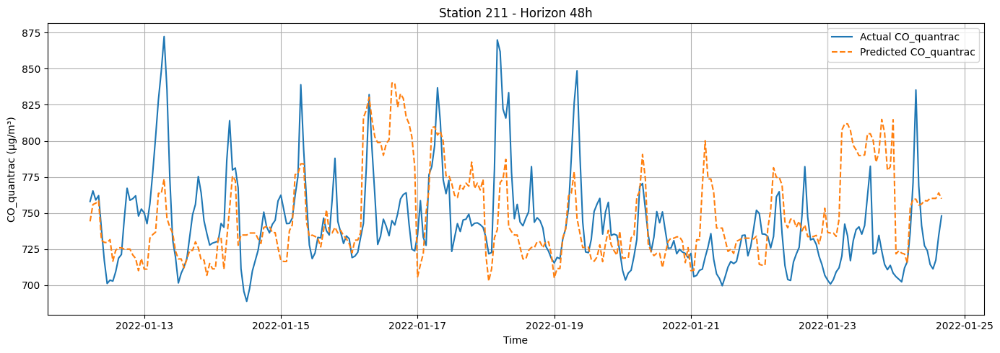

hour = 72
X_test_sid.shape: (570, 60)
y_test_sid.shape: (570, 1)
y_pred_sid.shape: (570,)


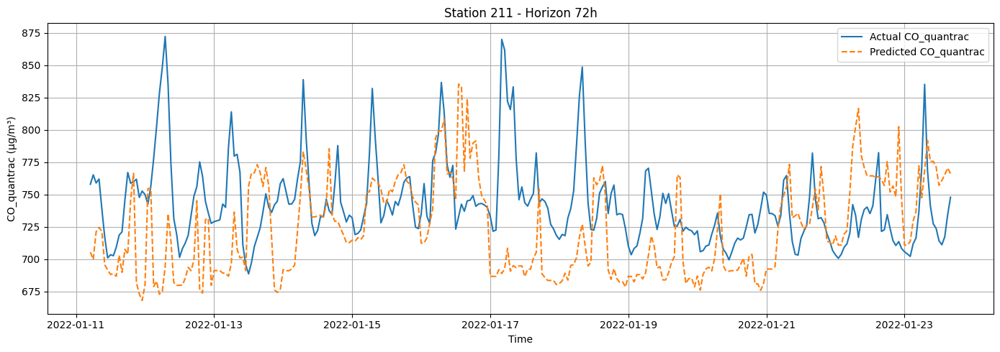

station_id = 212
hour = 1
X_test_sid.shape: (867, 60)
y_test_sid.shape: (867, 1)
y_pred_sid.shape: (867,)


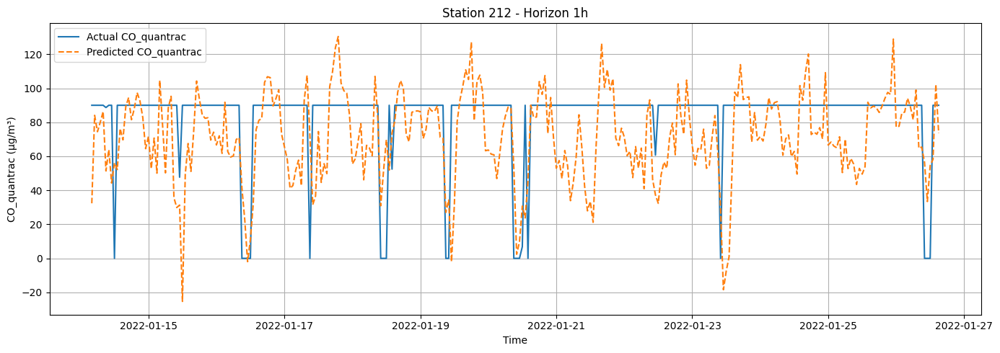

hour = 24
X_test_sid.shape: (864, 60)
y_test_sid.shape: (864, 1)
y_pred_sid.shape: (864,)


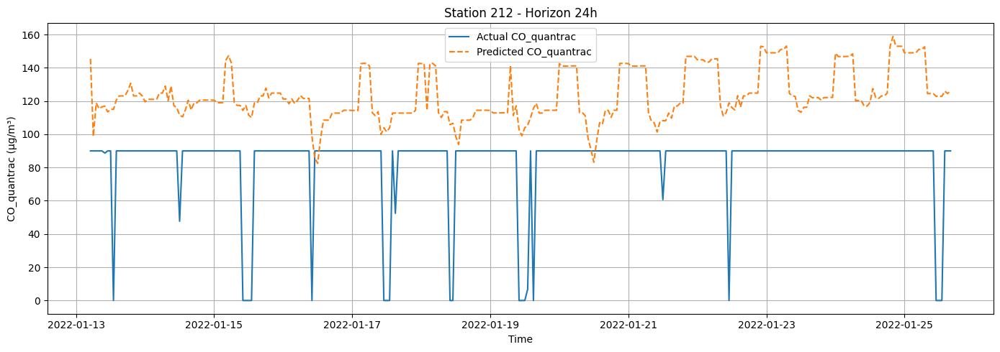

hour = 48
X_test_sid.shape: (860, 60)
y_test_sid.shape: (860, 1)
y_pred_sid.shape: (860,)


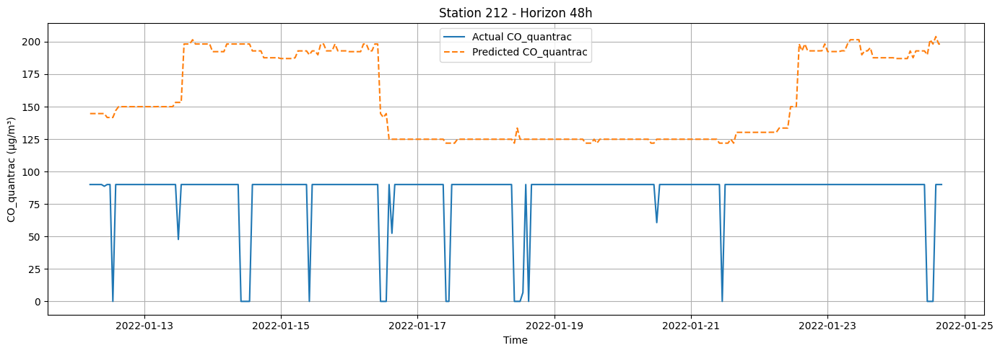

hour = 72
X_test_sid.shape: (857, 60)
y_test_sid.shape: (857, 1)
y_pred_sid.shape: (857,)


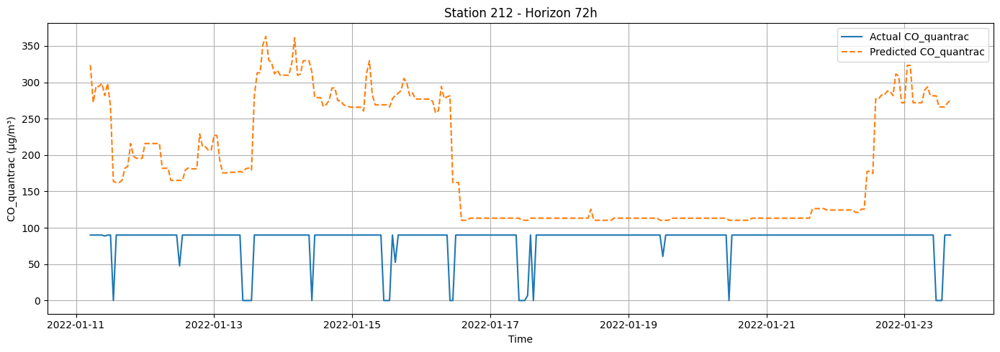

station_id = 213
hour = 1
X_test_sid.shape: (880, 60)
y_test_sid.shape: (880, 1)
y_pred_sid.shape: (880,)


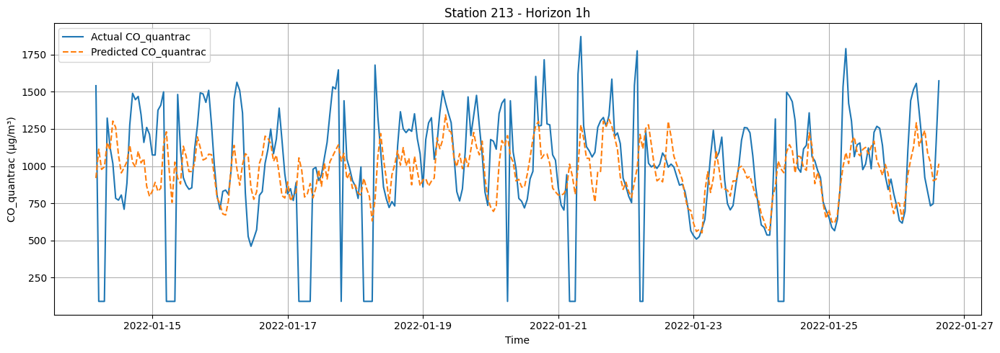

hour = 24
X_test_sid.shape: (877, 60)
y_test_sid.shape: (877, 1)
y_pred_sid.shape: (877,)


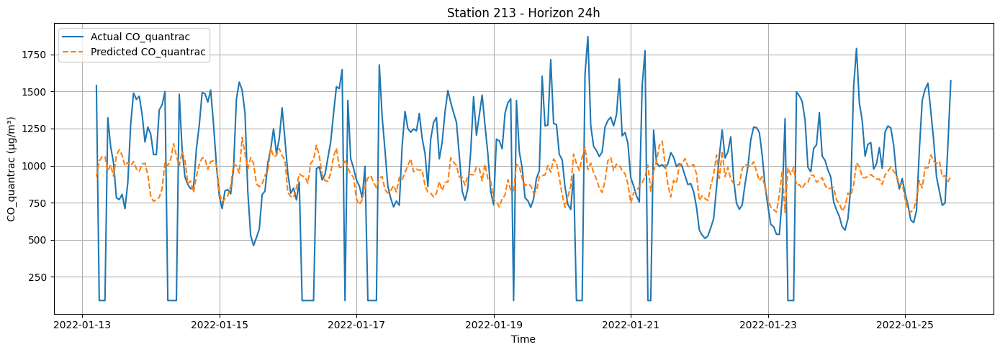

hour = 48
X_test_sid.shape: (873, 60)
y_test_sid.shape: (873, 1)
y_pred_sid.shape: (873,)


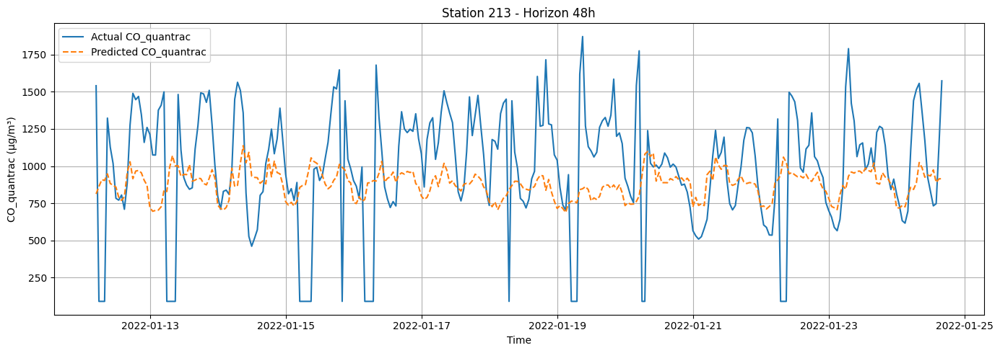

hour = 72
X_test_sid.shape: (869, 60)
y_test_sid.shape: (869, 1)
y_pred_sid.shape: (869,)


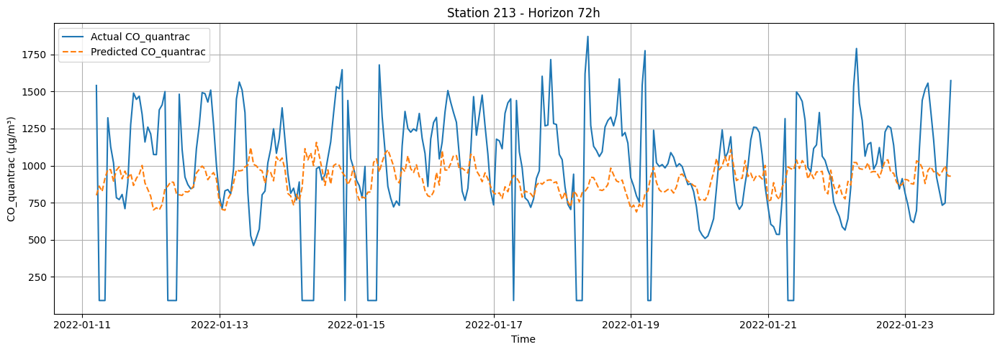

station_id = 214
hour = 1
X_test_sid.shape: (906, 60)
y_test_sid.shape: (906, 1)
y_pred_sid.shape: (906,)


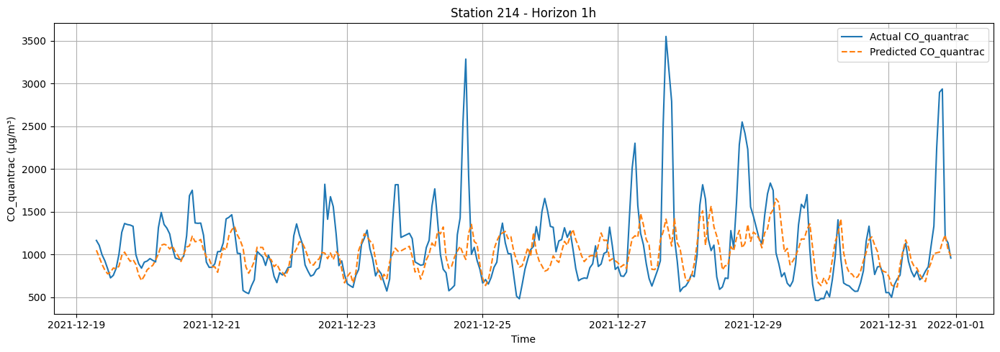

hour = 24
X_test_sid.shape: (902, 60)
y_test_sid.shape: (902, 1)
y_pred_sid.shape: (902,)


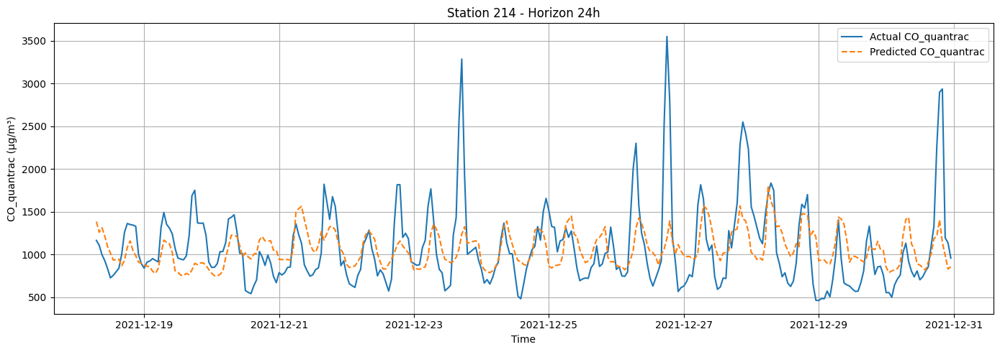

hour = 48
X_test_sid.shape: (899, 60)
y_test_sid.shape: (899, 1)
y_pred_sid.shape: (899,)


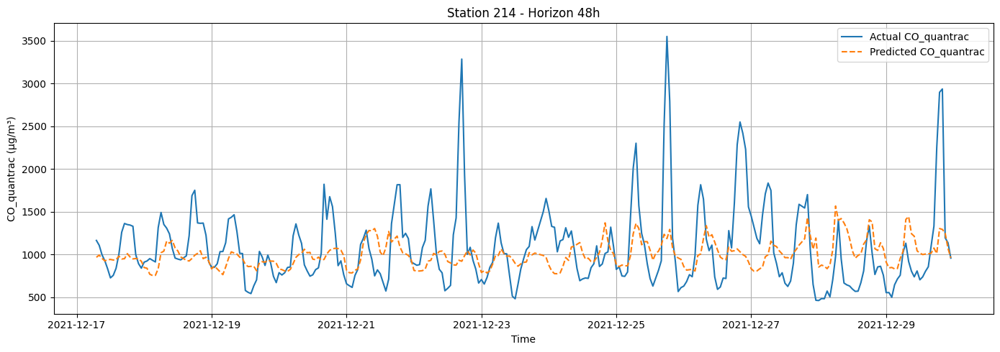

hour = 72
X_test_sid.shape: (895, 60)
y_test_sid.shape: (895, 1)
y_pred_sid.shape: (895,)


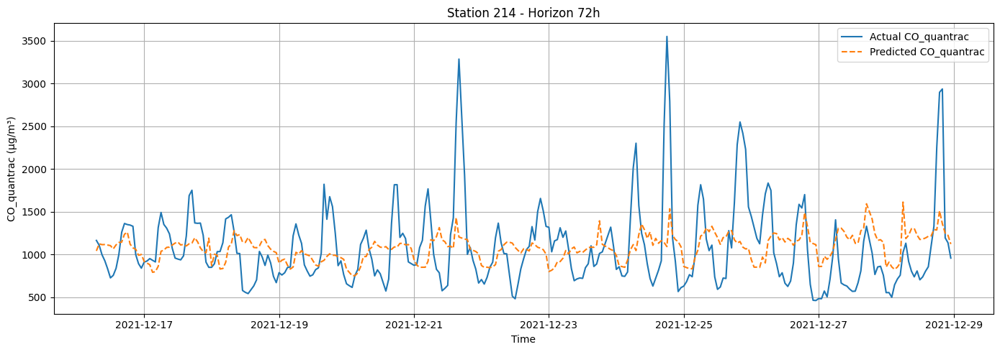

station_id = 215
hour = 1
X_test_sid.shape: (461, 60)
y_test_sid.shape: (461, 1)
y_pred_sid.shape: (461,)


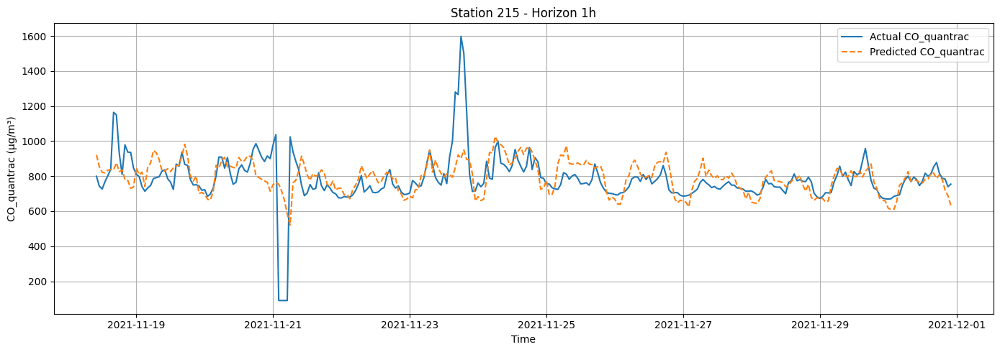

hour = 24
X_test_sid.shape: (458, 60)
y_test_sid.shape: (458, 1)
y_pred_sid.shape: (458,)


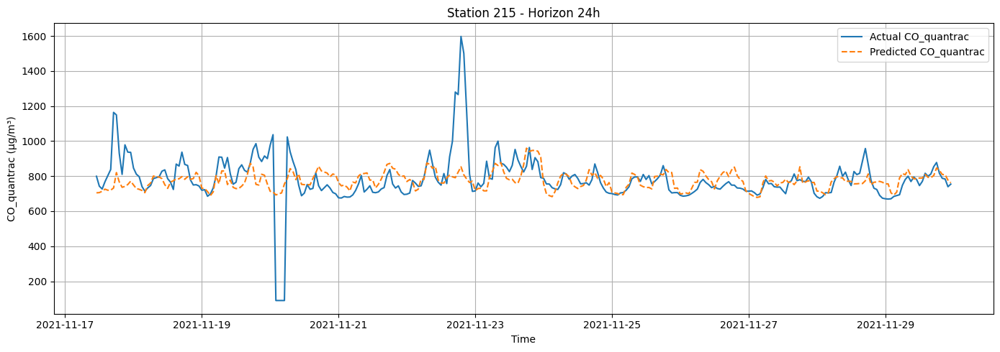

hour = 48
X_test_sid.shape: (454, 60)
y_test_sid.shape: (454, 1)
y_pred_sid.shape: (454,)


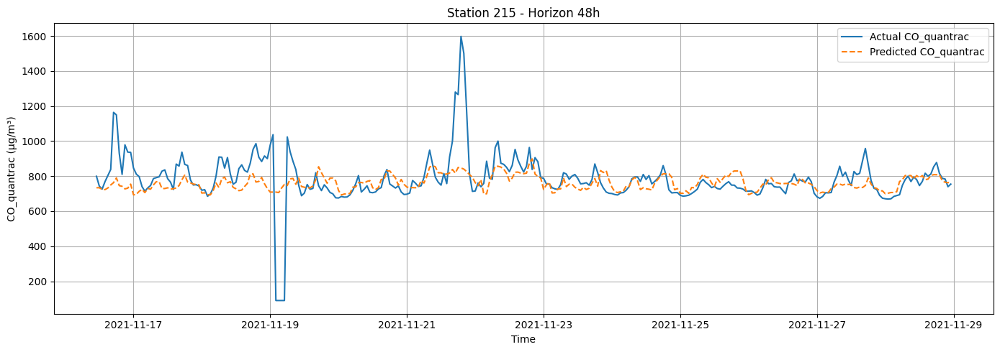

hour = 72
X_test_sid.shape: (450, 60)
y_test_sid.shape: (450, 1)
y_pred_sid.shape: (450,)


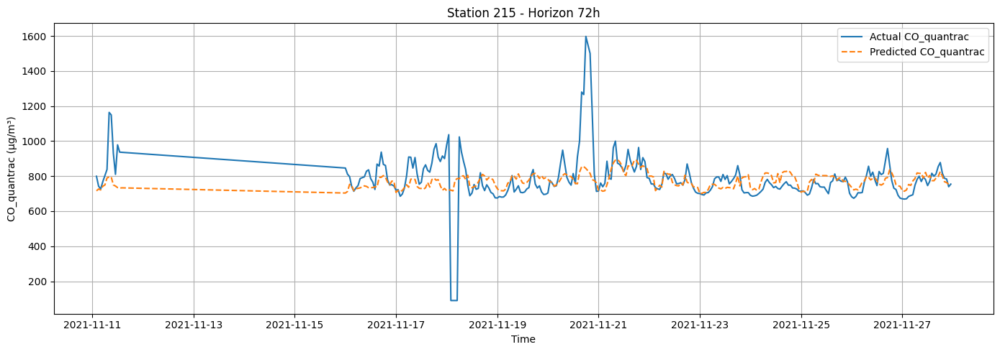

station_id = 216
hour = 1
X_test_sid.shape: (2046, 60)
y_test_sid.shape: (2046, 1)
y_pred_sid.shape: (2046,)


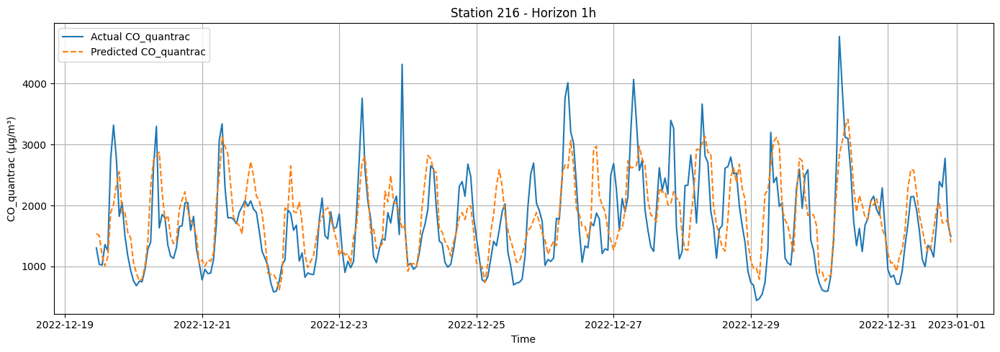

hour = 24
X_test_sid.shape: (2043, 60)
y_test_sid.shape: (2043, 1)
y_pred_sid.shape: (2043,)


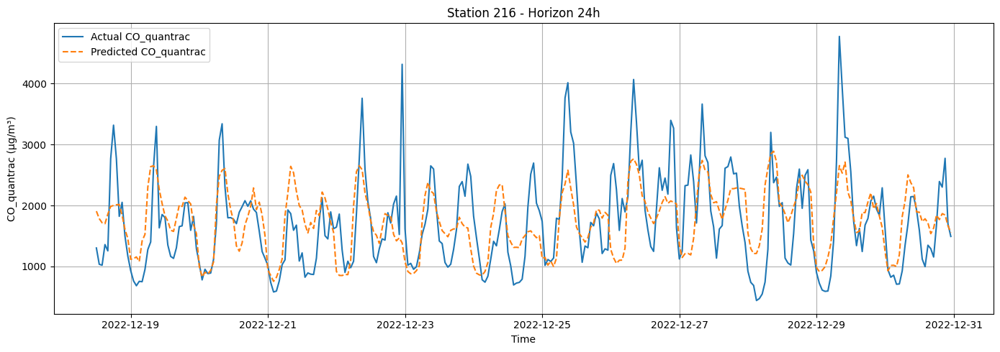

hour = 48
X_test_sid.shape: (2039, 60)
y_test_sid.shape: (2039, 1)
y_pred_sid.shape: (2039,)


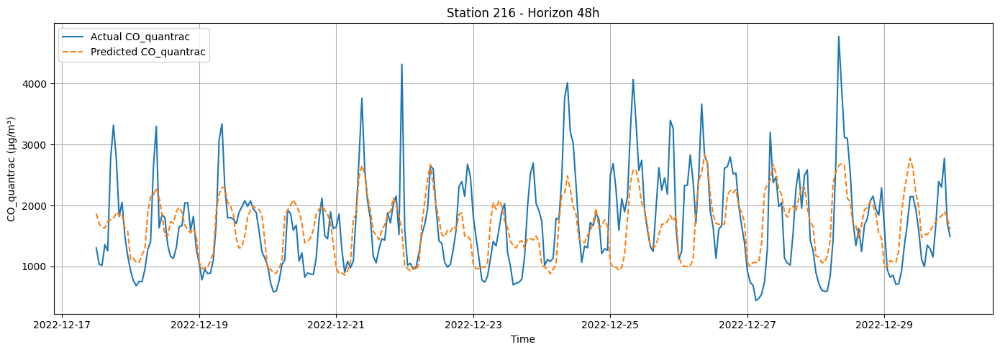

hour = 72
X_test_sid.shape: (2036, 60)
y_test_sid.shape: (2036, 1)
y_pred_sid.shape: (2036,)


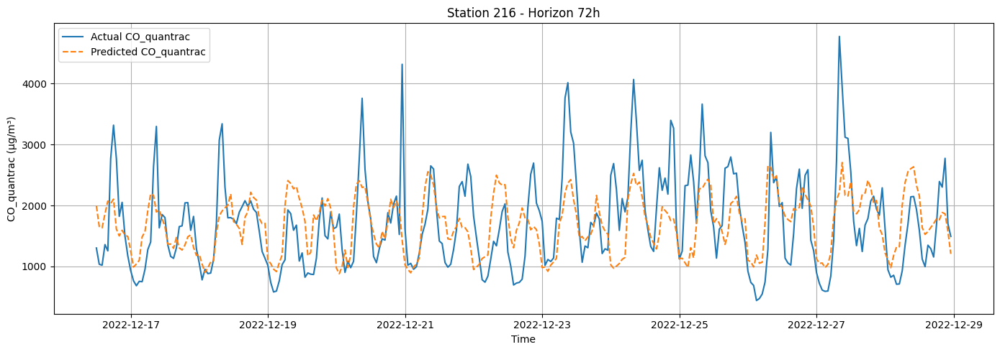

In [20]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_co, co_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)